# Implemented Algorithms and Function

These functions: routines and algorithms are used throughout this notebook for computation and statistical plotting.

The computational / statistical algorithms and the parameters used are inspired from Poldrack, R., Mumford, J., & Nichols, T. (2011). *Handbook of Functional MRI Data Analysis*. Cambridge: Cambridge University Press. and  F., Gregory Ashby. (2019). *Statistical Analysis of fMRI Data*. MIT Press.



#### Imports

In [69]:
from warnings import filterwarnings
filterwarnings('ignore')
import numpy as np
import pandas as pd
from numpy import array
import matplotlib.pyplot as plt


import gzip, shutil
import time
import yaml
import glob

from nilearn import image, plotting
from nilearn.plotting import plot_stat_map
from nilearn.image import concat_imgs, mean_img
from nistats.design_matrix import make_first_level_design_matrix
from nistats.first_level_model import FirstLevelModel
from nistats.second_level_model import SecondLevelModel
from nilearn.plotting import plot_roi
from nilearn.masking import compute_background_mask
from nilearn.image import threshold_img



from nilearn.image import math_img
from nilearn import input_data
from nilearn.input_data import NiftiMasker

from nistats.reporting import plot_design_matrix,plot_contrast_matrix
from nistats.thresholding import map_threshold
from nistats.reporting import get_clusters_table
from nistats.experimental_paradigm import check_events

from sklearn.feature_selection import f_classif, mutual_info_classif, SelectFdr

from sklearn.feature_selection import GenericUnivariateSelect
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier        
    
%matplotlib inline

## GLM

In [3]:
def compute_core_fmri_glm(task,
                          data_path,
                          events_path,
                          motion_param_path,
                          cache_mem_path,
                          analysis_type,
                          param_modulation,
                          t_r,
                          slice_time_ref,
                          hrf_model,
                          drift_model,
                          drift_order,
                          fbr_expected_tr_delay,
                          pre_whitening_spec,
                          apply_trans_mask,
                          roi_img,
                          hpf_cut,
                          smoothing_fwhm,
                          standardize,
                          detrend,minimize_memory):
    
                          
                          
    # Data processing                      

    data = image.load_img(data_path)
    m_img = mean_img(data) # mean niimg for plotting purposes
    motion = pd.read_csv(motion_param_path,sep=',',header=None)
    motion = motion[list(range(1,7))]
    motion_col = ['tx', 'ty', 'tz', 'rx', 'ry', 'rz']
    motion.columns = motion_col



    #Experimental Paradigm Processing

    events = pd.read_csv(events_path,sep='\t')
    events.columns = ['onset','duration','trial_type','modulation']
    events.dropna(inplace=True)
    events.index = range(len(events))
    
    
    
    if analysis_type == 'High_Low_Pleasance':
        
        events['trial_type_desc'] = ['High Pleasance' if x >=50 else 'Low Pleasance' for x in events['modulation'] ]
        
        if param_modulation:
           
            events = events[['onset','duration','trial_type_desc','modulation']]
            events.columns = ['onset','duration','trial_type','modulation']
        else:
            events = events[['onset','duration','trial_type_desc']]
            events.columns = ['onset','duration','trial_type']
            


    elif analysis_type == 'High_Mid_Low_Pleasance':
        
        events['trial_type_desc'] = ['High Pleasance' if x >=67 else 'Mid Pleasance' if x>=34 else 'Low Pleasance' for x in events['modulation'] ]
        
        if param_modulation:
           
            events = events[['onset','duration','trial_type_desc','modulation']]
            events.columns = ['onset','duration','trial_type','modulation']
        else:
            events = events[['onset','duration','trial_type_desc']]
            events.columns = ['onset','duration','trial_type']
            
    
    # Design Matrix Computation + plotting
    
    frametimes = np.linspace(0, (data.shape[3] - 1) * t_r, data.shape[3])
    
    fir_delays = list(range(1,fbr_expected_tr_delay+1)) if fbr_expected_tr_delay != None else None
    
    design_matrix = make_first_level_design_matrix(frametimes,
                       events=events,
                       add_regs=motion,
                       add_reg_names=motion_col,
                       hrf_model=hrf_model,
                       drift_model= drift_model,
                       fir_delays= fir_delays, 
                       drift_order =drift_order)
    
    plot_design_matrix(design_matrix)
    
    # Statistically Enhancing Mask Computation
    
    if apply_trans_mask:
    
    
        masker = input_data.NiftiMasker(mask_img=roi_img,smoothing_fwhm=smoothing_fwhm,
                                standardize=standardize,detrend=detrend,
                                high_pass=hpf_cut,t_r=t_r).fit(data)
      
    else :
        
        masker = input_data.NiftiMasker(mask_img=roi_img).fit(data)
        
        
        
    # GLM instantiation and fit
    
    glm = FirstLevelModel(t_r=t_r,
                      slice_time_ref=slice_time_ref,
                      mask_img=masker,
                      noise_model= pre_whitening_spec,
                      high_pass=hpf_cut,
                      smoothing_fwhm = smoothing_fwhm,
                      standardize=standardize,
                      memory=cache_mem_path,
                      minimize_memory=minimize_memory, 
                      verbose=1)

    glm = glm.fit(data,design_matrices=design_matrix)
    
    return glm, design_matrix

## Statistical Plotting

In [4]:
def top_cluster_stat_results(data,task,glm,z_map,threshold,table,bg_img):
    
    # Top Cluster Selection + Masking
    coords = table.loc[range(1, 7), ['X', 'Y', 'Z']].values
    masker = input_data.NiftiSpheresMasker(coords,standardize=True)
    real_timeseries = masker.fit_transform(data)
    predicted_timeseries = masker.fit_transform(glm.predicted[0])

    
    


    # PLOT 1
    fig1, axs1 = plt.subplots(2, 3)
    for i in range(0, 3):
        axs1[0, i].set_title(' Top {} Activated Cluster \n(cluster peak voxel at coord {})'.format(i+1,coords[i]))
        axs1[0, i].plot(real_timeseries[:, i], c='blue', lw=2,label = 'Actual Bold Signal')
        axs1[0, i].plot(predicted_timeseries[:, i], c='r',  ls='-', lw=2,label= 'Predicted Bold Signal')
        axs1[0, i].set_xlabel('Time')
        axs1[0, i].set_ylabel('Signal intensity', labelpad=0)
        axs1[0, i].legend()
        roi_img = plotting.plot_stat_map(
            z_map, cut_coords=[coords[i][2]], threshold=threshold, figure=fig1,
            axes=axs1[1, i], display_mode='z', colorbar=False, bg_img=bg_img,title='{} Task : Low Pleasance (fdr=0.05, threshold = {})'.format(task,threshold))
        roi_img.add_markers([coords[i]], 'green', 300)
    fig1.set_size_inches(50, 19)
    plt.show()


    #PLOT 2
    fig2, axs2 = plt.subplots(2, 3)
    for i in range(3, 6):
        axs2[0, i-3].set_title(' Top {} Activated Cluster \n(cluster peak voxel at coord {})'.format(i+1,coords[i]))
        axs2[0, i-3].plot(real_timeseries[:, i], c='blue', lw=2,label = 'Actual Bold Signal')
        axs2[0, i-3].plot(predicted_timeseries[:, i], c='r',  ls='-', lw=2,label= 'Predicted Bold Signal')
        axs2[0, i-3].set_xlabel('Time')
        axs2[0, i-3].set_ylabel('Signal intensity', labelpad=0)
        axs2[0, i-3].legend()
        roi_img = plotting.plot_stat_map(
            z_map, cut_coords=[coords[i][2]], threshold=threshold, figure=fig2,
            axes=axs2[1, i-3], display_mode='z', colorbar=False, bg_img=bg_img,title='{} Task : Low Pleasance (fdr=0.05, threshold = {})'.format(task,threshold))
        roi_img.add_markers([coords[i]], 'green', 300)
    fig2.set_size_inches(50, 19)
    plt.show()

        

In [5]:
def stat_result(z_map,contrast_name,task,alpha,method,bg_img):
    
    _, threshold = map_threshold(z_map, alpha=alpha, height_control=method)
    table = get_clusters_table(z_map, stat_threshold=threshold)
    plot_stat_map(z_map, bg_img=bg_img, threshold=threshold,
                   black_bg=True,
                  title='{} Task : {} ({}={}, threshold = {})'.format(task,contrast_name,method,alpha,threshold))
    plt.show()
    return table, threshold

## MVPA

In [6]:
def fbr_separate_method_comp(task,
                          data_path,
                          events_path,
                          motion_param_path,
                          cache_mem_path,
                          activity_mat_saving_path,
                          analysis_type,
                          param_modulation,
                          t_r,
                          drift_model,
                          drift_order,
                          fbr_expected_tr_delay,
                          pre_whitening_spec,
                          apply_trans_mask,
                          roi_img,  
                          hpf_cut,
                          smoothing_fwhm,
                          standardize,
                          detrend,minimize_memory):
    
    
    output_activity_matrices = dict()                          
    # Data processing                      

    data = image.load_img(data_path)
    m_img = mean_img(data) # mean niimg for plotting purposes
    motion = pd.read_csv(motion_param_path,sep=',',header=None)
    motion = motion[list(range(1,7))]
    motion_col = ['tx', 'ty', 'tz', 'rx', 'ry', 'rz']
    motion.columns = motion_col


    #Experimental Paradigm Processing

    events = pd.read_csv(events_path,sep='\t')
    events.columns = ['onset','duration','trial_type','modulation']
    events.dropna(inplace=True)
    events.index = range(len(events))
    
    
    
    if analysis_type == 'High_Low_Pleasance':
        
        events['trial_type_desc'] = ['High Pleasance' if x >=50 else 'Low Pleasance' for x in events['modulation'] ]
        
        if param_modulation:
           
            events = events[['onset','duration','trial_type_desc','modulation']]
            events.columns = ['onset','duration','trial_type','modulation']
        else:
            events = events[['onset','duration','trial_type_desc']]
            events.columns = ['onset','duration','trial_type']
            


    elif analysis_type == 'High_Mid_Low_Pleasance':
        
        events['trial_type_desc'] = ['High Pleasance' if x >=67 else 'Mid Pleasance' if x>=34 else 'Low Pleasance' for x in events['modulation'] ]
        
        if param_modulation:
           
            events = events[['onset','duration','trial_type_desc','modulation']]
            events.columns = ['onset','duration','trial_type','modulation']
        else:
            events = events[['onset','duration','trial_type_desc']]
            events.columns = ['onset','duration','trial_type']
            
            
            
    #  FBR - Separate event matrices computation

    
    mvpa_events_labels= list()
    for i in range(len(events['trial_type'])):
    
        mvpa_event_label = events['trial_type'][i]

        vars()['events_{}_{}'.format(mvpa_event_label.replace(' ',''),i+1)] = events.copy()

        mvpa_events_labels.append('{}_{}'.format(mvpa_event_label.replace(' ',''),i+1))

        trial_type_treated = ['{}_{}'.format(mvpa_event_label,i+1) if k == i else 'Nuisance Event' for k in  range(len(events['trial_type']))]

        vars()['events_{}_{}'.format(mvpa_event_label.replace(' ',''),i+1)]['trial_type'] = trial_type_treated



        print('Event {}'.format(i))
        print(vars()['events_{}_{}'.format(mvpa_event_label.replace(' ',''),i+1)])
            
    # Multiple GLM fit
    
    
    for mvpa_label in mvpa_events_labels:
        print('GLM RUN {}'.format(mvpa_label))
        
        # Design Matrix Computation + plotting
        
        frametimes = np.linspace(0, (data.shape[3] - 1) * t_r, data.shape[3])
    
        fir_delays = list(range(1,fbr_expected_tr_delay+1)) if fbr_expected_tr_delay != None else None
    

        design_matrix = make_first_level_design_matrix(frametimes,
                           events=vars()['events_{}'.format(mvpa_label)],
                           add_regs=motion,
                           add_reg_names=motion_col,
                           hrf_model='fir',
                           fir_delays = fir_delays,
                           drift_model= drift_model,
                           drift_order =drift_order)

        plot_design_matrix(design_matrix)

        # Statistically Enhancing Mask Computation

        if apply_trans_mask :
    
    
            masker = input_data.NiftiMasker(mask_img=roi_img,smoothing_fwhm=smoothing_fwhm,
                                standardize=standardize,detrend=detrend,
                                high_pass=hpf_cut,t_r=t_r).fit(data)
      
        else :
        
            masker = input_data.NiftiMasker(mask_img=roi_img).fit(data)


        # GLM instantiation and fit

        glm = FirstLevelModel(t_r=t_r,
                          mask_img=masker,
                          noise_model= pre_whitening_spec,
                          high_pass=hpf_cut,
                          smoothing_fwhm = smoothing_fwhm,
                          standardize=standardize,
                          memory=cache_mem_path,
                          minimize_memory=minimize_memory, 
                          verbose=1)

        glm = glm.fit(data,design_matrices=design_matrix)
        
    
    
        design_matrix = glm.design_matrices_[0]
        plot_design_matrix(design_matrix)
        plt.title('Design Matrix')
        plt.show()

        masker = NiftiMasker()

        vars()['{}_activity_matrix'.format(mvpa_label)] = pd.DataFrame(None)

        for i in range(fbr_expected_tr_delay):
            condition_delay = np.eye(N=1,M=len(design_matrix.columns),k=i)
            plot_contrast_matrix(condition_delay,design_matrix=design_matrix)
            z_map = glm.compute_contrast(condition_delay,
                                      stat_type='t',
                                      output_type='z_score')
            masked_map = masker.fit_transform(z_map)

            vars()['{}_activity_matrix'.format(mvpa_label)] = vars()['{}_activity_matrix'.format(mvpa_label)].append(pd.DataFrame(masked_map))



        print('ACTIVITY MATRIX {}'.format(mvpa_label))
                                         
        if activity_mat_saving_path != None:
                                         
            vars()['{}_activity_matrix'.format(mvpa_label)].to_csv('{}{}_activity_matrix.csv'.format(activity_mat_saving_path,mvpa_label)) 
        
                                         
                                         
    # Control Standardization
                                         
                                         
                                         
    if analysis_type == 'High_Low_Pleasance':

        HP_activity_matrix = list()
        LP_activity_matrix = list()
        
                                         
        for mvpa_label in mvpa_events_labels:
                                         
            if mvpa_label[0] == 'H':
                HP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)])
            else:
                LP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)])
         
        for label in ['HP','LP'] :
             
            activity_matrix = np.stack(vars()['{}_activity_matrix'.format(label)],axis=2)
             
                                         
                                         
            activity_matrix_dim_voxel_mean = activity_matrix.mean(axis=2)
            activity_matrix_dim_voxel_std = activity_matrix.std(axis=2)


            activity_matrix_dim_voxel_mean.shape = (activity_matrix.shape[0],activity_matrix.shape[1],1)
            activity_matrix_dim_voxel_std.shape = (activity_matrix.shape[0],activity_matrix.shape[1],1)


            activity_matrix_c_standardized = (activity_matrix - activity_matrix_dim_voxel_mean)/activity_matrix_dim_voxel_std
                                         
            output_activity_matrices[label] = activity_matrix_c_standardized
                                         
            
            
                                         
    elif analysis_type == 'High_Mid_Low_Pleasance':
                                         
                                         
        
        HP_activity_matrix = list()
        MP_activity_matrix = list() 
        LP_activity_matrix = list()
        
        for mvpa_label in mvpa_events_labels:
            if mvpa_label[0] == 'H':
                HP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)])
            elif mvpa_label[0] == 'M' :
                MP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)])
            else:
                LP_activity_matrix.append(vars()['{}_activity_matrix'.format(mvpa_label)]) 
                                         
         
        for label in ['HP','LP'] :
             
            activity_matrix = np.stack(vars()['{}_activity_matrix'.format(label)],axis=2)
             
                                         
                                         
            activity_matrix_dim_voxel_mean = activity_matrix.mean(axis=2)
            activity_matrix_dim_voxel_std = activity_matrix.std(axis=2)


            activity_matrix_dim_voxel_mean.shape = (activity_matrix.shape[0],activity_matrix.shape[1],1)
            activity_matrix_dim_voxel_std.shape = (activity_matrix.shape[0],activity_matrix.shape[1],1)


            activity_matrix_c_standardized = (activity_matrix - activity_matrix_dim_voxel_mean)/activity_matrix_dim_voxel_std
                                         
            output_activity_matrices[label] = activity_matrix_c_standardized
                                         
                
    # Feature Matrix and Label Vector Computation    
                
    label_vect = list()
    
    for label in output_activity_matrices.keys():
        vec = np.array([label for i in range(output_activity_matrices[label].shape[2])])
        vec.shape = (output_activity_matrices[label].shape[2],1)
        label_vect.append(vec)
        
    y = np.vstack(label_vect)
    
    features_mat = list()

    for label in output_activity_matrices.keys():
        mat = output_activity_matrices[label].copy()
        features_mat.append(mat.reshape(mat.shape[0]*mat.shape[1],mat.shape[2]).T)



    X = np.vstack(features_mat)
        
    
    return  y, X

# I/O

#### Preferences Paradigm Dataset Variables

In [7]:
subject_id = ['01','04','05','06']
ses_id = ['19','15']
n_run_per_task = 2
tasks = ['Houses','Food','Faces','Paintings']
path = 'dataset/'
experiment_data = dict()

####  Preprocessed Experiment Data Files Paths Extraction

In [8]:
for sub in subject_id:
    
    experiment_data[sub] = {'Houses':None,'Food':None, 'Faces':None, 'Paintings':None}
    
    for task in tasks:
        
        experiment_data[sub][task] = {'ap':None,'pa':None}
        
        for direc in ['ap','pa']:
            
            experiment_data[sub][task][direc] = {'nii':None, 'motion_param':None, 'events':None}
            
            experiment_data[sub][task][direc]['nii'] = [f for f in glob.glob(path + "**/ra*func_sub-{}*{}*{}*.nii".format(sub,task,direc), recursive=True)][0]
            experiment_data[sub][task][direc]['motion_param'] = [f for f in glob.glob(path + "**/rp*func_sub-{}*{}*{}*.txt".format(sub,task,direc), recursive=True)][0]
            experiment_data[sub][task][direc]['events'] = [f for f in glob.glob(path + "**/*func_sub-{}*{}*{}*.tsv".format(sub,task,direc), recursive=True)][0]
            
            


####   Preprocessed Experiment Data

In [9]:
print(yaml.dump(experiment_data))

'01':
  Faces:
    ap:
      events: dataset/sub-01/func/sub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-ap_events.tsv
      motion_param: dataset/sub-01/func/rp_asub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-ap_bold.txt
      nii: dataset/sub-01/func/rasub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-ap_bold.nii
    pa:
      events: dataset/sub-01/func/sub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_events.tsv
      motion_param: dataset/sub-01/func/rp_asub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_bold.txt
      nii: dataset/sub-01/func/rasub-01_ses-19_func_sub-01_ses-19_task-PreferenceFaces_dir-pa_bold.nii
  Food:
    ap:
      events: dataset/sub-01/func/sub-01_ses-19_func_sub-01_ses-19_task-PreferenceFood_dir-ap_events.tsv
      motion_param: dataset/sub-01/func/rp_asub-01_ses-19_func_sub-01_ses-19_task-PreferenceFood_dir-ap_bold.txt
      nii: dataset/sub-01/func/rasub-01_ses-19_func_sub-01_ses-19_task-PreferenceFood_dir

## Global  Statistical Computation Parameters

In [10]:
voxel_dim = 1.5
t_r = 2
pre_whitening_spec = 'ar1'
smoothing_fwhm = 2*voxel_dim 
slice_time_ref = 0. # Matching with STC done in preproc
cache_mem_path = 'cache_mem/'

# Multi Voxel Pattern Analysis

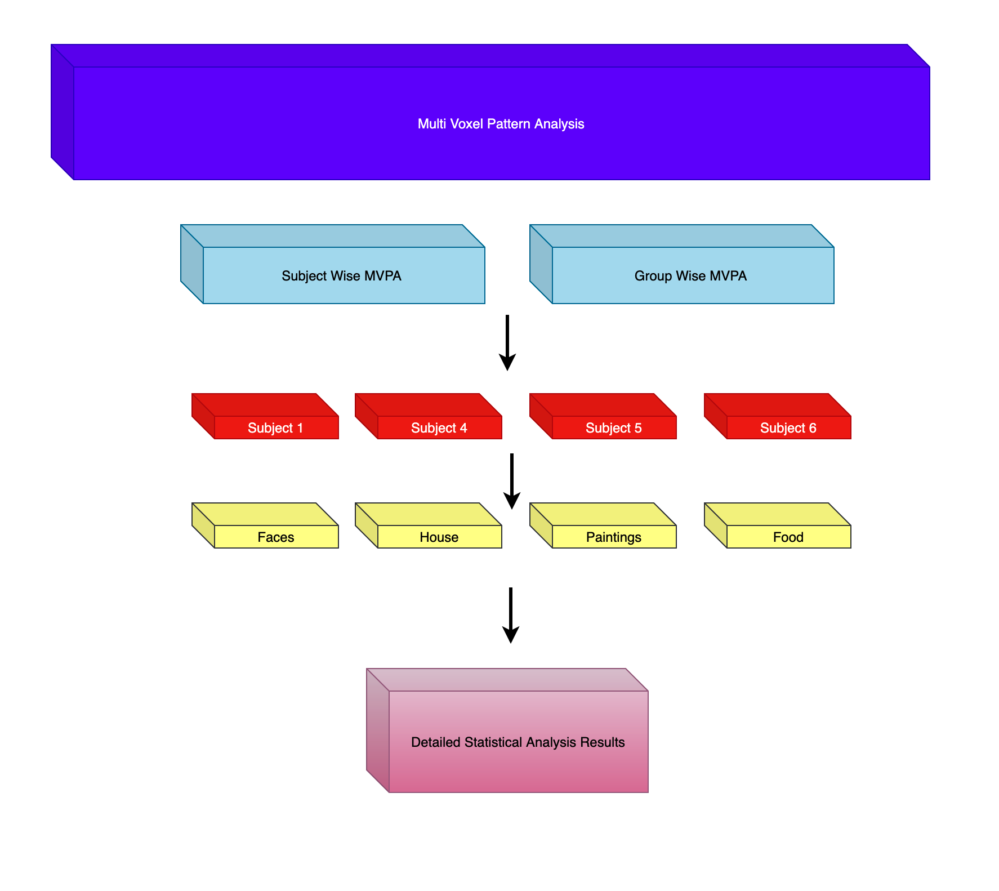

## Subject-Wise MVPA

### Subject 1

#### Faces Task

#### On the Basis of the results of the FLA, let's select a ROI to perform MVPA for High Pleasance / Low Pleasance Classification

In [38]:
# For Global pleasance, let's extracted the priouvsly computed z_map on the best model
# for FDR = 0.05

In [47]:
z_map_pl = image.load_img('mvpa/z_map_test.nii.gz')

In [48]:
# Z_map plot and ROI mask computation + plot

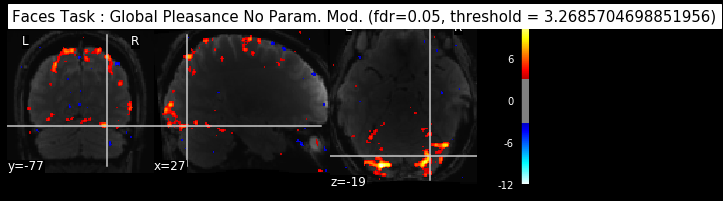

In [52]:
table, threshold = stat_result(z_map=z_map_pl,
                               contrast_name='Global Pleasance No Param. Mod.',
                               task=task,alpha=.05,method='fdr',bg_img=m_img)

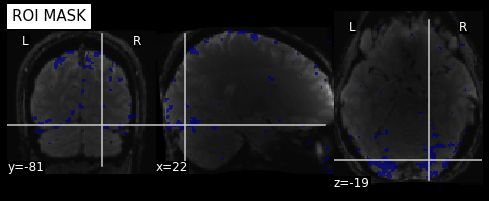

In [56]:
thres_img = threshold_img(z_map_pl, threshold=threshold)

mask_img = compute_background_mask(thres_img)

plot_roi(mask_img, m_img,cut_coords=(22,-81,-19),title='ROI MASK')

##### As we have only 60 events presentation, this ROI involves too much voxel to be suitable for any kind of effective calculation / result. Indeed, the curse of dimensionnality plays a great role and is emphasized by the fact that we'll use FBR separate method to generate the activity matrix ( spatio-temporal search space)

##### Let's reduce the impact of this effect by beiing quite severe in the ROI fdr mask generation, let's test FDR = 0.001 threshold

In [57]:
_, threshold = map_threshold(z_map_pl, alpha=0.001, height_control='fdr')

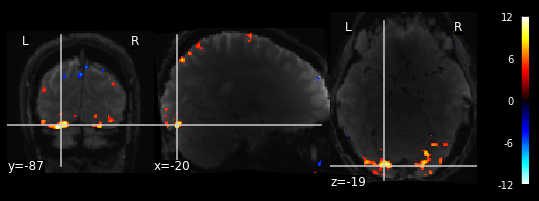

In [58]:
thres_img = threshold_img(z_map_pl, threshold=threshold)
plot_stat_map(thres_img,bg_img=m_img)

In [59]:
mask_img = compute_background_mask(thres_img)

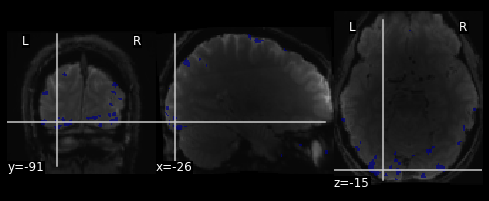

In [60]:
plot_roi(mask_img, m_img)

### There's still quite a large activated space for this level of confidence ( indicating the seemingly great contribution of these areas in correlation with face pleasance evaluation)

This seems to be consistent with the litterature as it shows activation on visual ventral and dorsal pathways ( mainly lateral occipital cortex, motion sensitive region, posterior parietal cortex) for visual aesthetic appreciation which tend to be, to say the least, postively correlated with the notion of pleasance defined in this paradigm ( especially regarding the face task at hand here)

 - https://pubmed.ncbi.nlm.nih.gov/25682351/
 - https://pubmed.ncbi.nlm.nih.gov/31768577/
 - https://www.frontiersin.org/articles/10.3389/fpsyg.2012.00141/full

#### FBR SEPARATE METHOD APPLICATION 

Event 0
      onset  duration        trial_type
0     9.524     4.237  High Pleasance_1
1    15.507     4.376    Nuisance Event
2    23.039     4.480    Nuisance Event
3    32.021     4.951    Nuisance Event
4    38.654     4.874    Nuisance Event
5    47.952     3.741    Nuisance Event
6    52.635     6.975    Nuisance Event
7    62.034     5.752    Nuisance Event
8    70.466     5.500    Nuisance Event
9    78.581     5.062    Nuisance Event
10   86.997     4.497    Nuisance Event
11   94.579     5.393    Nuisance Event
12  101.995     7.024    Nuisance Event
13  111.843     4.060    Nuisance Event
14  119.376     6.127    Nuisance Event
15  127.458     4.312    Nuisance Event
16  135.607     5.811    Nuisance Event
17  144.306     6.899    Nuisance Event
18  153.754     7.378    Nuisance Event
19  165.503     5.838    Nuisance Event
20  172.152     3.824    Nuisance Event
21  178.118     4.778    Nuisance Event
22  184.434     3.244    Nuisance Event
23  188.833     5.861    Nuisanc

59  468.544     5.428     Nuisance Event
Event 57
      onset  duration         trial_type
0     9.524     4.237     Nuisance Event
1    15.507     4.376     Nuisance Event
2    23.039     4.480     Nuisance Event
3    32.021     4.951     Nuisance Event
4    38.654     4.874     Nuisance Event
5    47.952     3.741     Nuisance Event
6    52.635     6.975     Nuisance Event
7    62.034     5.752     Nuisance Event
8    70.466     5.500     Nuisance Event
9    78.581     5.062     Nuisance Event
10   86.997     4.497     Nuisance Event
11   94.579     5.393     Nuisance Event
12  101.995     7.024     Nuisance Event
13  111.843     4.060     Nuisance Event
14  119.376     6.127     Nuisance Event
15  127.458     4.312     Nuisance Event
16  135.607     5.811     Nuisance Event
17  144.306     6.899     Nuisance Event
18  153.754     7.378     Nuisance Event
19  165.503     5.838     Nuisance Event
20  172.152     3.824     Nuisance Event
21  178.118     4.778     Nuisance Event
22  184

Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.2s, 0.0min



Computation of 1 runs done in 17 seconds



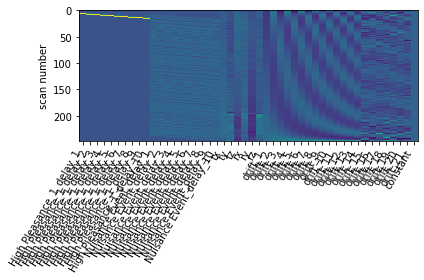

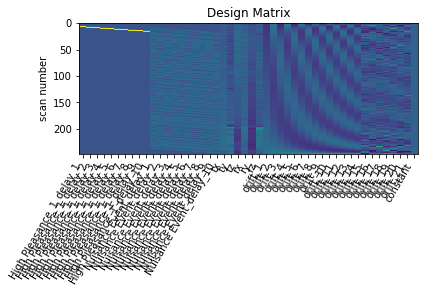

ACTIVITY MATRIX HighPleasance_1
GLM RUN LowPleasance_2


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



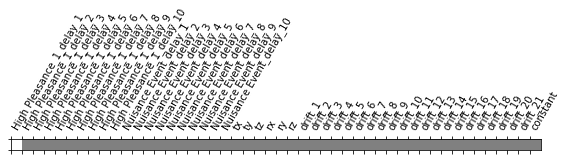

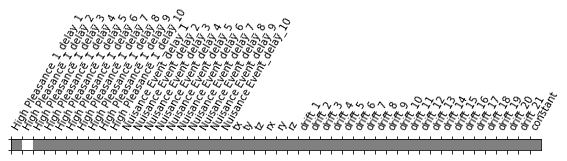

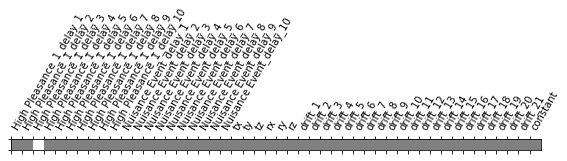

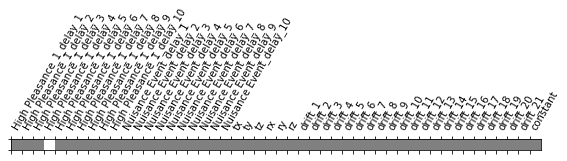

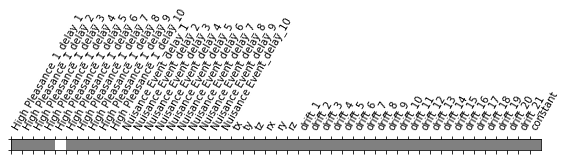

...

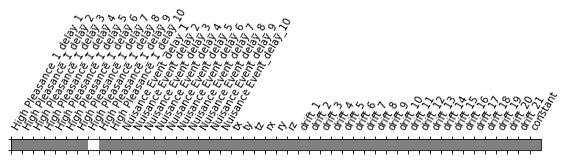

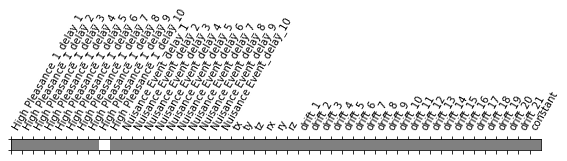

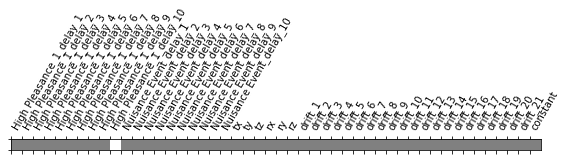

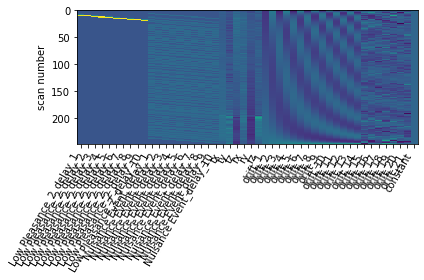

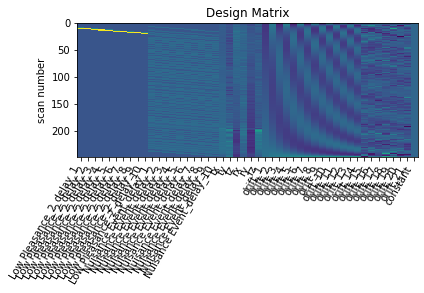

ACTIVITY MATRIX LowPleasance_2
GLM RUN LowPleasance_3


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



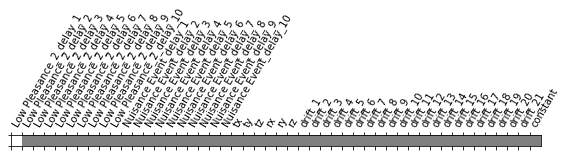

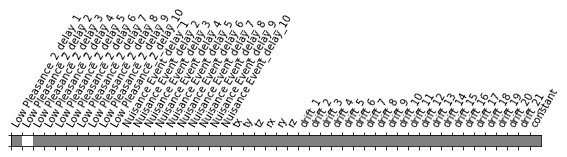

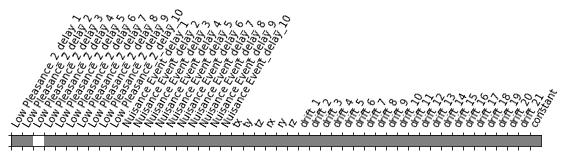

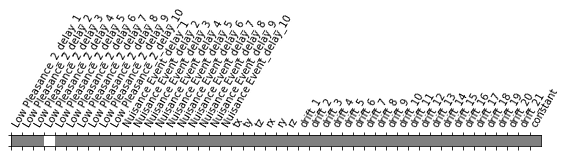

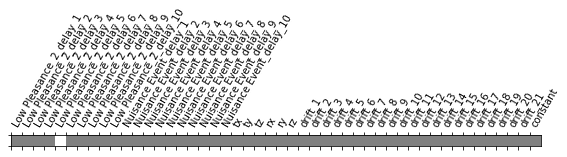

...

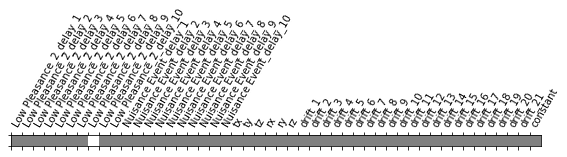

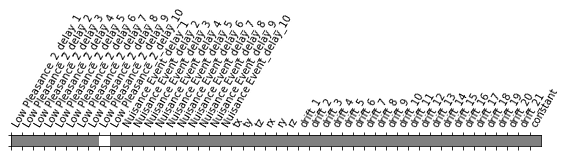

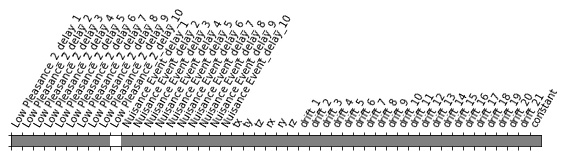

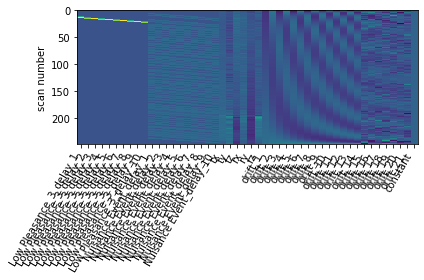

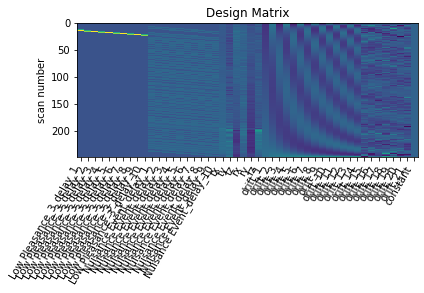

ACTIVITY MATRIX LowPleasance_3
GLM RUN LowPleasance_4


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 18 seconds



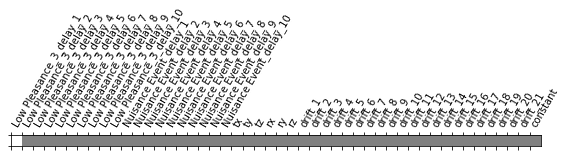

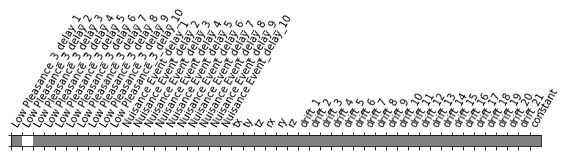

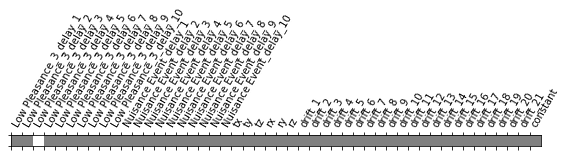

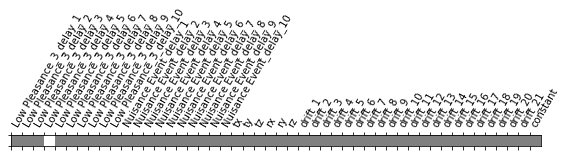

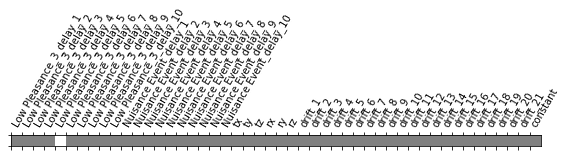

...

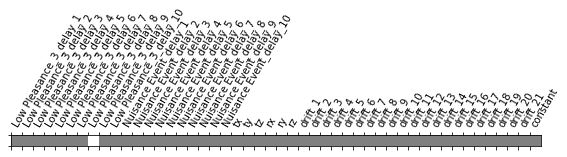

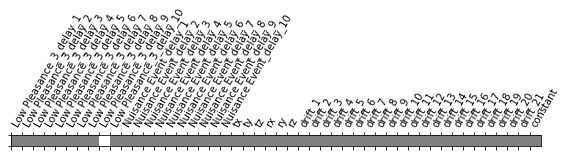

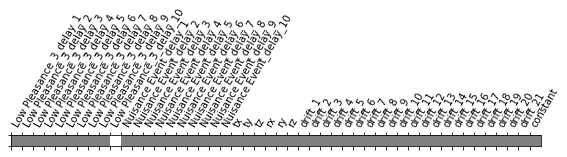

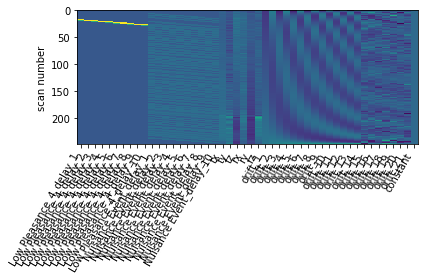

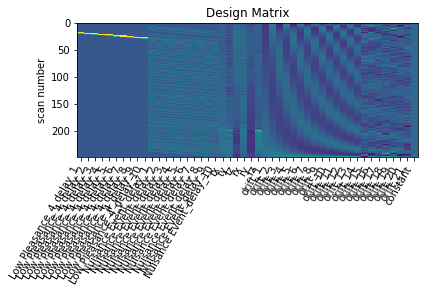

ACTIVITY MATRIX LowPleasance_4
GLM RUN HighPleasance_5


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



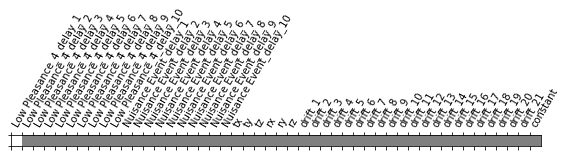

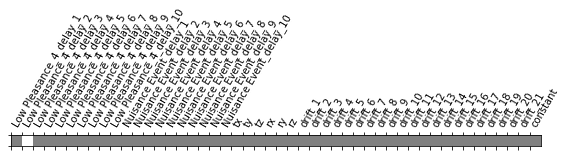

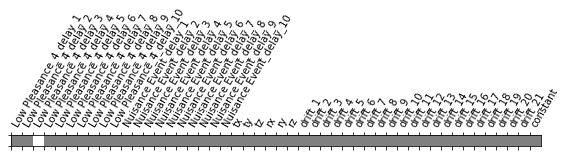

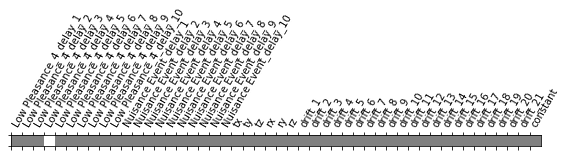

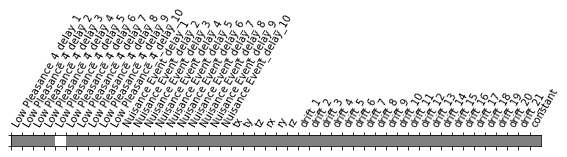

...

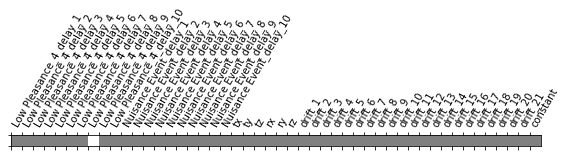

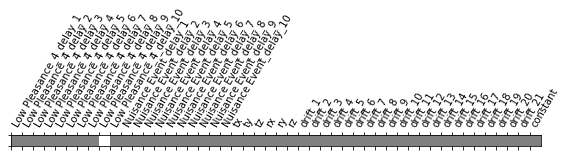

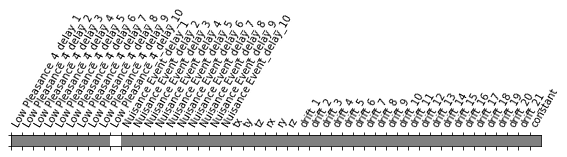

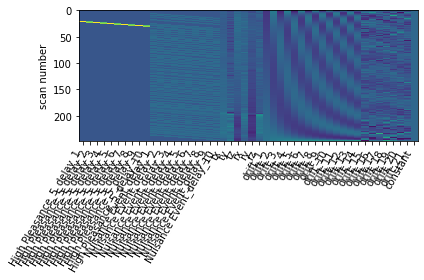

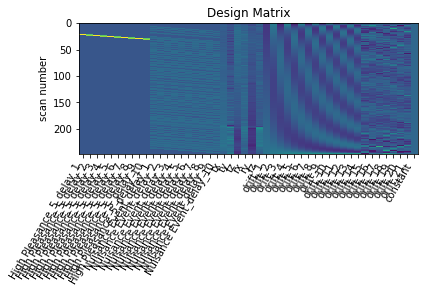

ACTIVITY MATRIX HighPleasance_5
GLM RUN HighPleasance_6


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 14 seconds



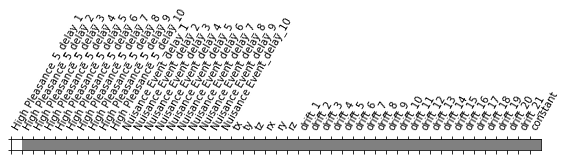

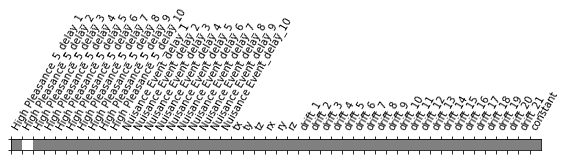

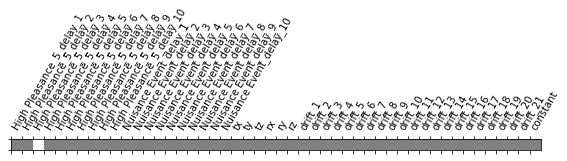

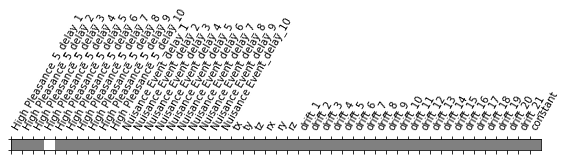

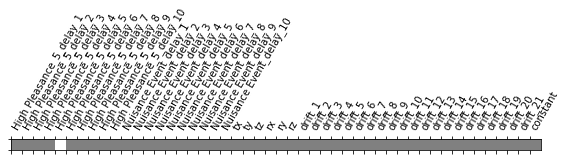

...

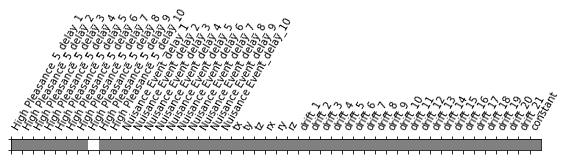

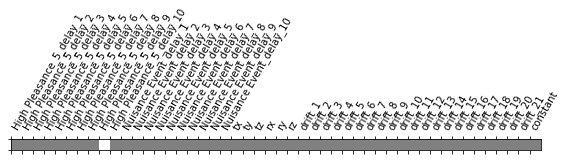

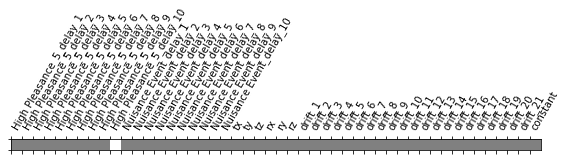

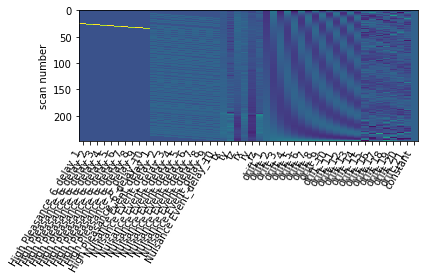

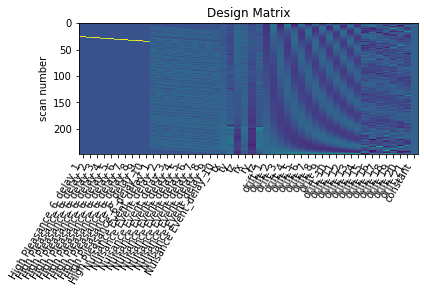

ACTIVITY MATRIX HighPleasance_6
GLM RUN HighPleasance_7


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 15 seconds



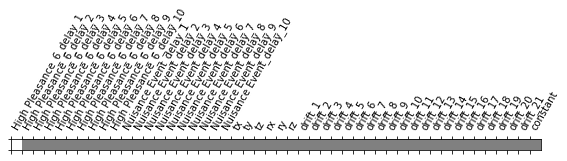

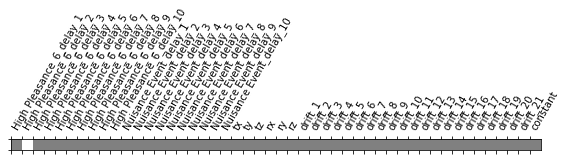

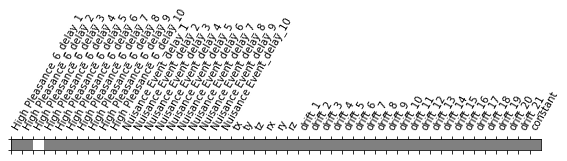

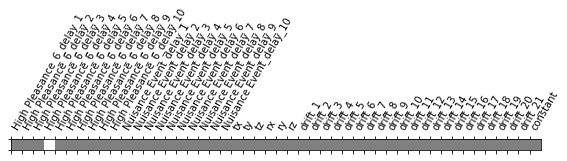

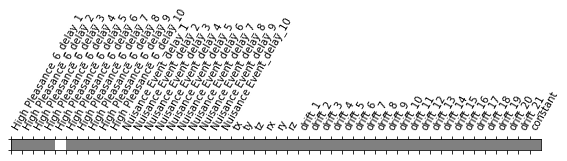

...

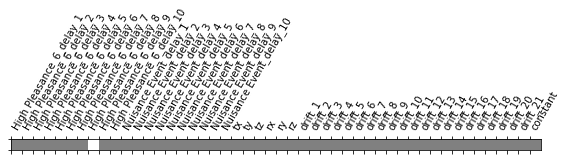

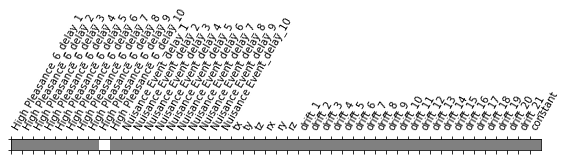

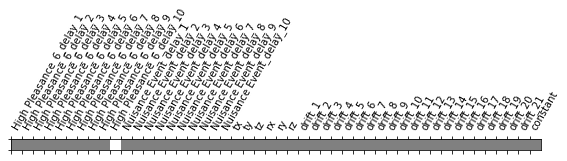

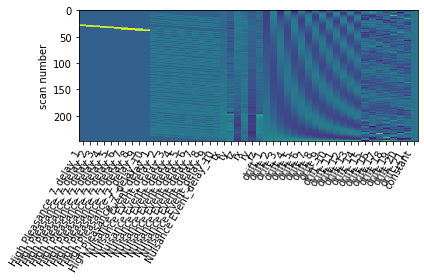

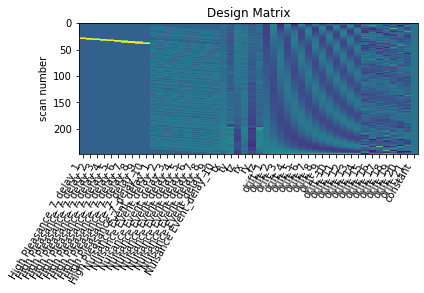

ACTIVITY MATRIX HighPleasance_7
GLM RUN LowPleasance_8


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



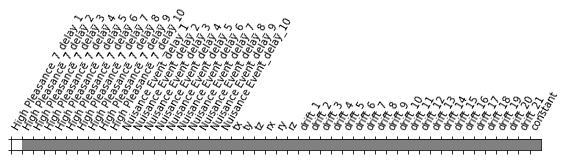

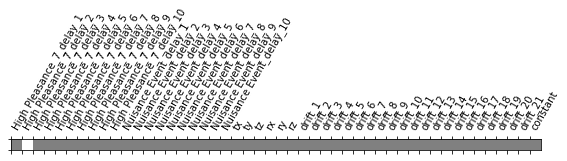

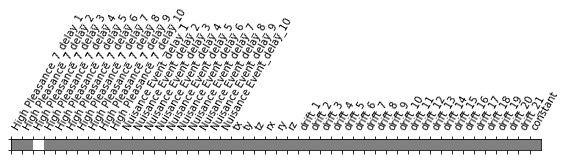

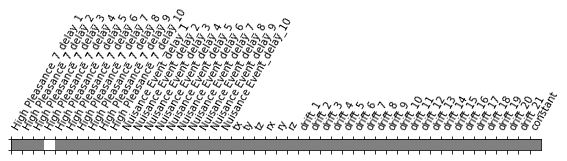

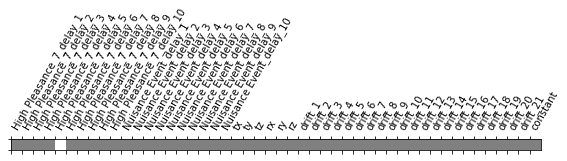

...

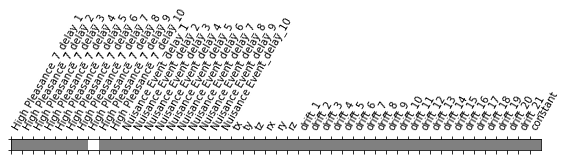

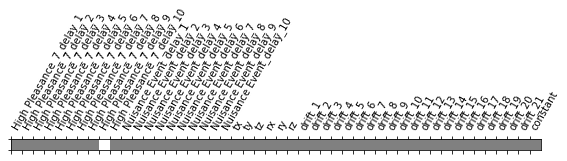

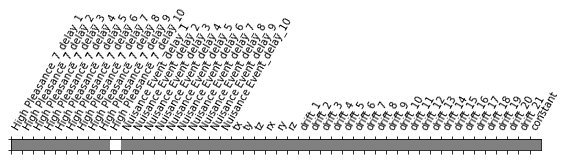

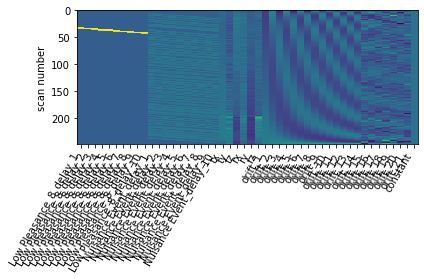

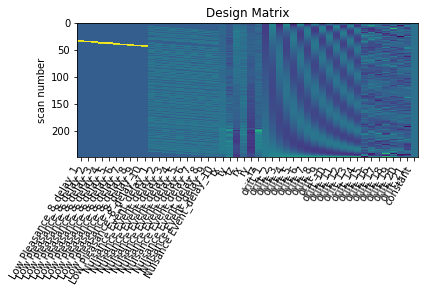

ACTIVITY MATRIX LowPleasance_8
GLM RUN HighPleasance_9


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



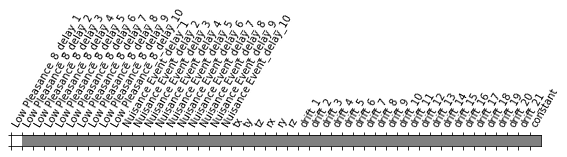

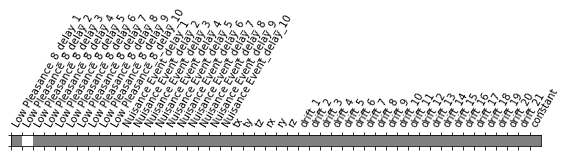

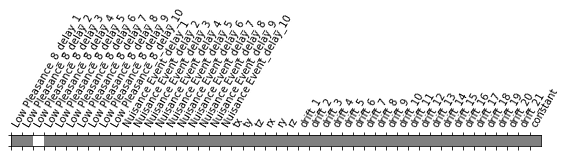

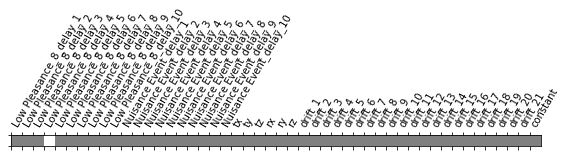

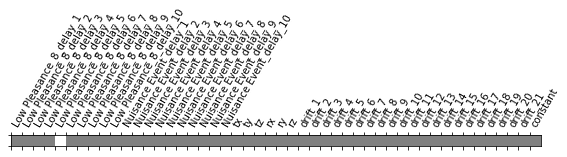

...

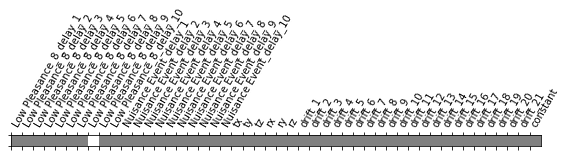

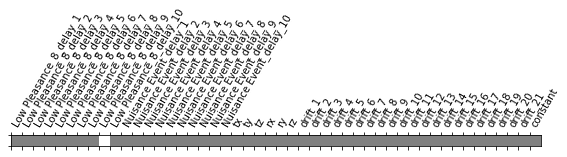

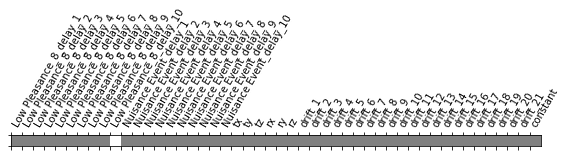

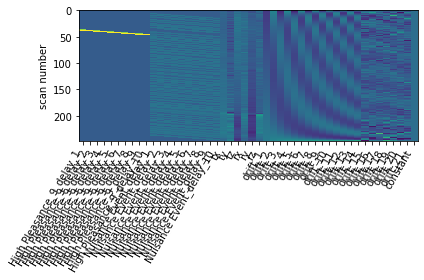

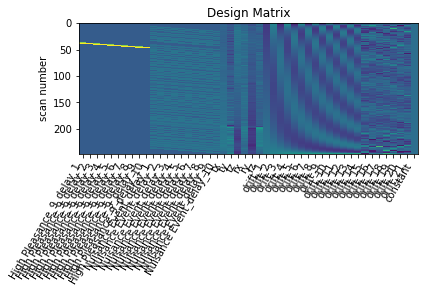

ACTIVITY MATRIX HighPleasance_9
GLM RUN HighPleasance_10


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



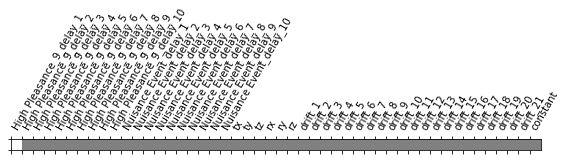

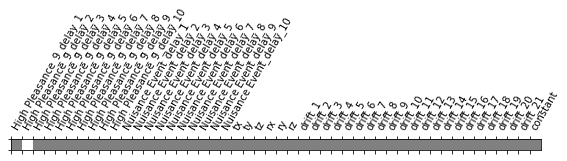

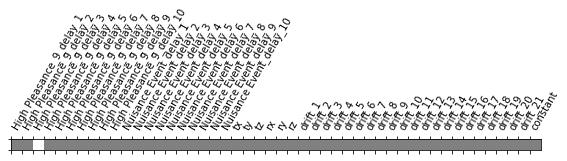

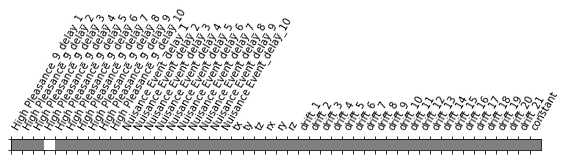

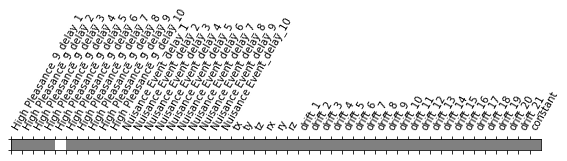

...

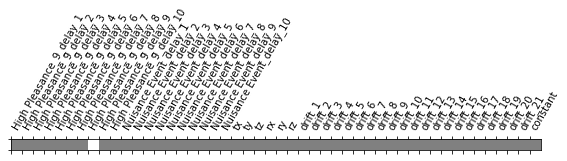

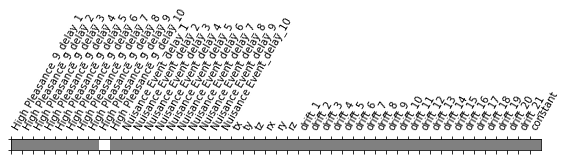

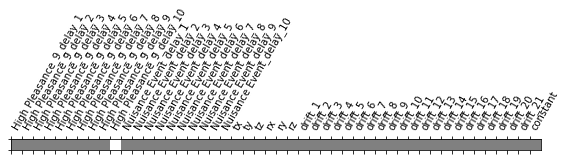

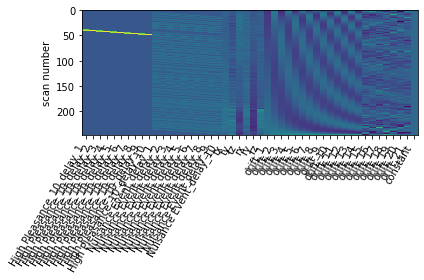

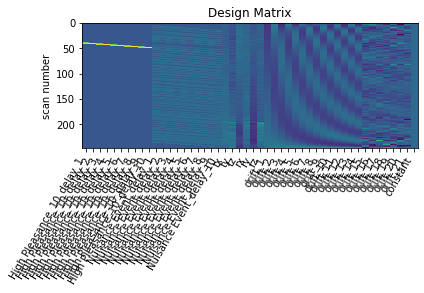

ACTIVITY MATRIX HighPleasance_10
GLM RUN LowPleasance_11


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



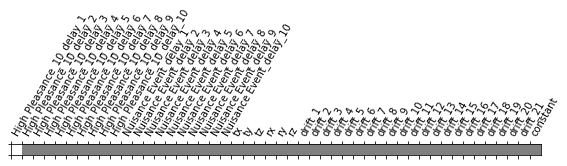

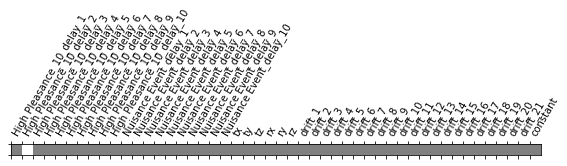

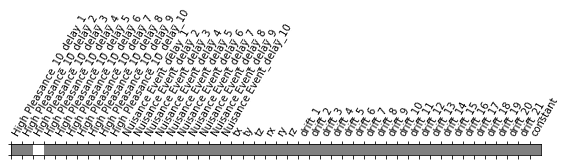

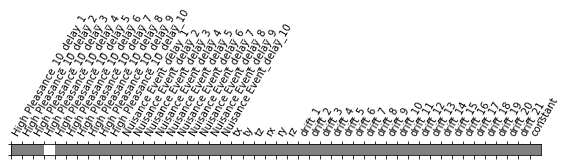

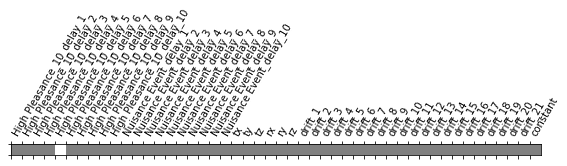

...

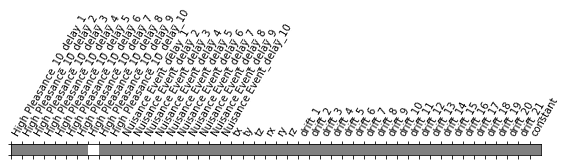

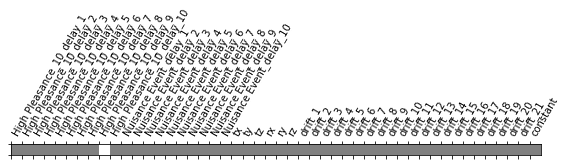

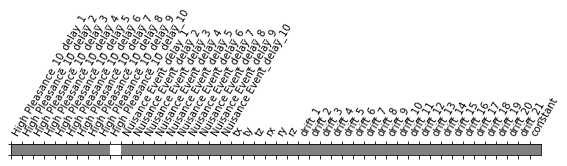

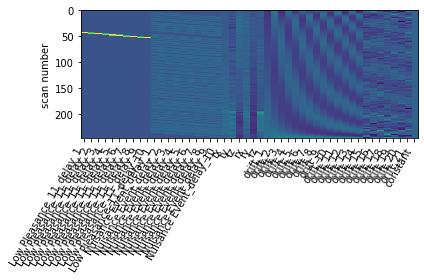

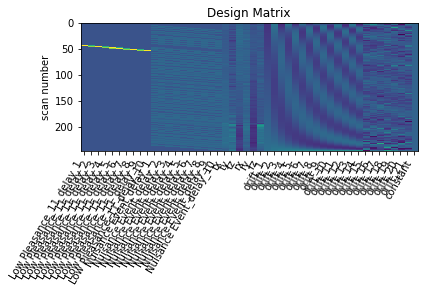

ACTIVITY MATRIX LowPleasance_11
GLM RUN HighPleasance_12


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 16 seconds



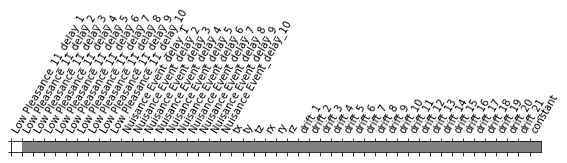

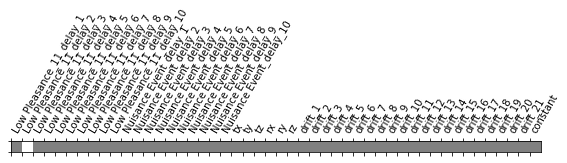

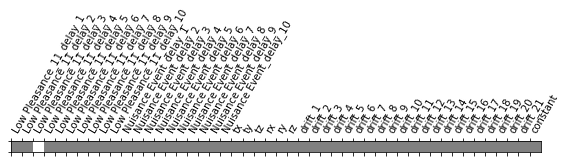

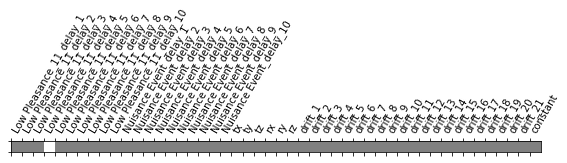

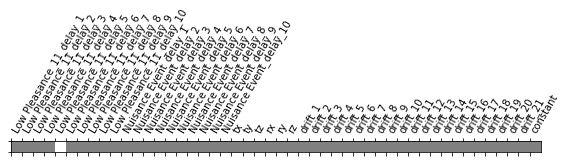

...

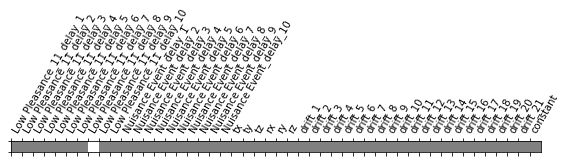

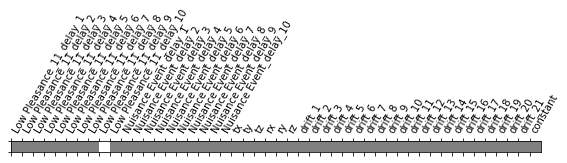

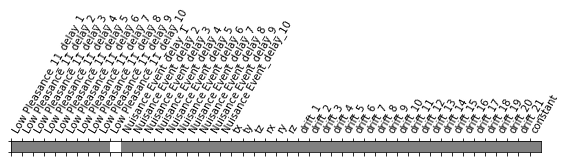

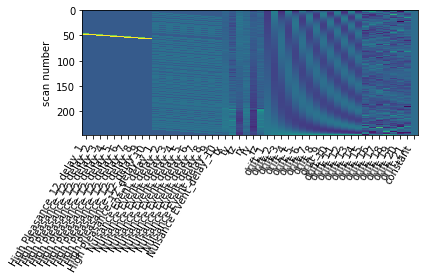

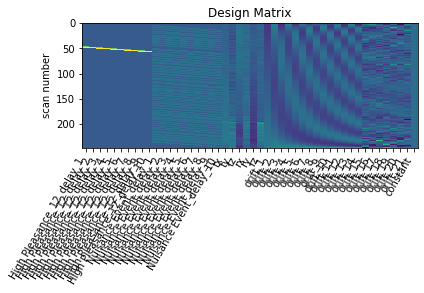

ACTIVITY MATRIX HighPleasance_12
GLM RUN HighPleasance_13


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.3s, 0.0min



Computation of 1 runs done in 16 seconds



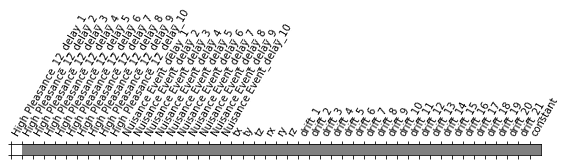

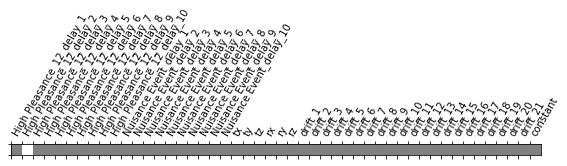

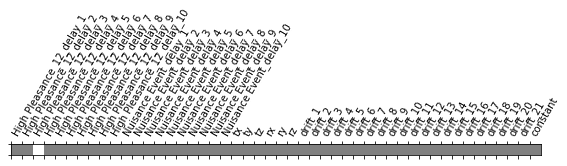

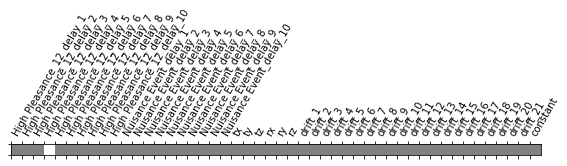

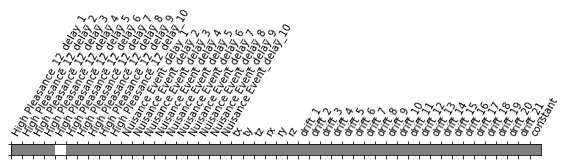

...

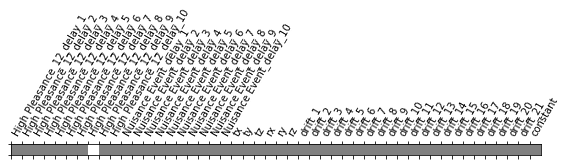

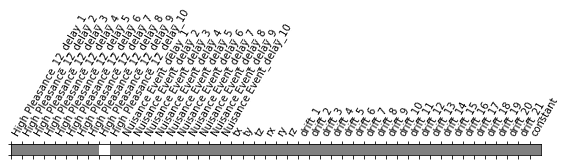

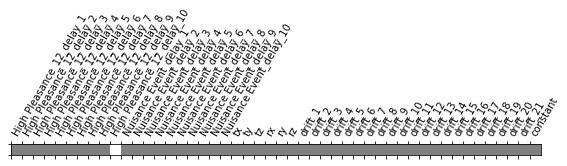

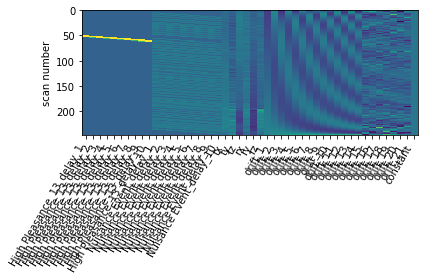

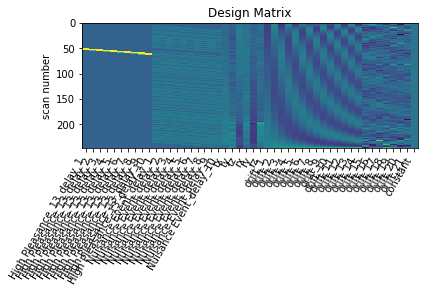

ACTIVITY MATRIX HighPleasance_13
GLM RUN HighPleasance_14


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



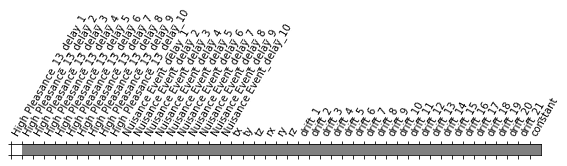

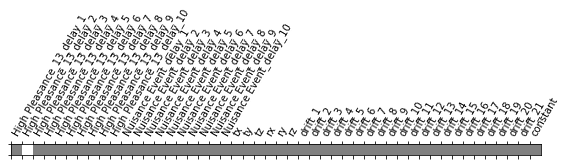

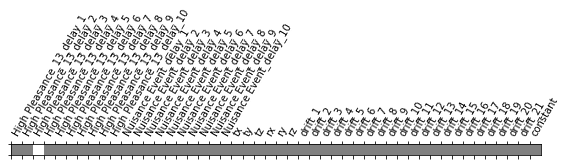

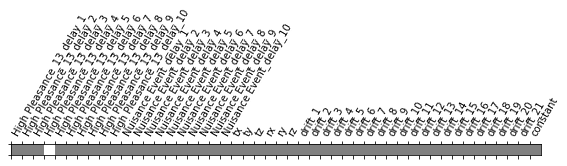

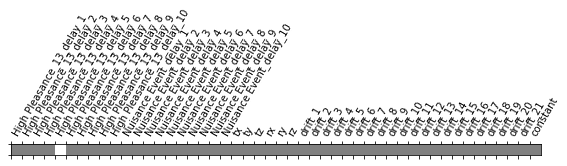

...

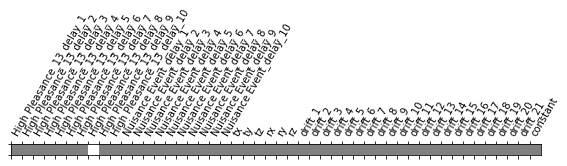

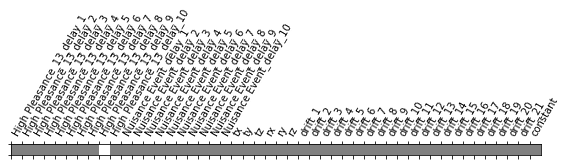

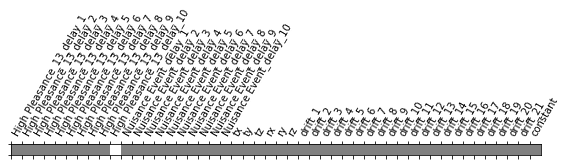

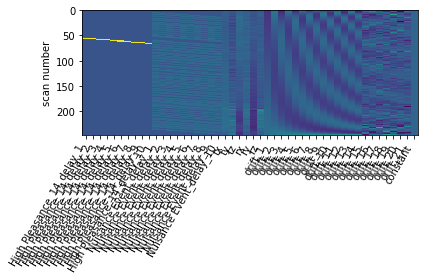

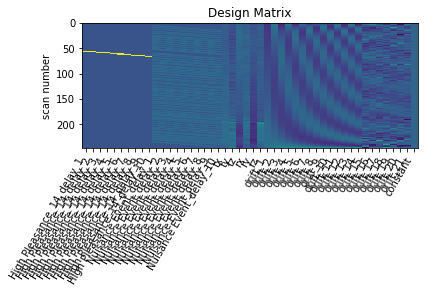

ACTIVITY MATRIX HighPleasance_14
GLM RUN HighPleasance_15


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



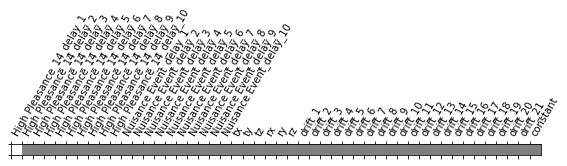

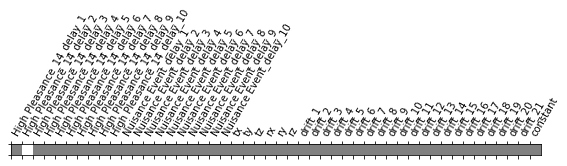

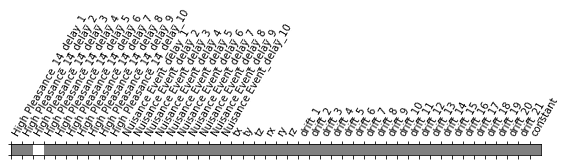

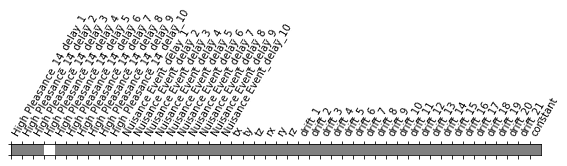

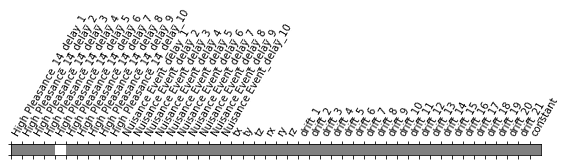

...

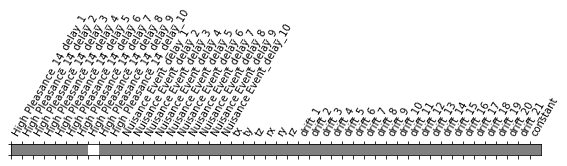

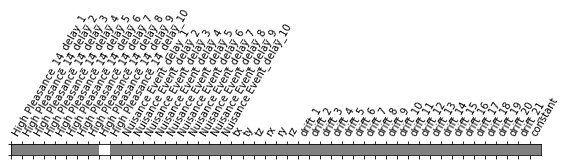

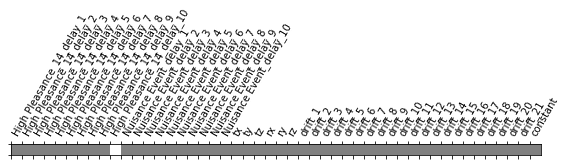

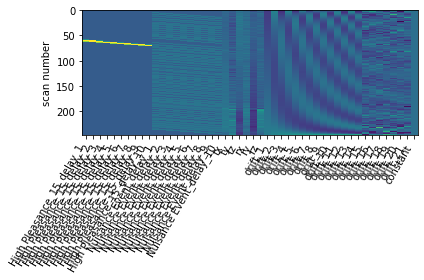

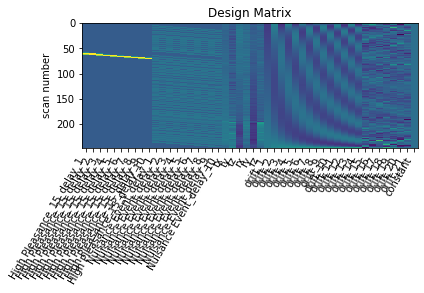

ACTIVITY MATRIX HighPleasance_15
GLM RUN LowPleasance_16


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



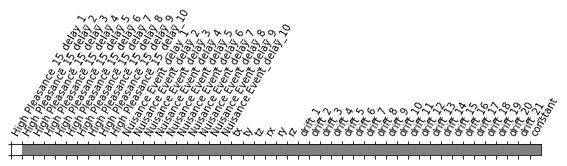

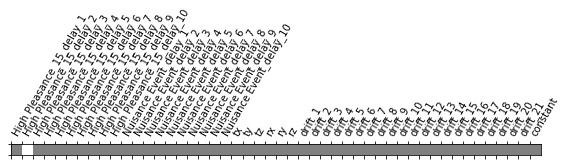

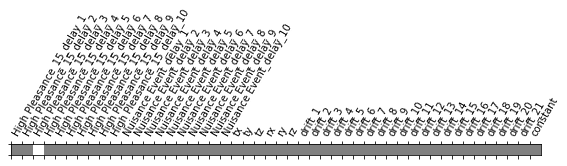

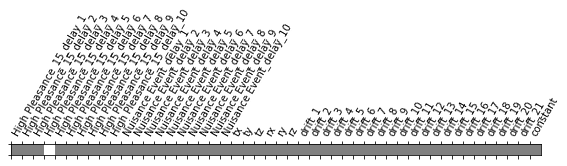

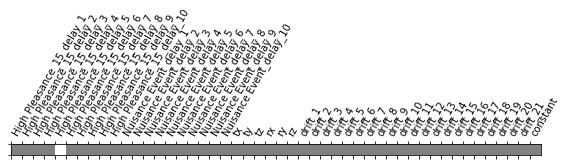

...

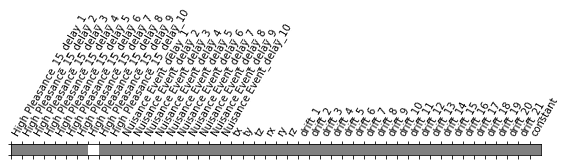

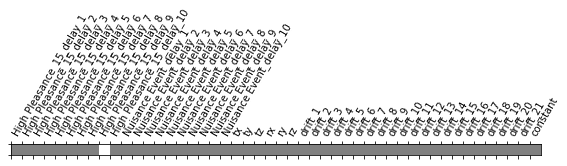

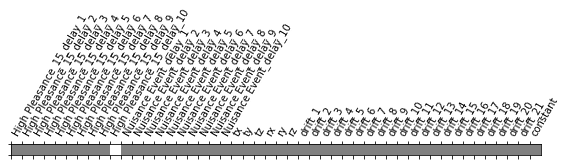

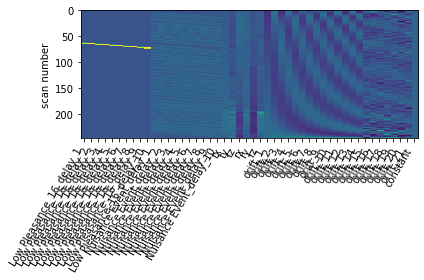

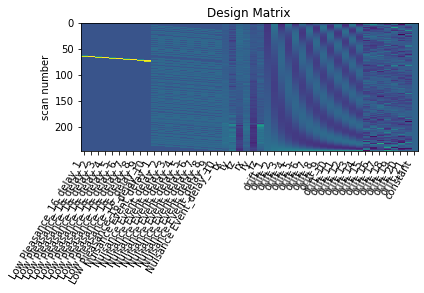

ACTIVITY MATRIX LowPleasance_16
GLM RUN HighPleasance_17


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 16 seconds



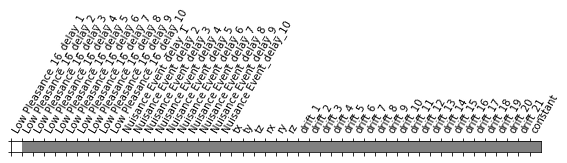

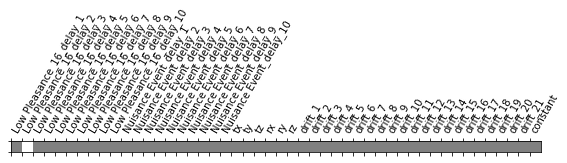

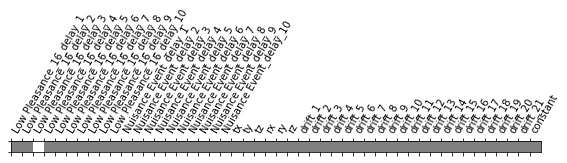

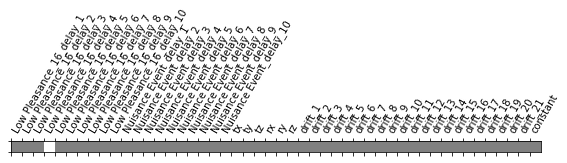

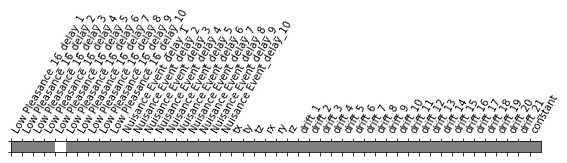

...

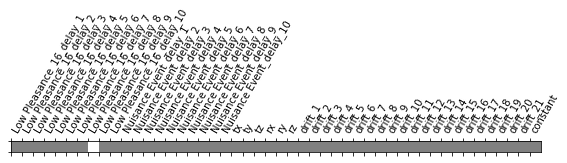

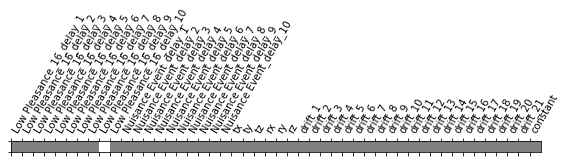

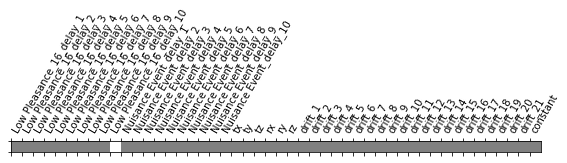

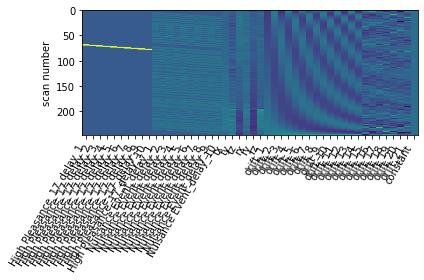

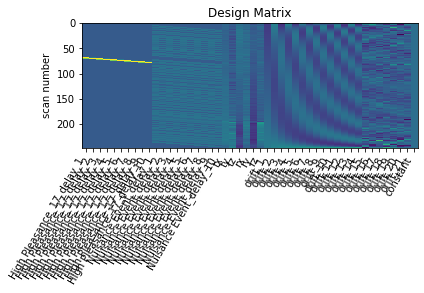

ACTIVITY MATRIX HighPleasance_17
GLM RUN HighPleasance_18


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.4s, 0.0min



Computation of 1 runs done in 17 seconds



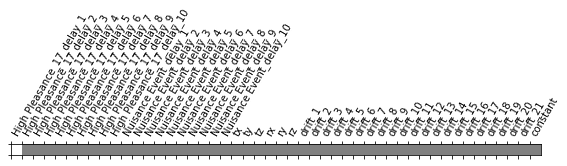

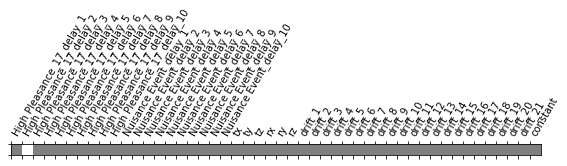

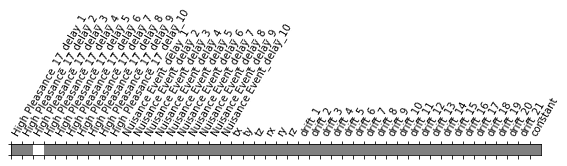

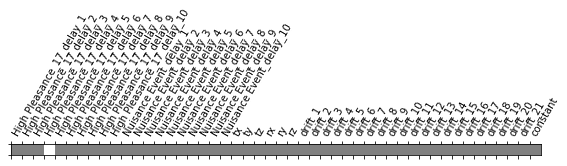

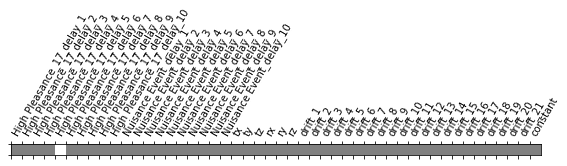

...

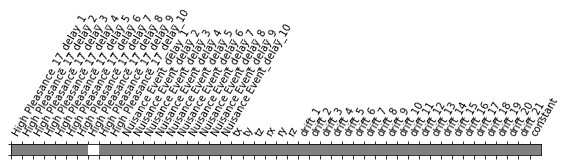

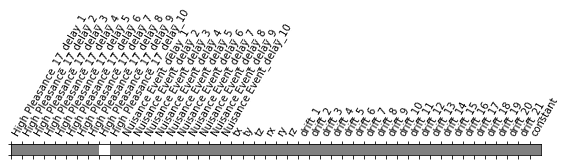

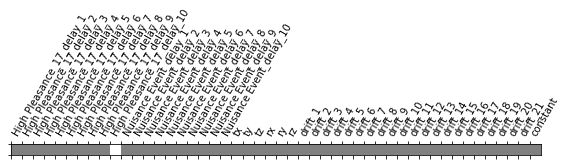

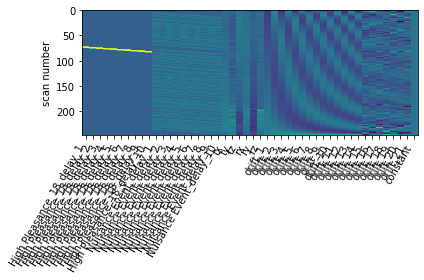

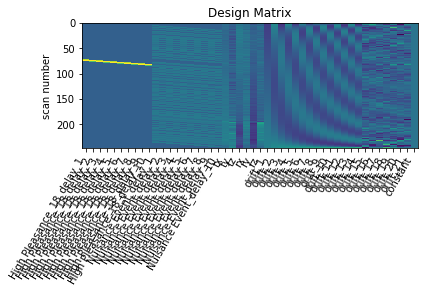

ACTIVITY MATRIX HighPleasance_18
GLM RUN HighPleasance_19


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



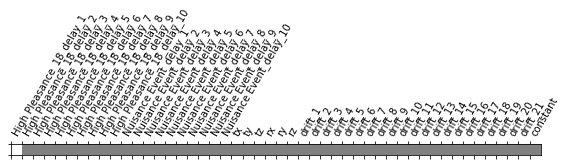

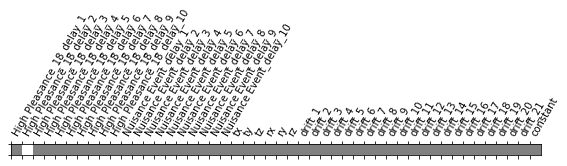

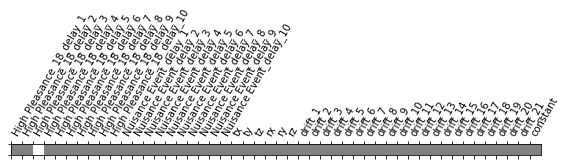

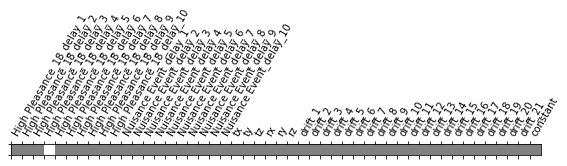

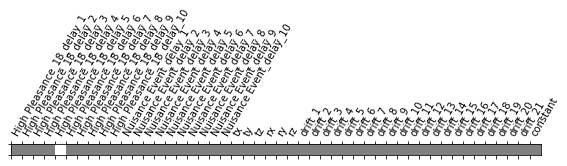

...

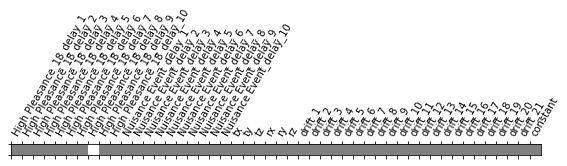

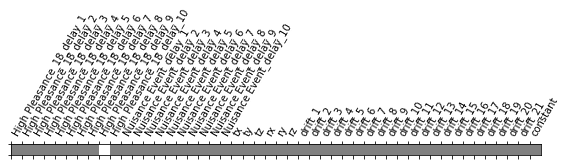

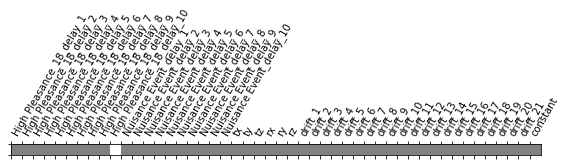

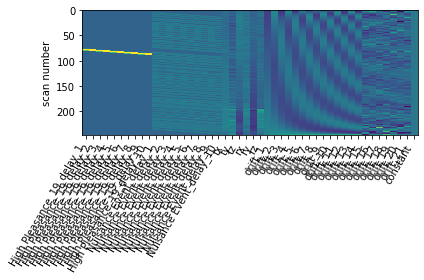

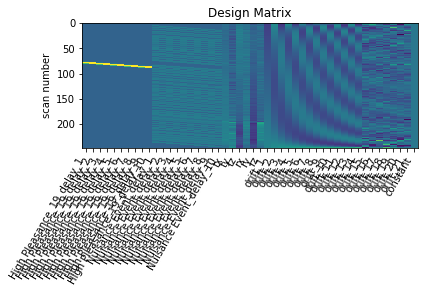

ACTIVITY MATRIX HighPleasance_19
GLM RUN LowPleasance_20


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



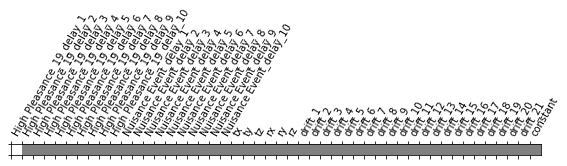

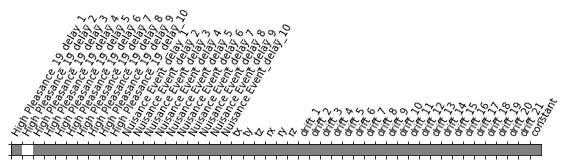

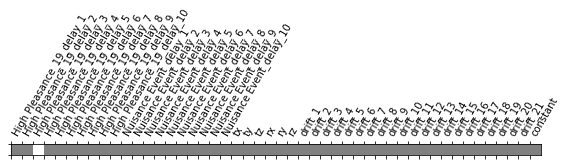

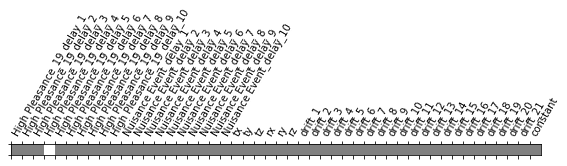

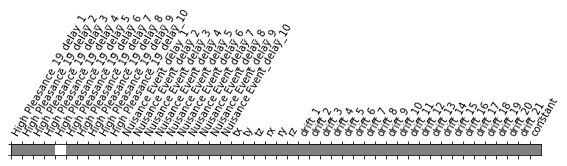

...

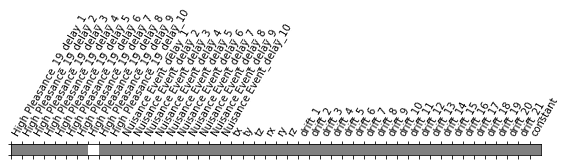

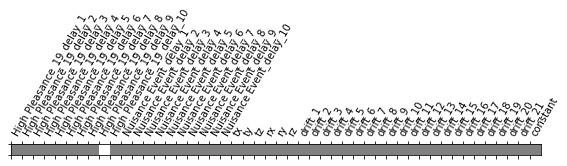

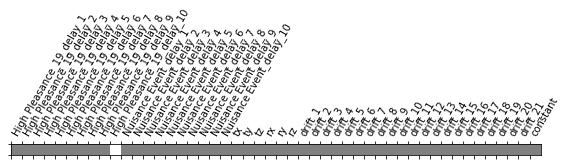

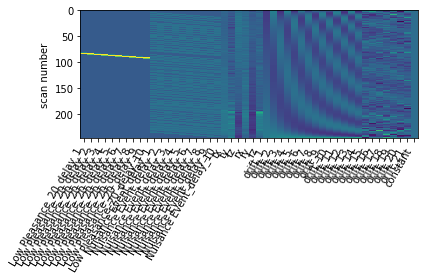

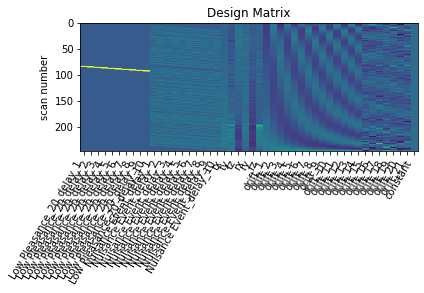

ACTIVITY MATRIX LowPleasance_20
GLM RUN HighPleasance_21


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 17 seconds



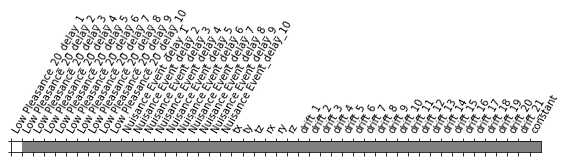

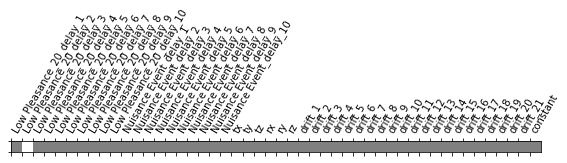

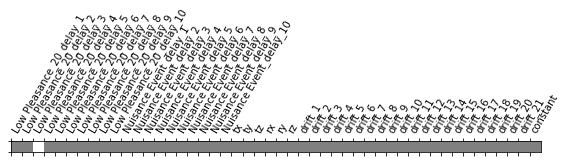

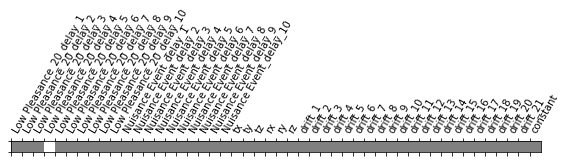

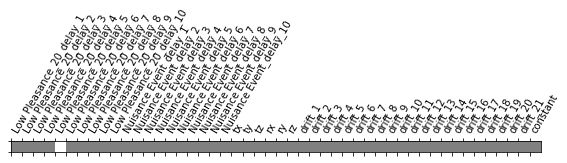

...

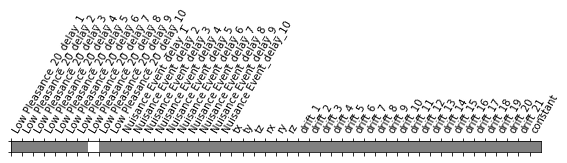

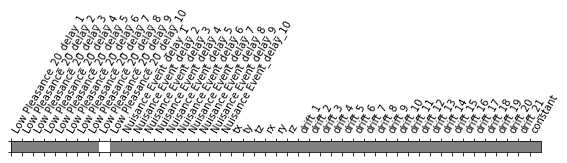

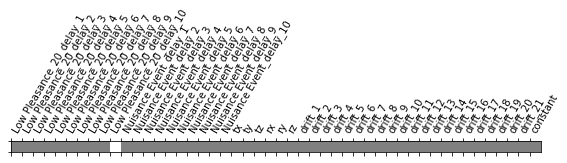

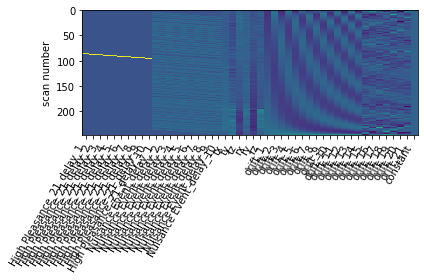

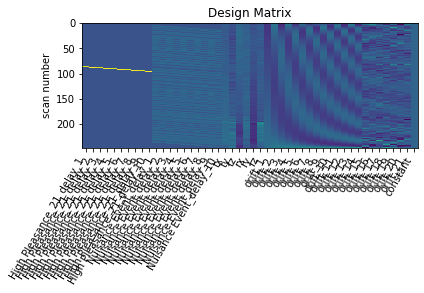

ACTIVITY MATRIX HighPleasance_21
GLM RUN LowPleasance_22


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



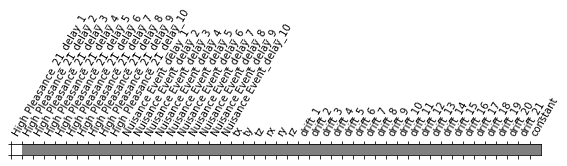

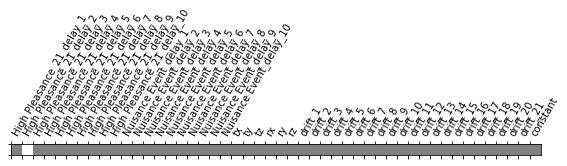

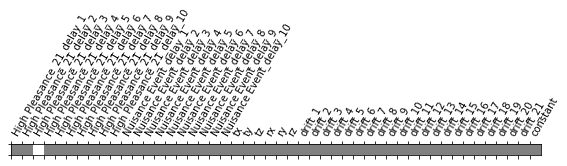

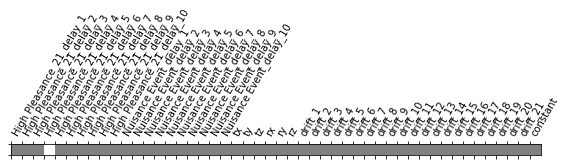

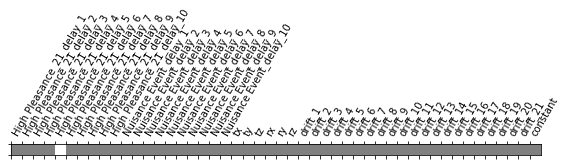

...

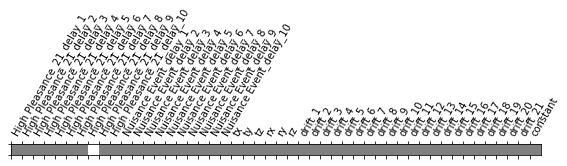

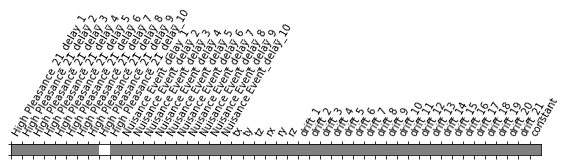

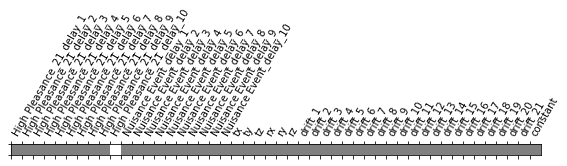

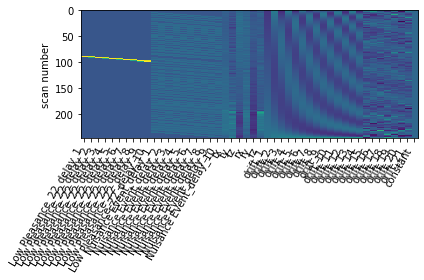

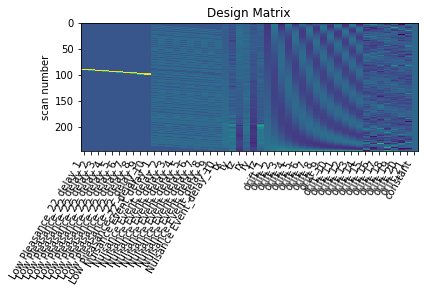

ACTIVITY MATRIX LowPleasance_22
GLM RUN LowPleasance_23


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.5s, 0.0min



Computation of 1 runs done in 17 seconds



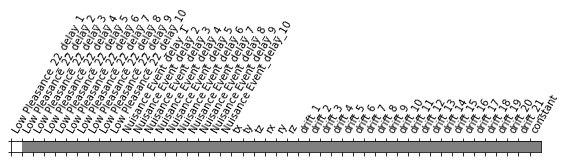

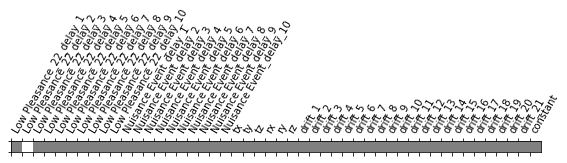

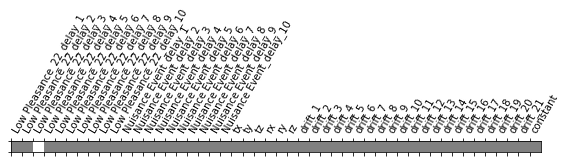

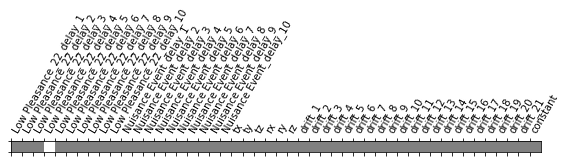

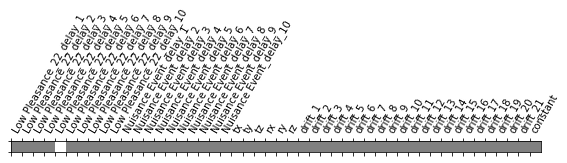

...

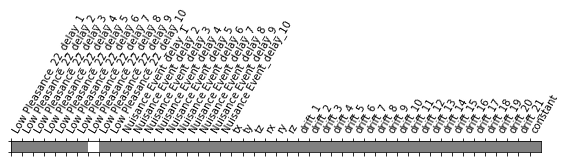

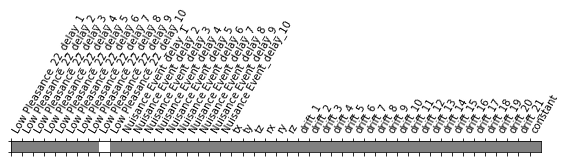

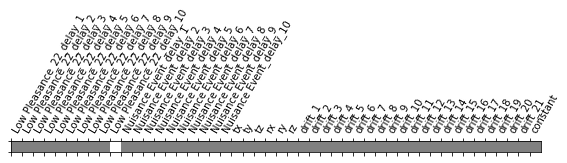

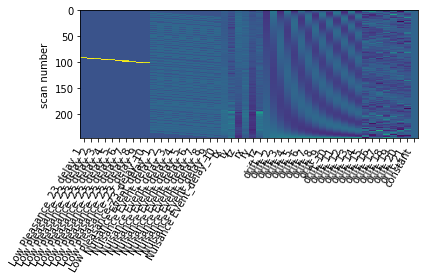

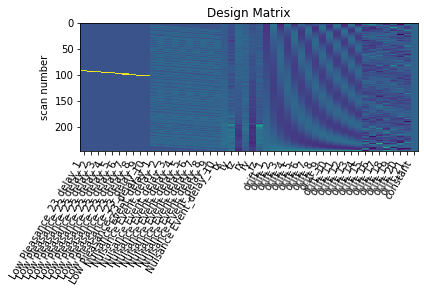

ACTIVITY MATRIX LowPleasance_23
GLM RUN HighPleasance_24


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 15 seconds



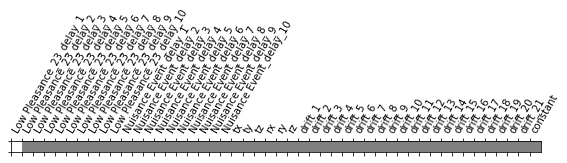

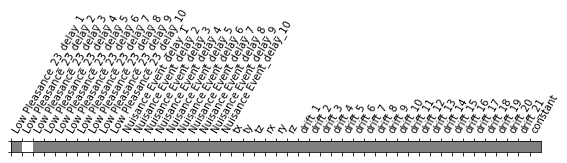

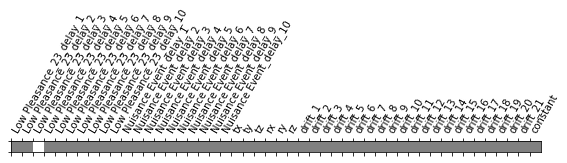

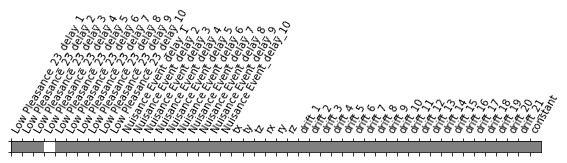

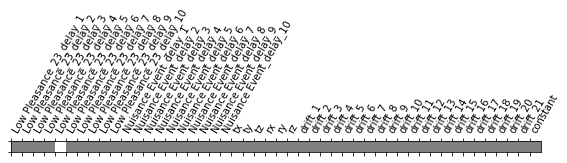

...

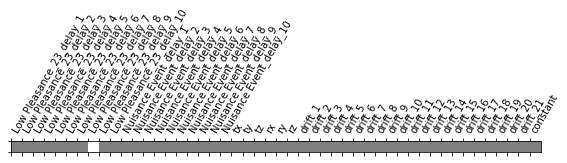

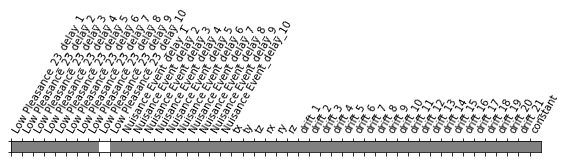

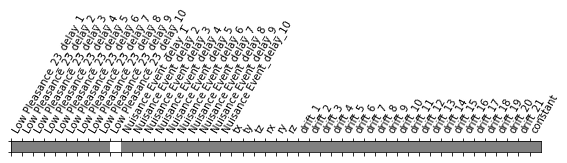

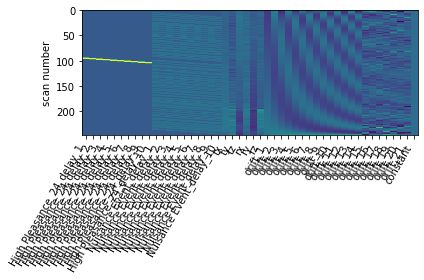

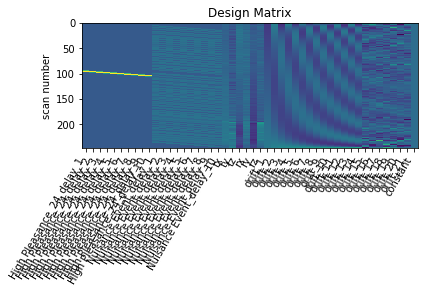

ACTIVITY MATRIX HighPleasance_24
GLM RUN LowPleasance_25


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 0.9s, 0.0min



Computation of 1 runs done in 18 seconds



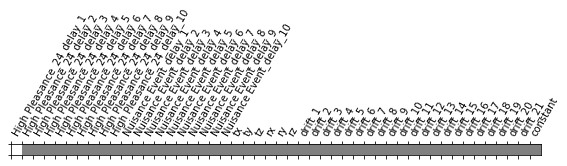

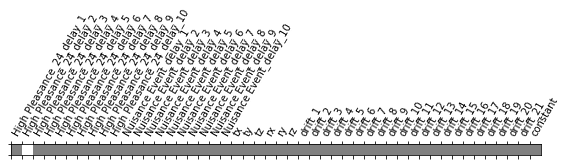

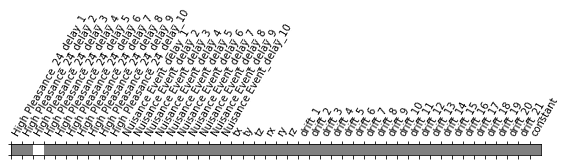

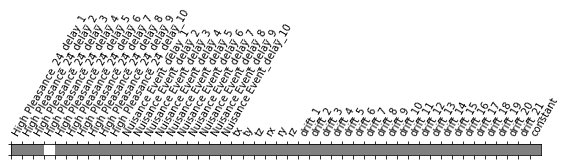

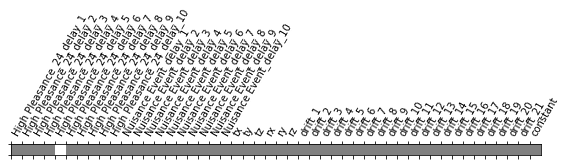

...

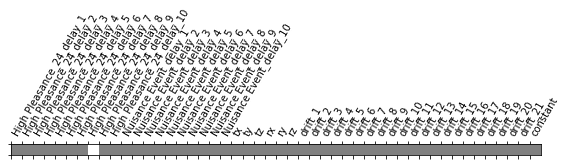

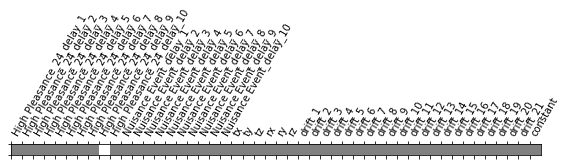

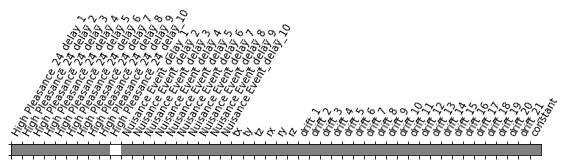

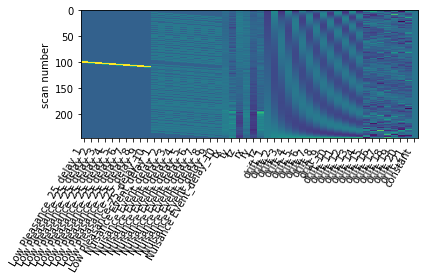

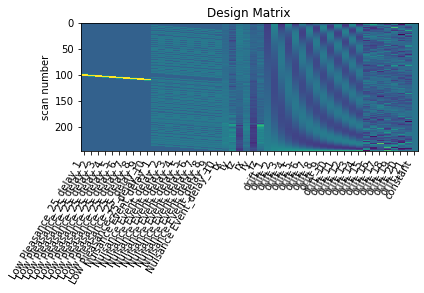

ACTIVITY MATRIX LowPleasance_25
GLM RUN HighPleasance_26


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



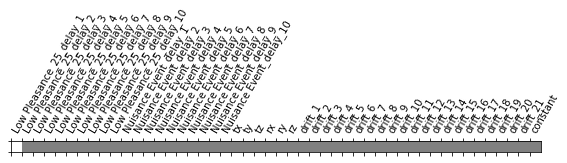

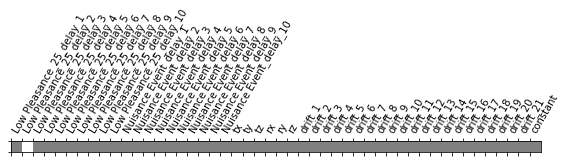

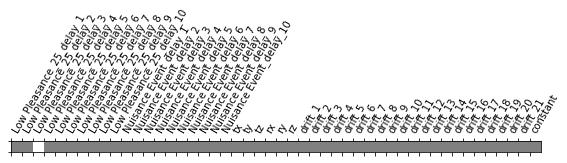

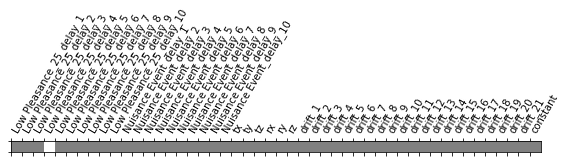

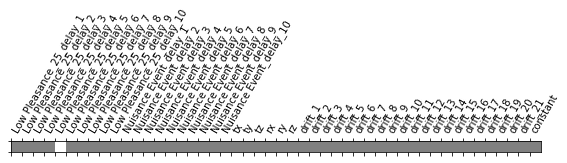

...

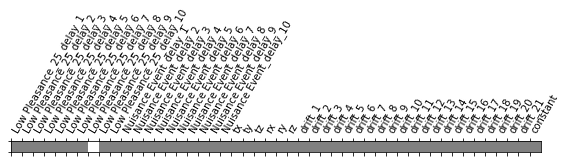

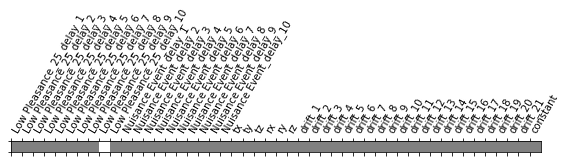

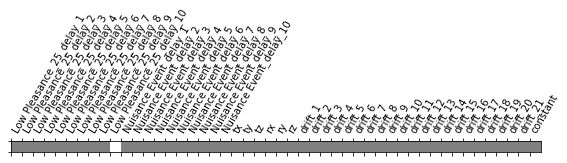

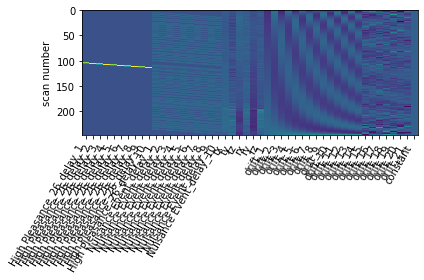

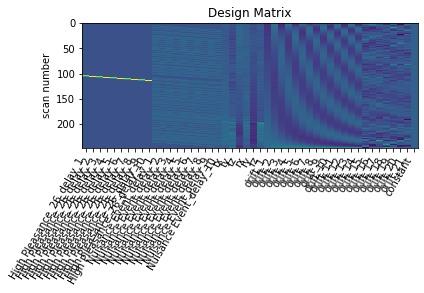

ACTIVITY MATRIX HighPleasance_26
GLM RUN HighPleasance_27


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.4s, 0.0min



Computation of 1 runs done in 18 seconds



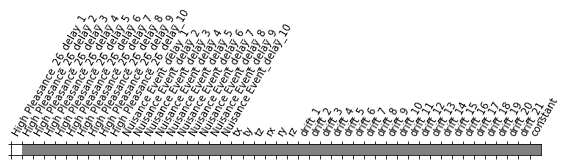

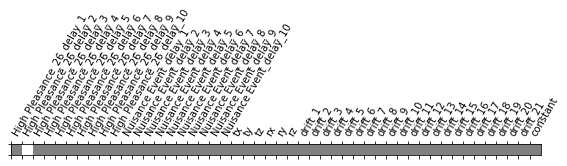

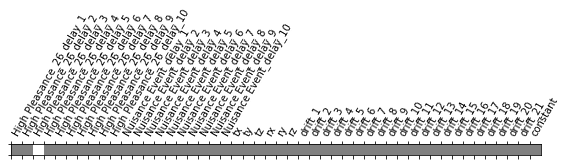

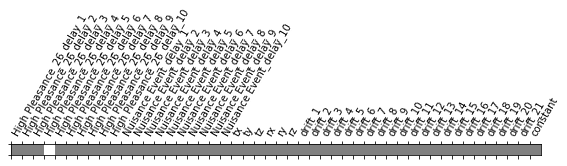

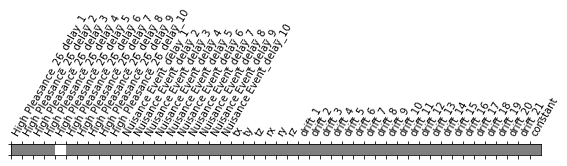

...

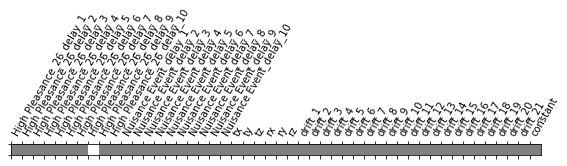

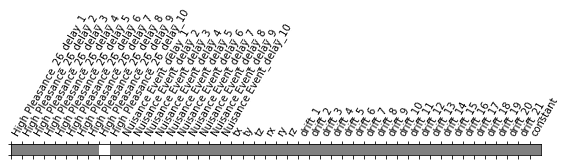

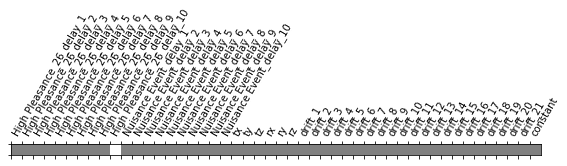

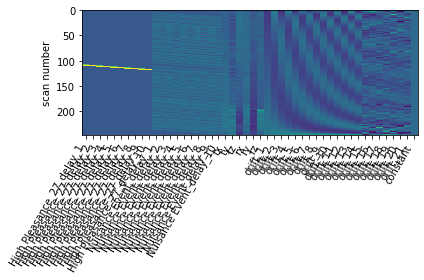

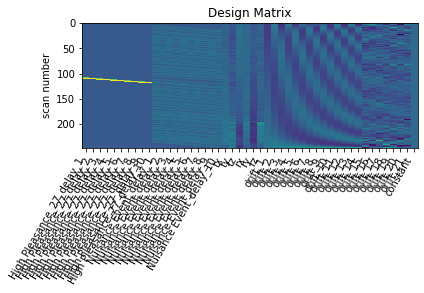

ACTIVITY MATRIX HighPleasance_27
GLM RUN LowPleasance_28


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.4s, 0.0min



Computation of 1 runs done in 17 seconds



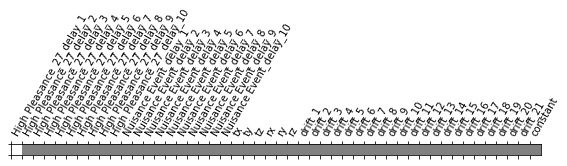

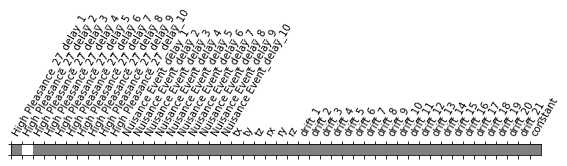

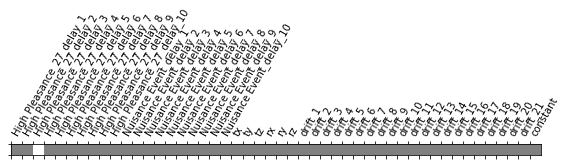

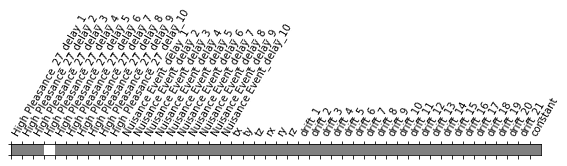

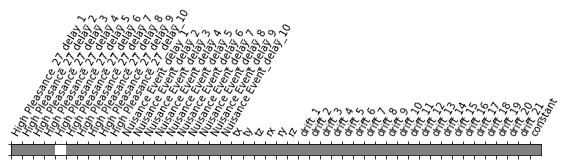

...

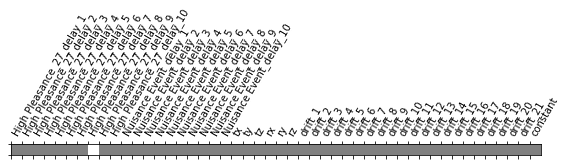

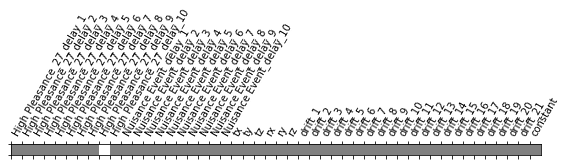

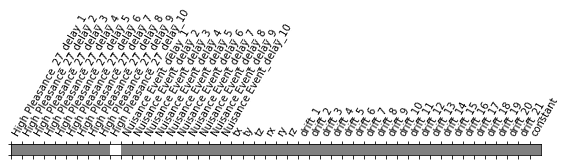

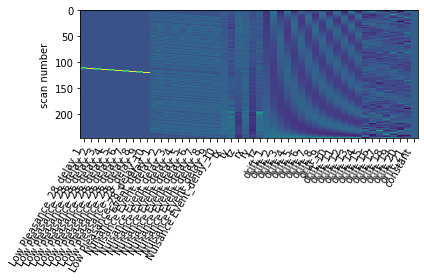

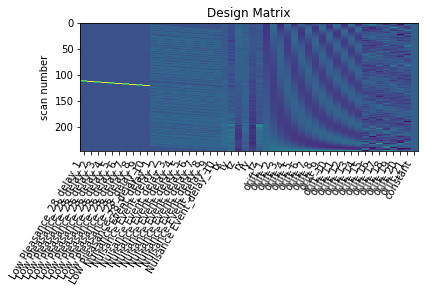

ACTIVITY MATRIX LowPleasance_28
GLM RUN LowPleasance_29


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



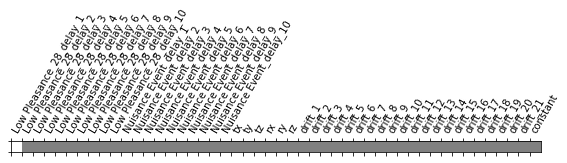

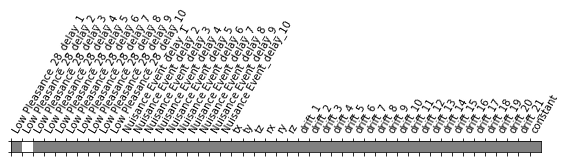

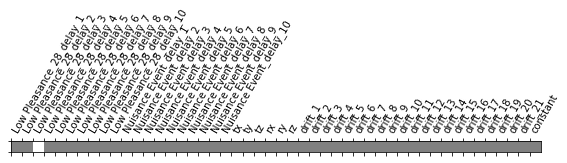

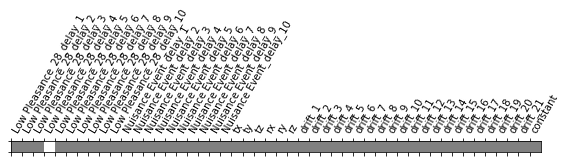

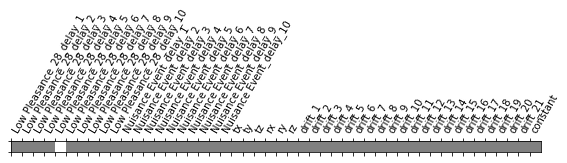

...

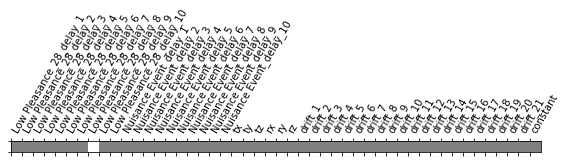

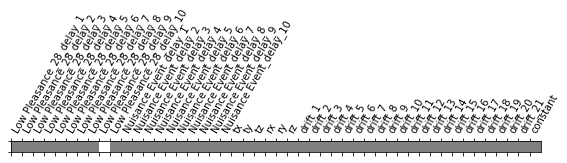

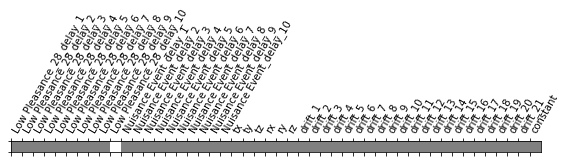

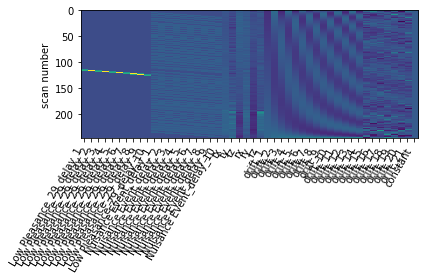

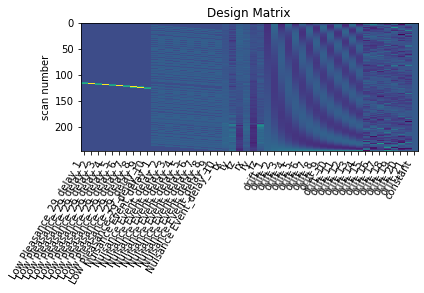

ACTIVITY MATRIX LowPleasance_29
GLM RUN HighPleasance_30


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



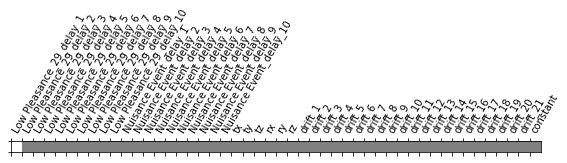

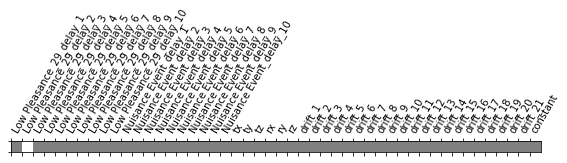

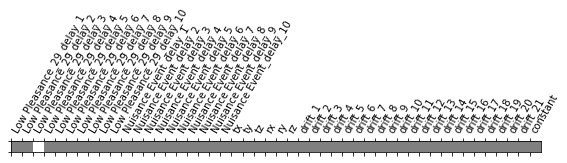

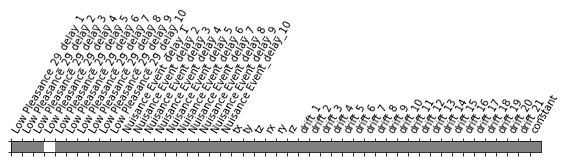

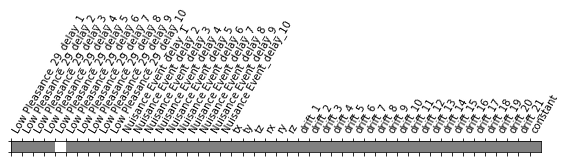

...

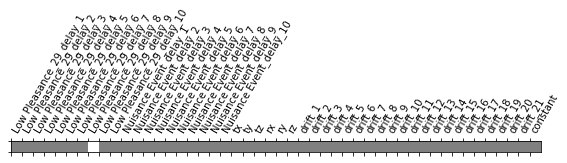

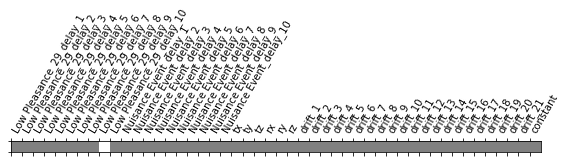

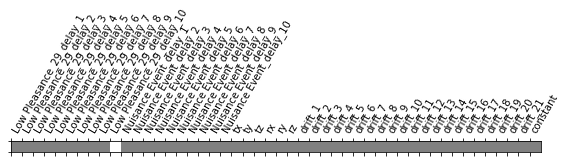

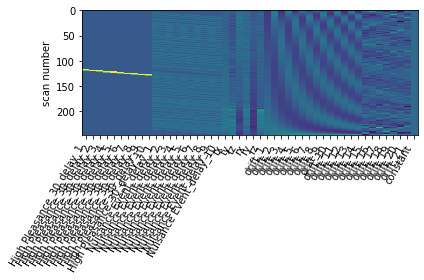

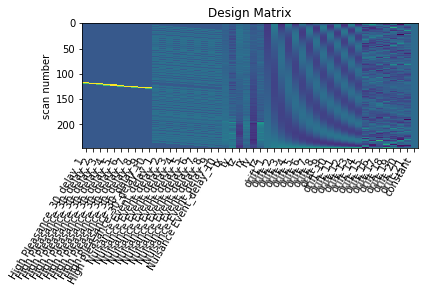

ACTIVITY MATRIX HighPleasance_30
GLM RUN HighPleasance_31


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



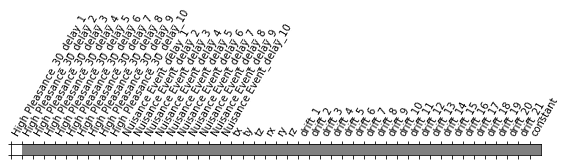

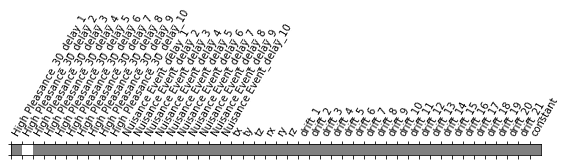

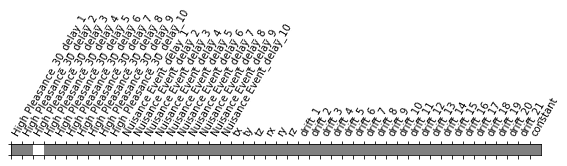

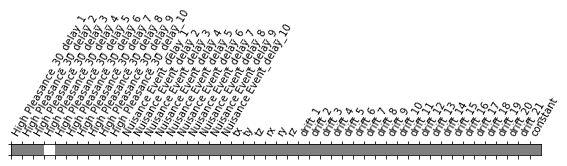

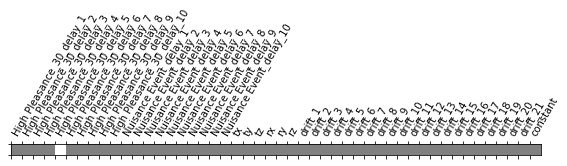

...

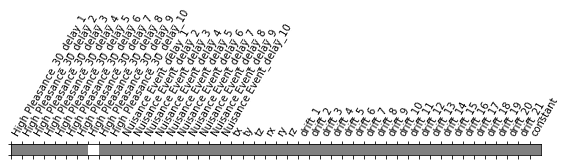

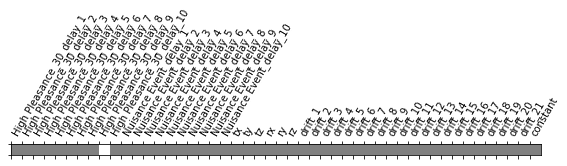

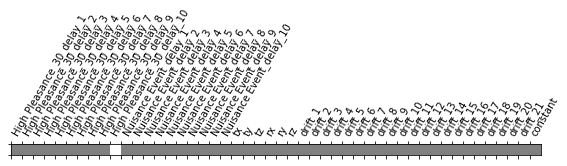

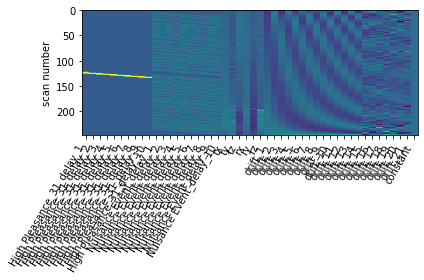

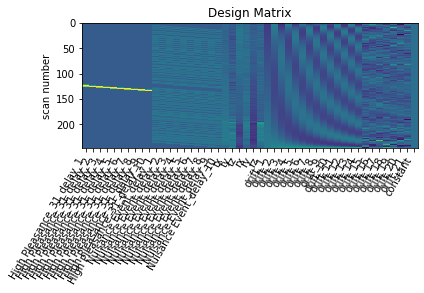

ACTIVITY MATRIX HighPleasance_31
GLM RUN LowPleasance_32


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 0.9s, 0.0min



Computation of 1 runs done in 16 seconds



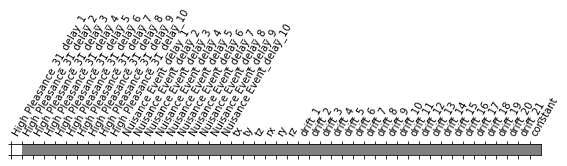

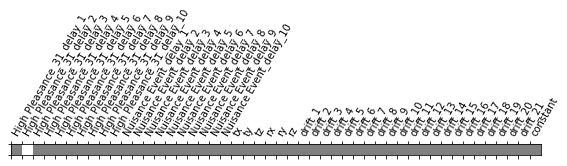

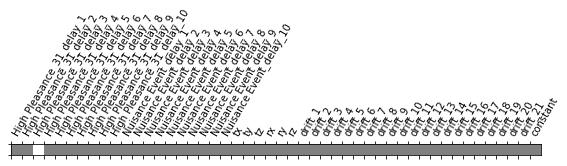

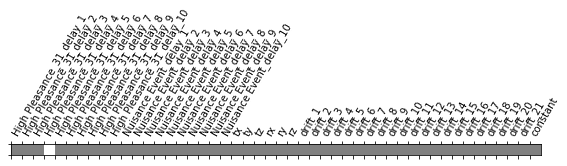

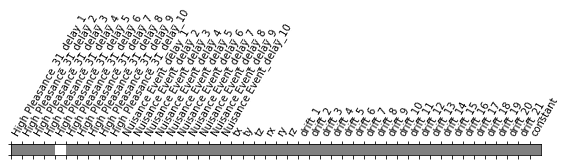

...

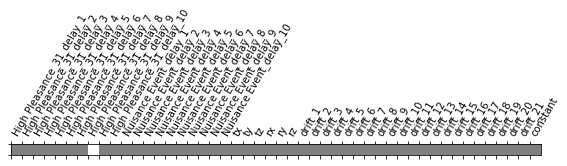

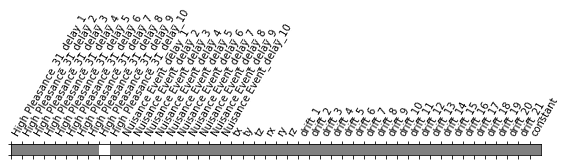

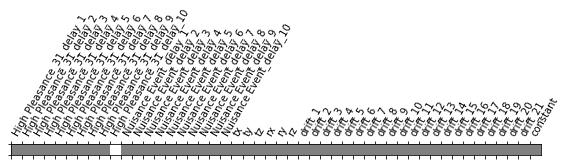

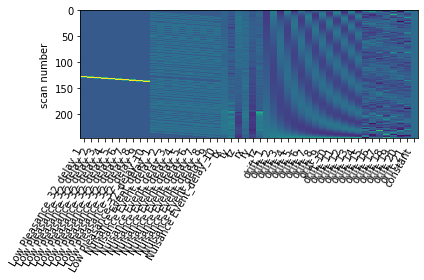

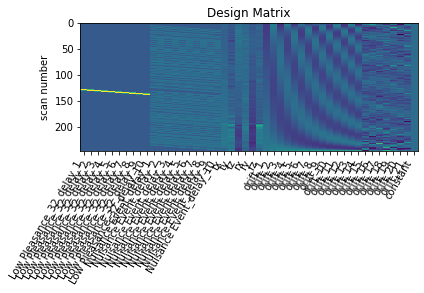

ACTIVITY MATRIX LowPleasance_32
GLM RUN HighPleasance_33


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



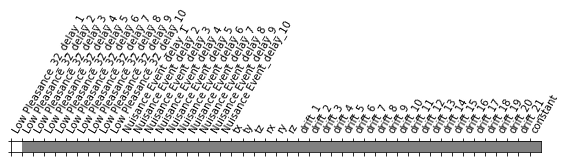

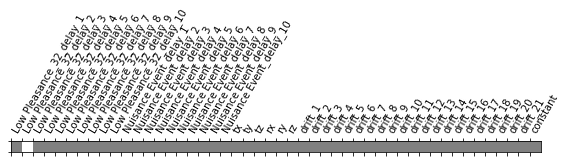

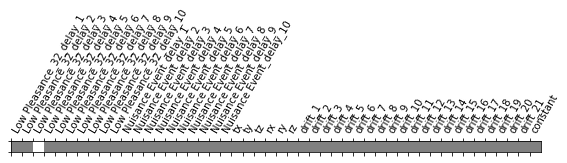

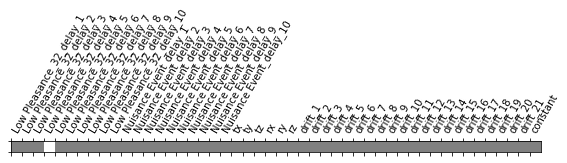

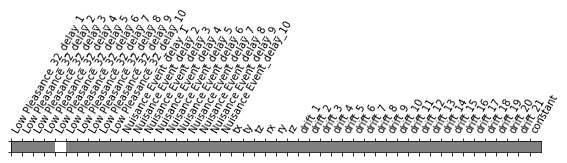

...

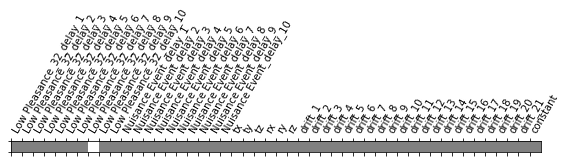

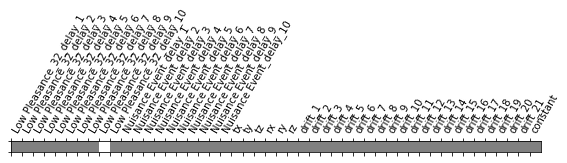

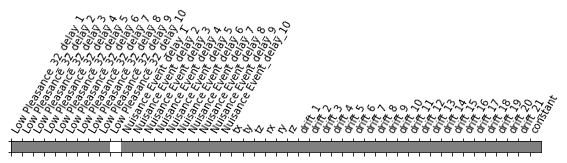

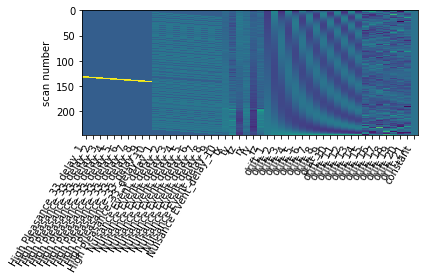

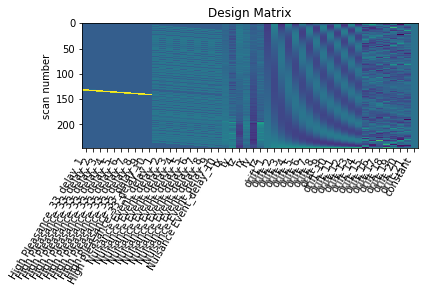

ACTIVITY MATRIX HighPleasance_33
GLM RUN HighPleasance_34


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 17 seconds



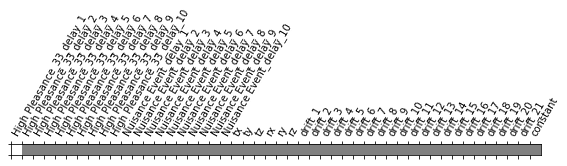

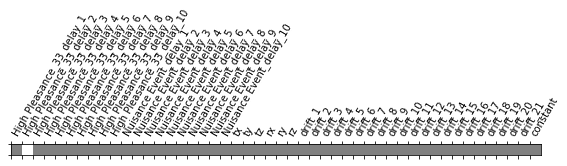

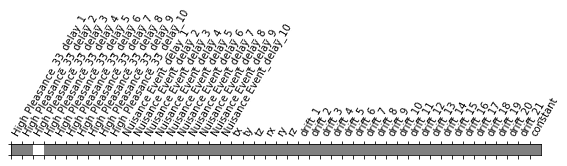

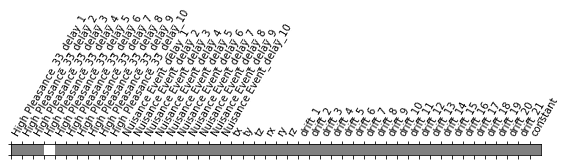

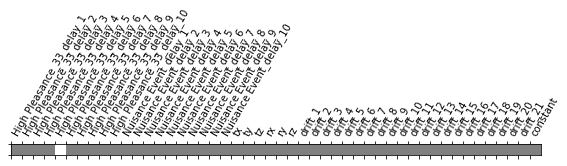

...

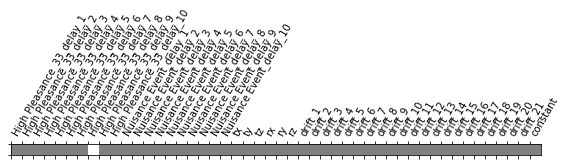

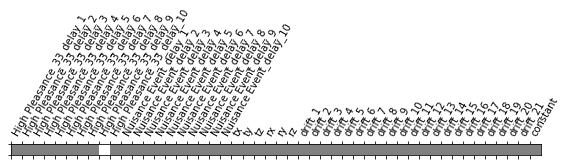

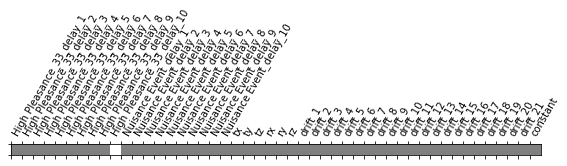

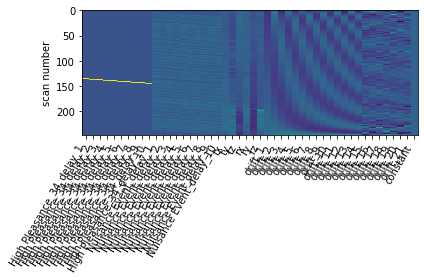

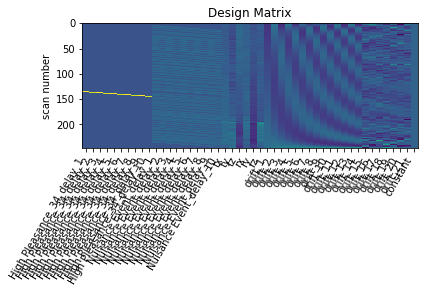

ACTIVITY MATRIX HighPleasance_34
GLM RUN HighPleasance_35


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 20 seconds



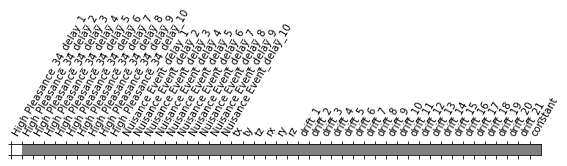

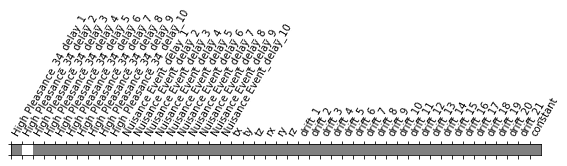

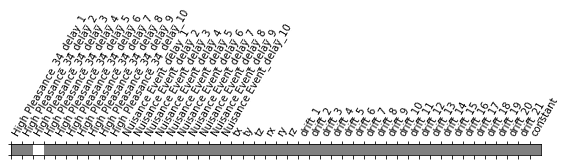

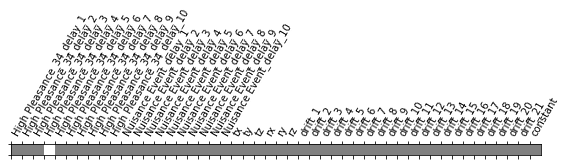

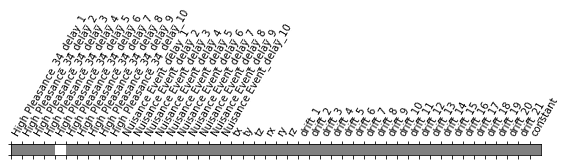

...

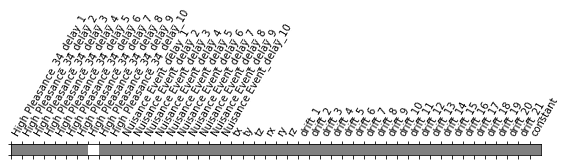

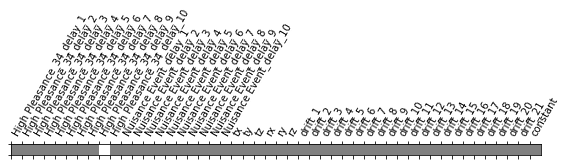

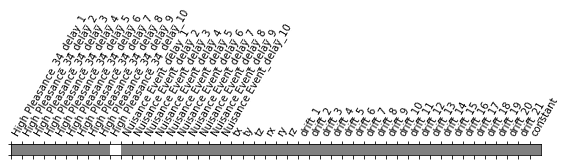

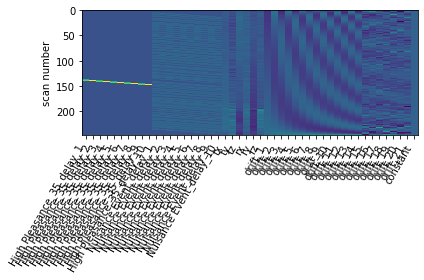

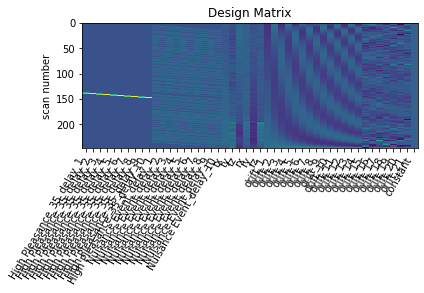

ACTIVITY MATRIX HighPleasance_35
GLM RUN HighPleasance_36


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 17 seconds



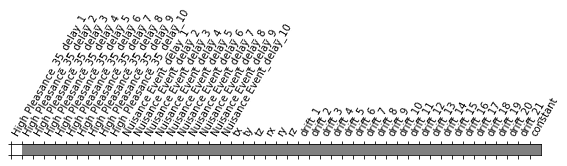

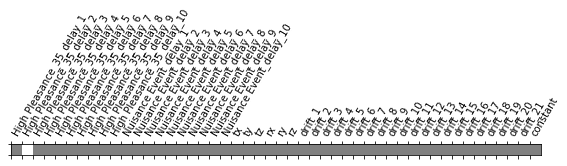

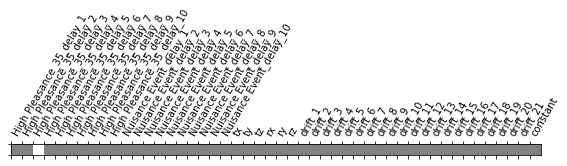

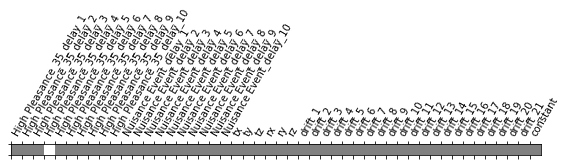

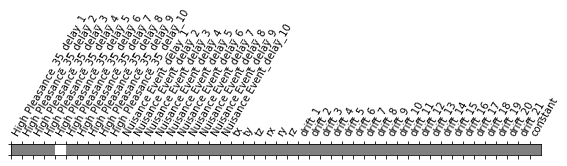

...

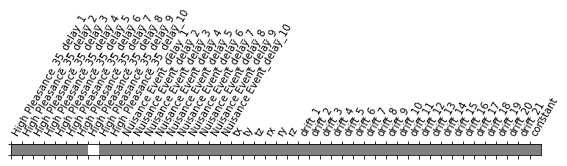

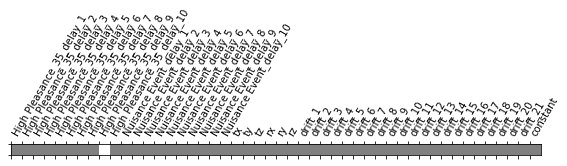

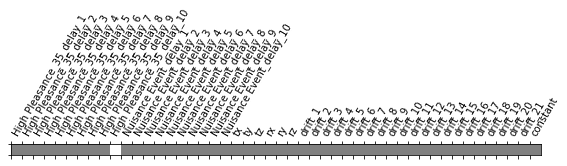

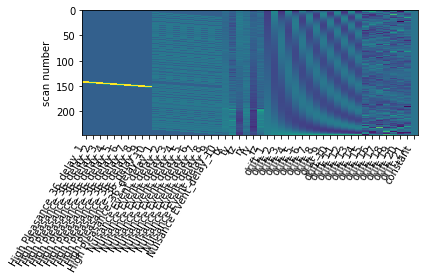

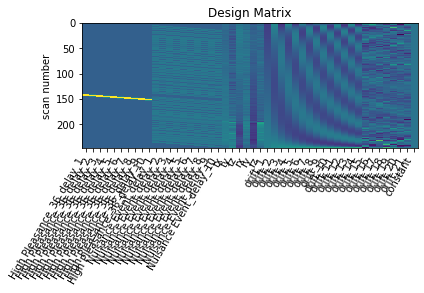

ACTIVITY MATRIX HighPleasance_36
GLM RUN LowPleasance_37


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 18 seconds



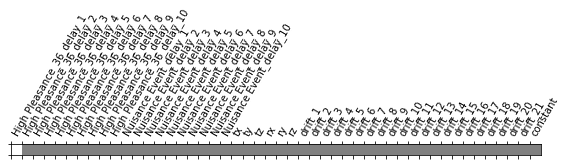

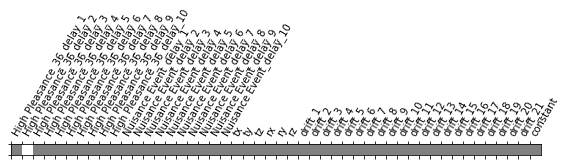

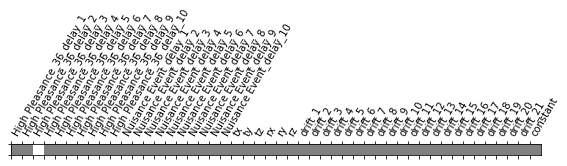

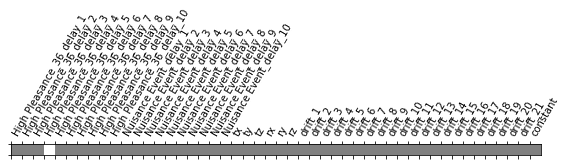

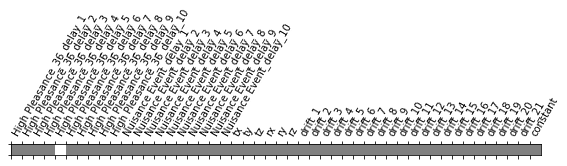

...

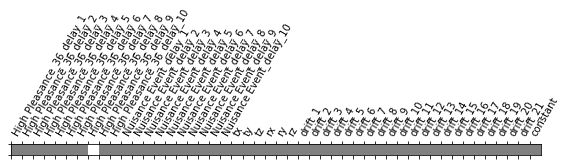

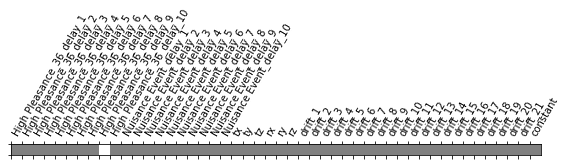

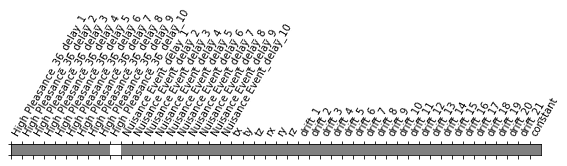

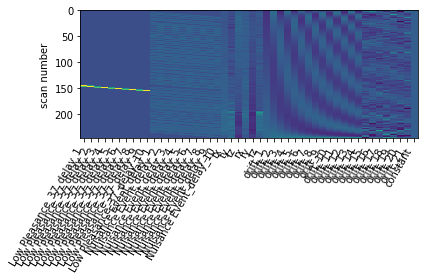

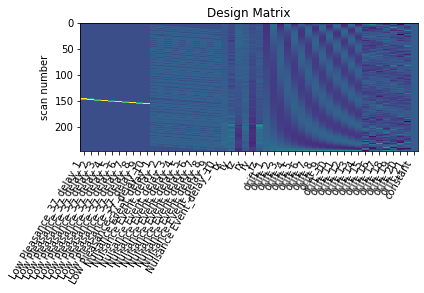

ACTIVITY MATRIX LowPleasance_37
GLM RUN LowPleasance_38


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



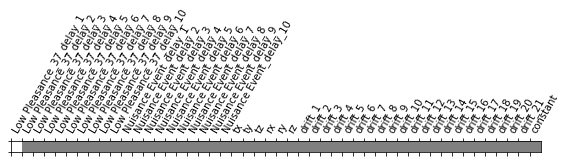

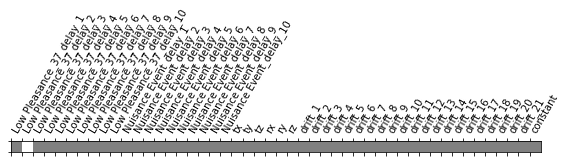

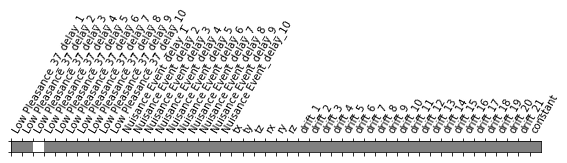

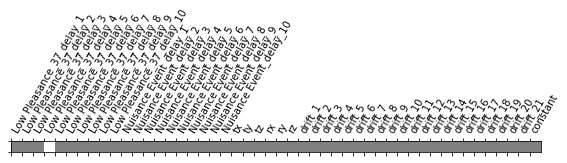

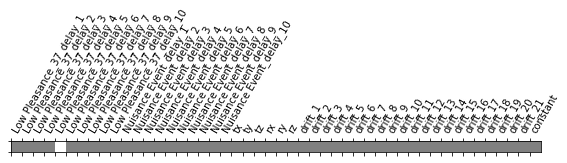

...

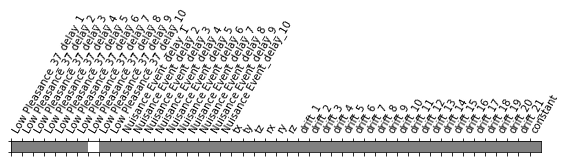

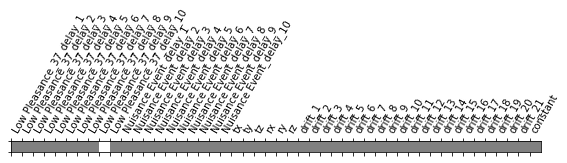

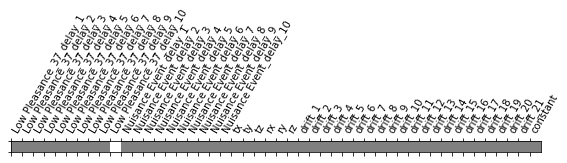

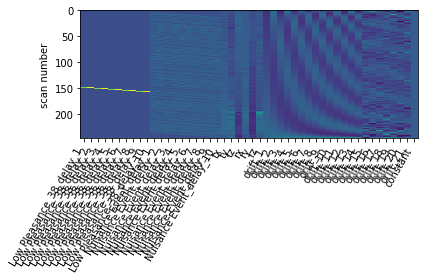

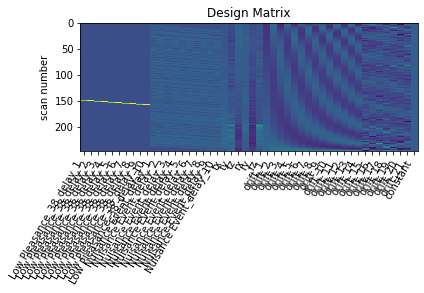

ACTIVITY MATRIX LowPleasance_38
GLM RUN LowPleasance_39


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



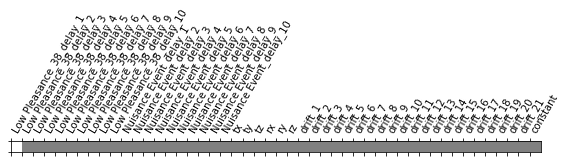

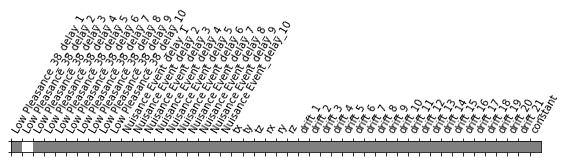

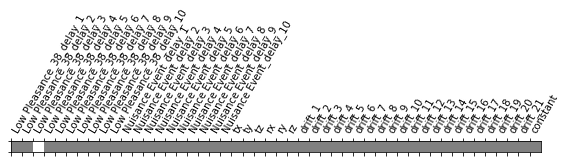

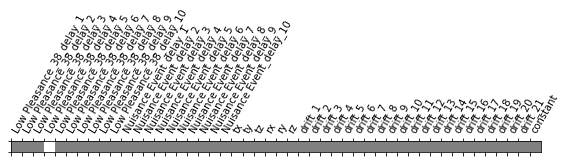

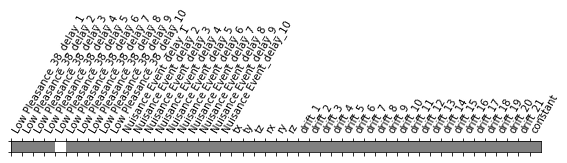

...

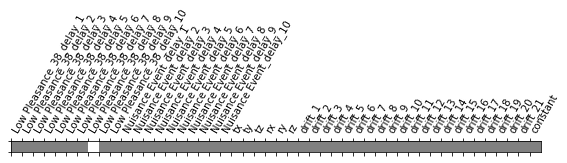

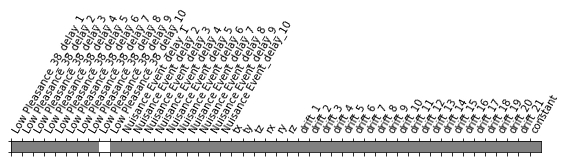

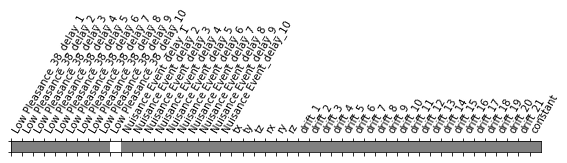

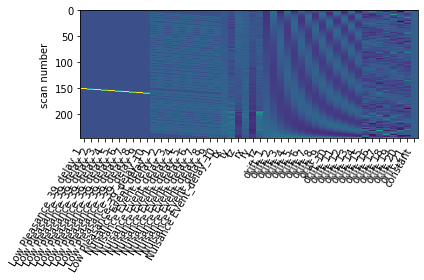

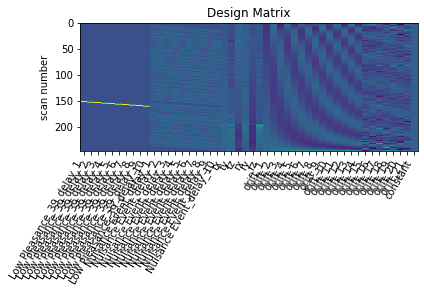

ACTIVITY MATRIX LowPleasance_39
GLM RUN LowPleasance_40


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



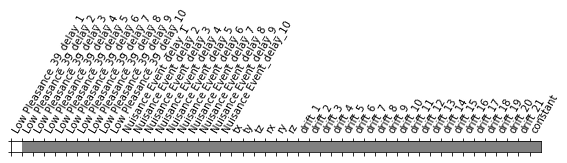

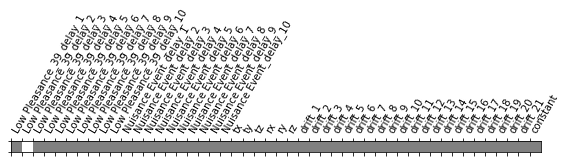

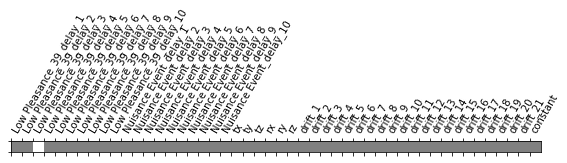

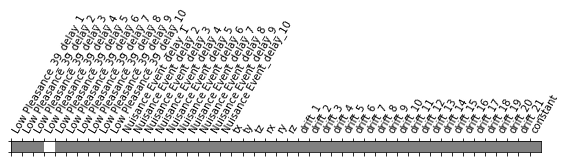

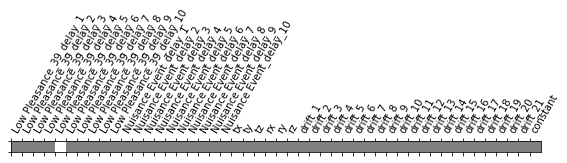

...

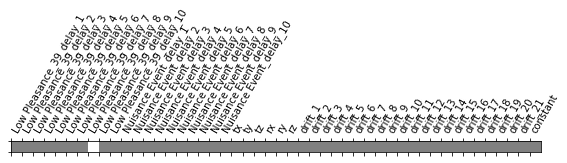

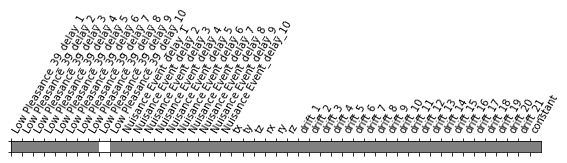

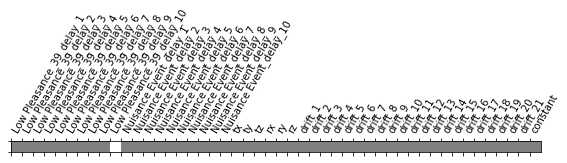

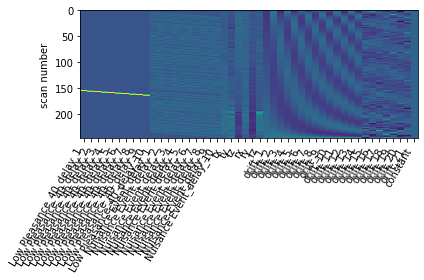

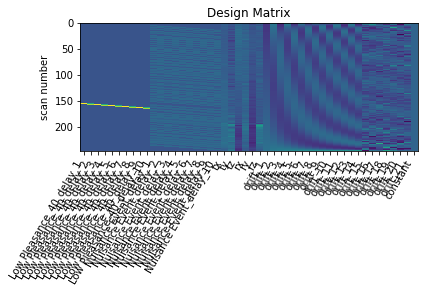

ACTIVITY MATRIX LowPleasance_40
GLM RUN LowPleasance_41


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 18 seconds



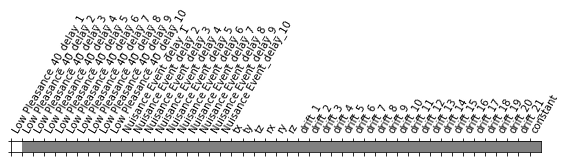

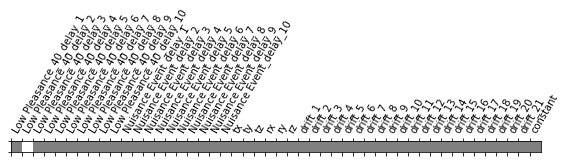

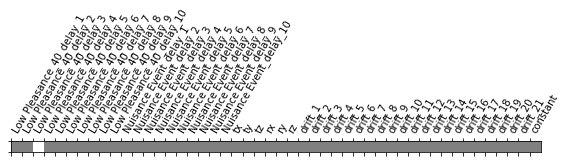

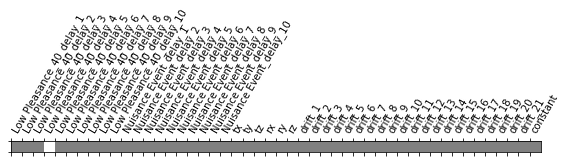

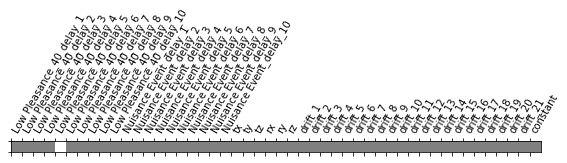

...

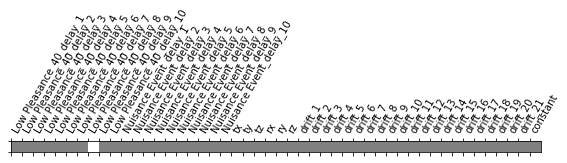

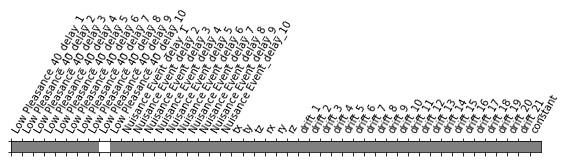

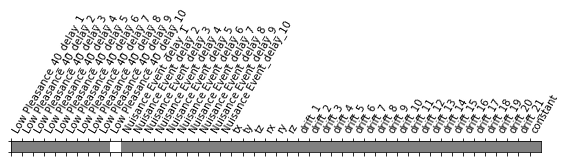

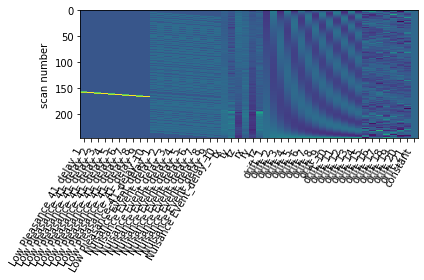

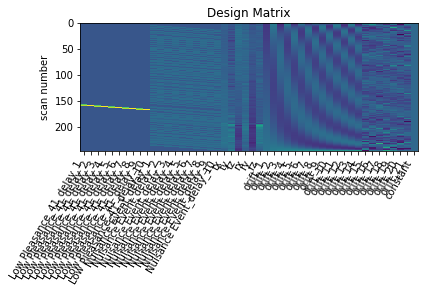

ACTIVITY MATRIX LowPleasance_41
GLM RUN HighPleasance_42


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.3s, 0.0min



Computation of 1 runs done in 17 seconds



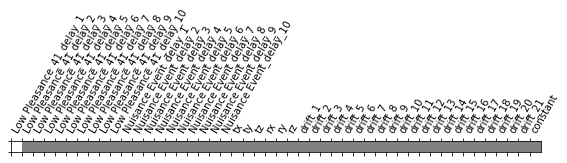

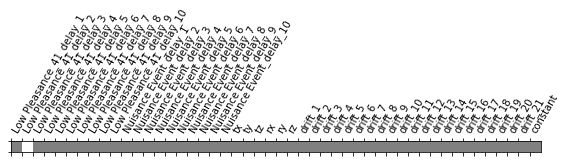

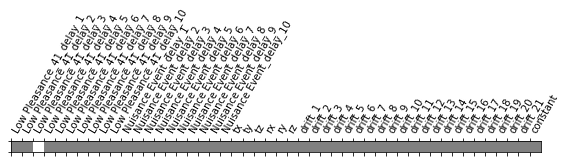

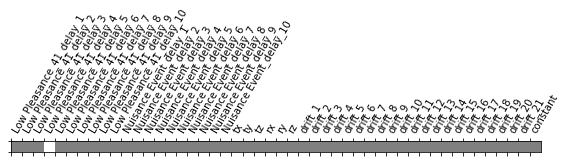

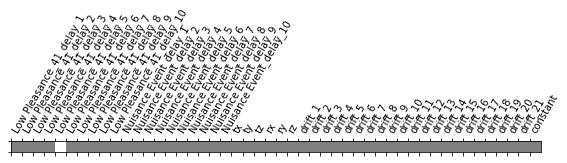

...

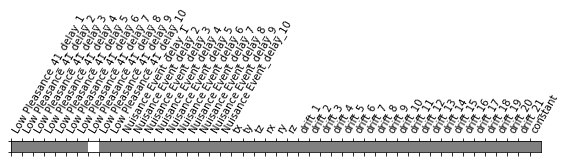

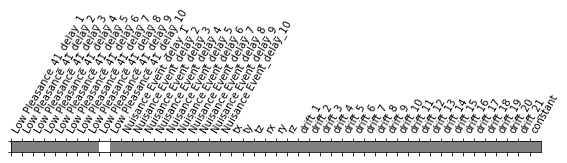

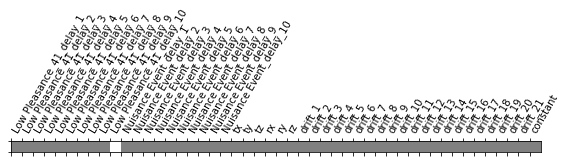

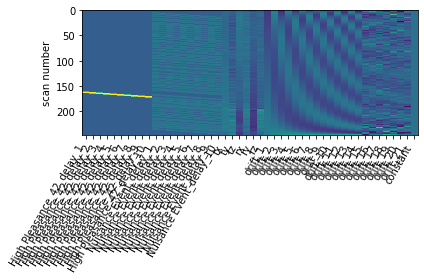

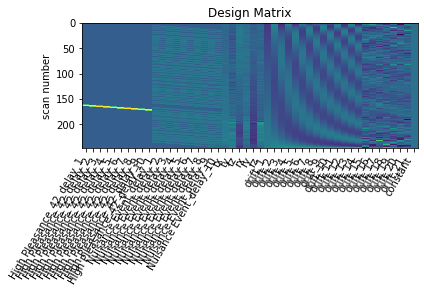

ACTIVITY MATRIX HighPleasance_42
GLM RUN LowPleasance_43


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.3s, 0.0min



Computation of 1 runs done in 17 seconds



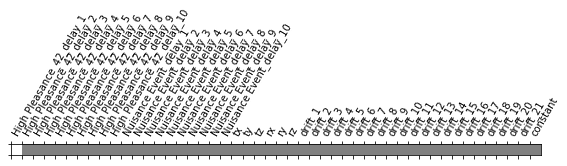

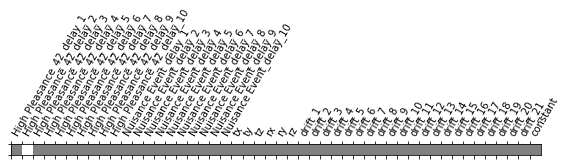

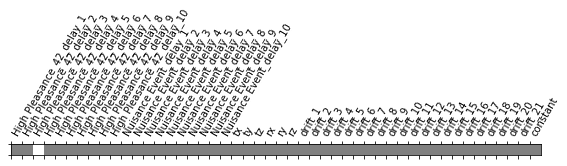

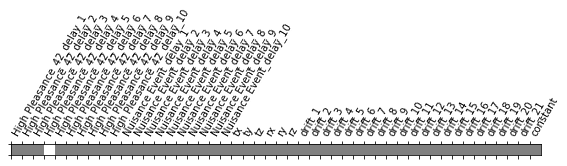

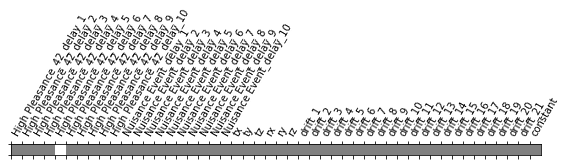

...

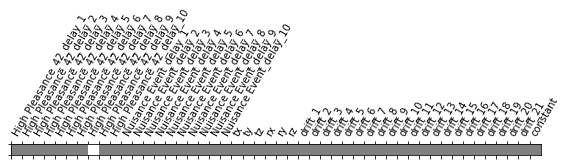

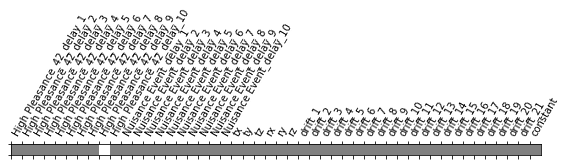

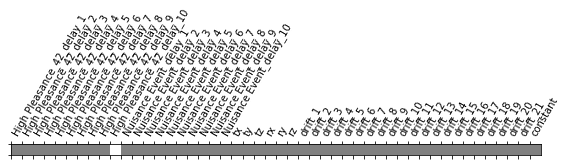

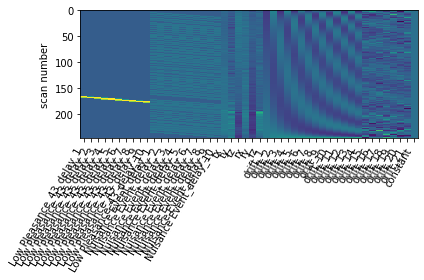

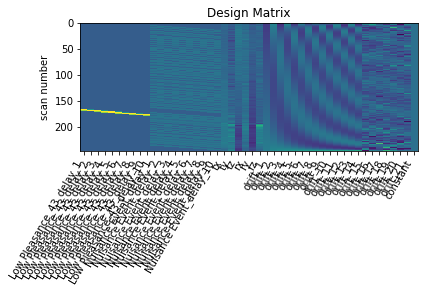

ACTIVITY MATRIX LowPleasance_43
GLM RUN LowPleasance_44


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 14 seconds



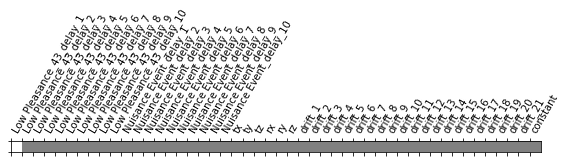

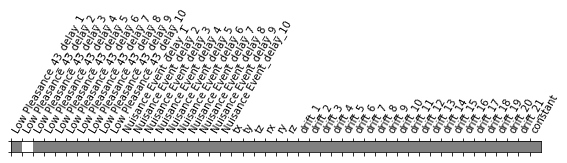

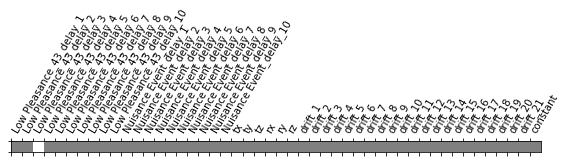

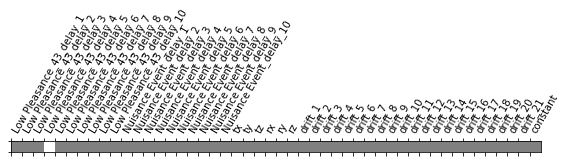

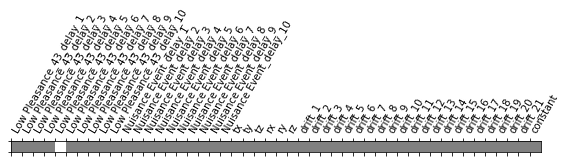

...

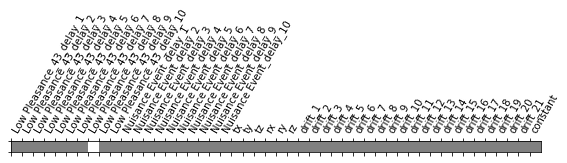

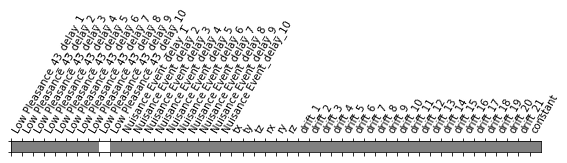

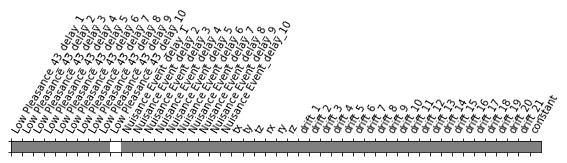

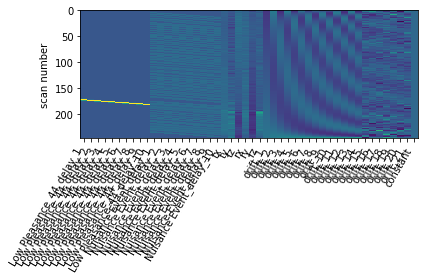

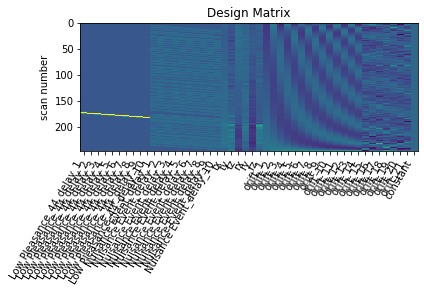

ACTIVITY MATRIX LowPleasance_44
GLM RUN HighPleasance_45


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.2s, 0.0min



Computation of 1 runs done in 17 seconds



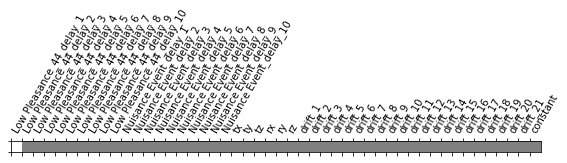

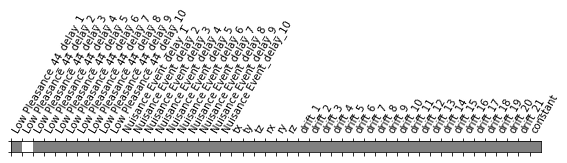

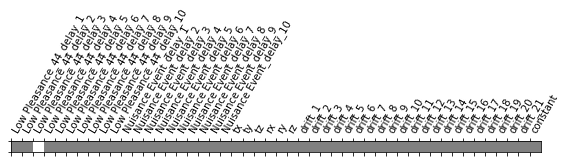

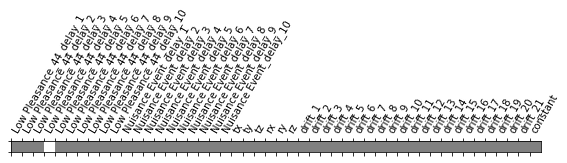

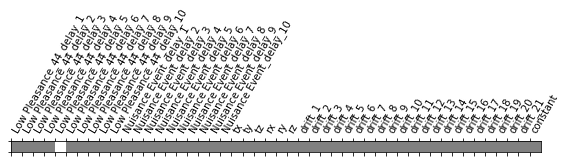

...

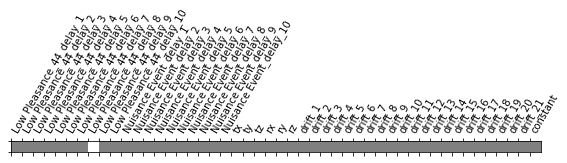

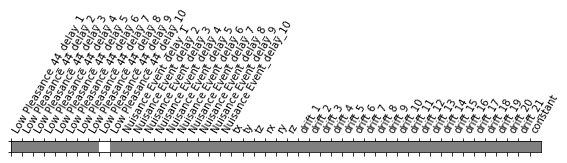

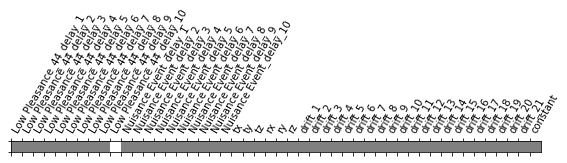

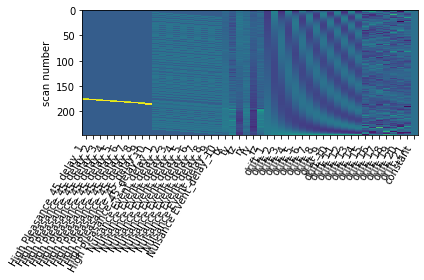

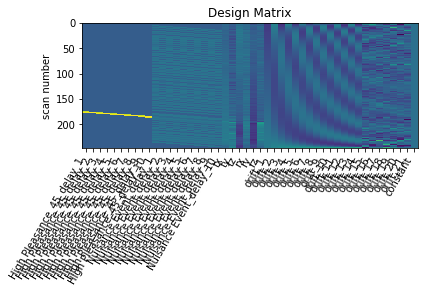

ACTIVITY MATRIX HighPleasance_45
GLM RUN LowPleasance_46


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 15 seconds



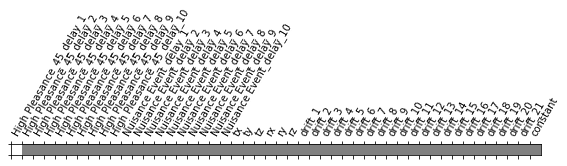

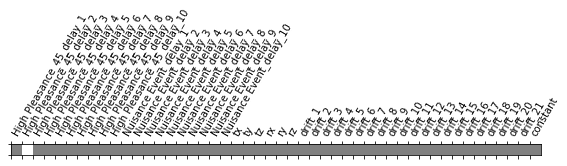

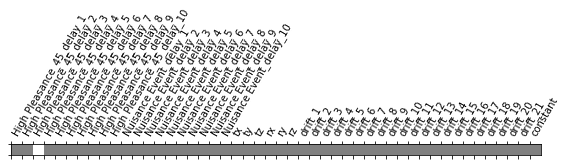

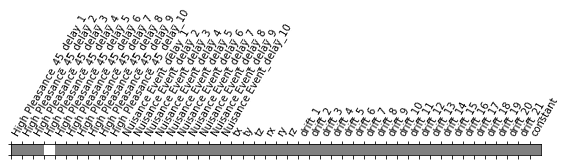

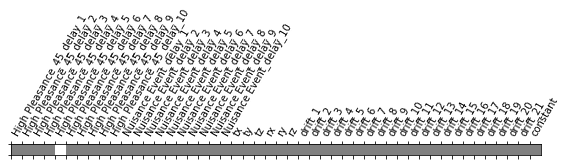

...

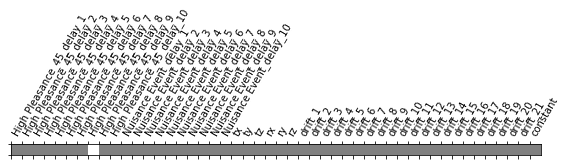

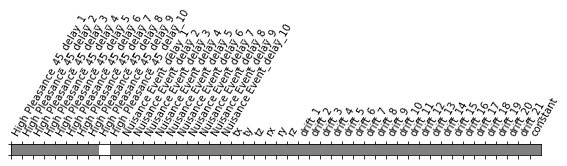

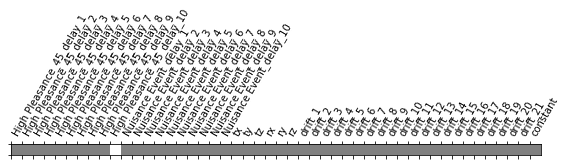

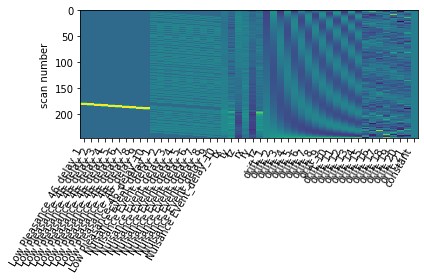

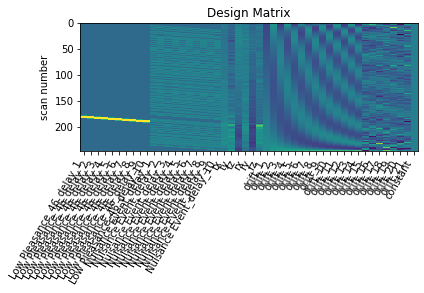

ACTIVITY MATRIX LowPleasance_46
GLM RUN LowPleasance_47


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.3s, 0.0min



Computation of 1 runs done in 15 seconds



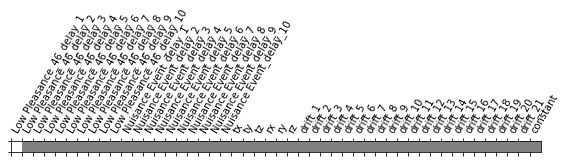

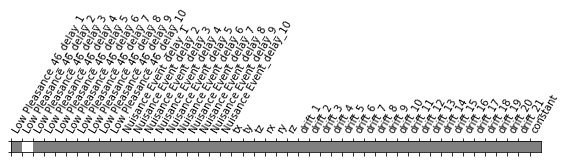

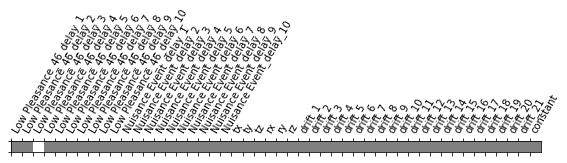

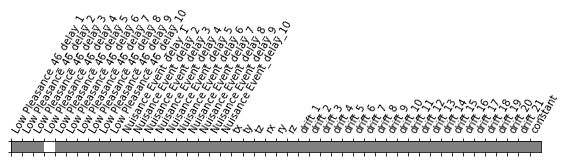

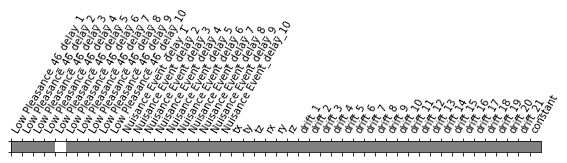

...

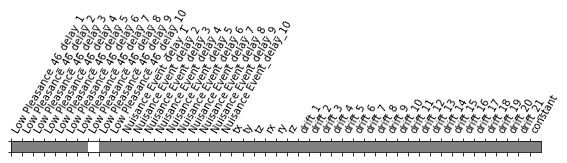

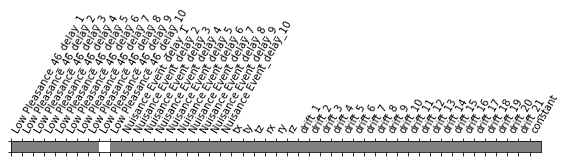

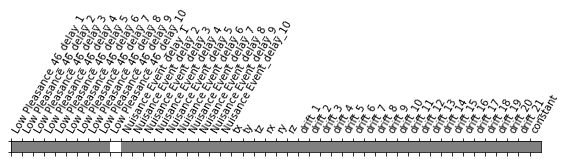

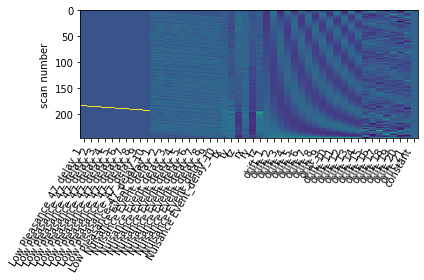

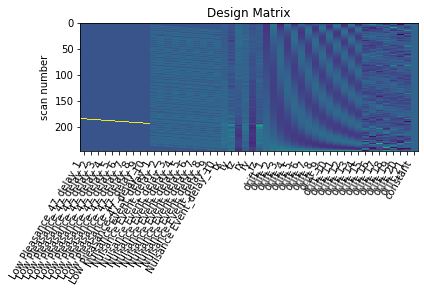

ACTIVITY MATRIX LowPleasance_47
GLM RUN LowPleasance_48


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 17 seconds



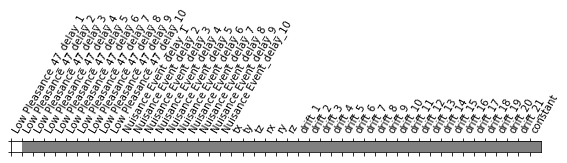

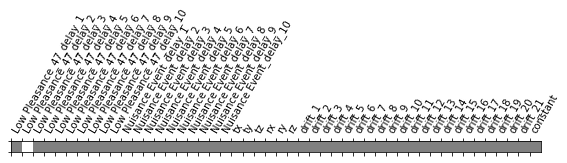

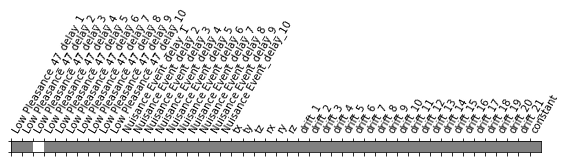

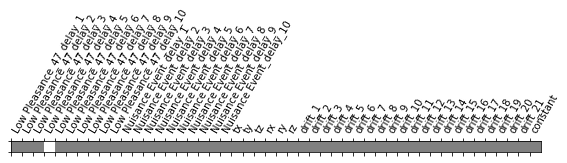

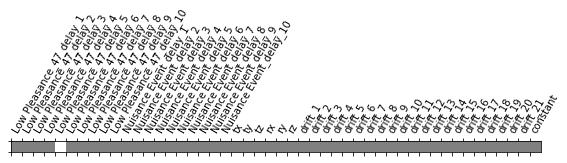

...

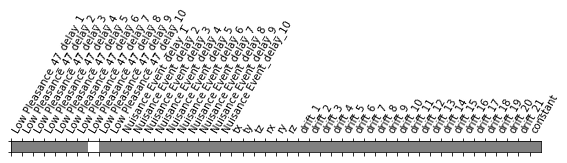

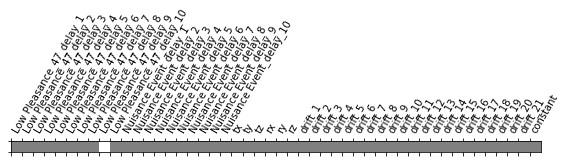

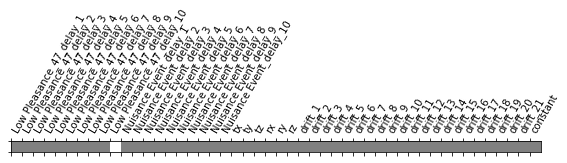

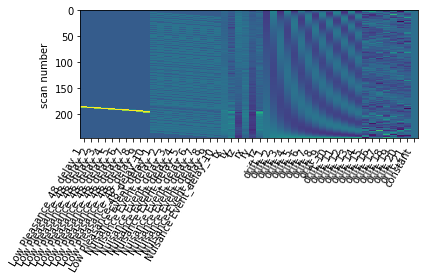

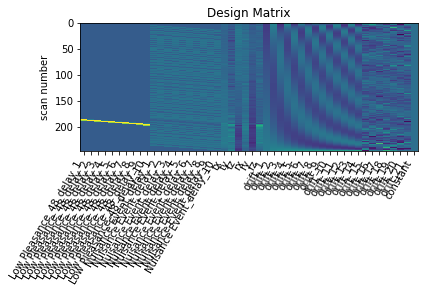

ACTIVITY MATRIX LowPleasance_48
GLM RUN HighPleasance_49


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



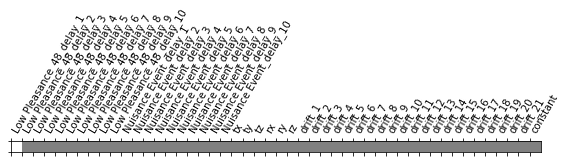

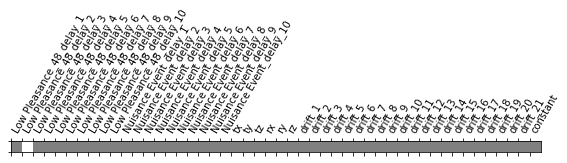

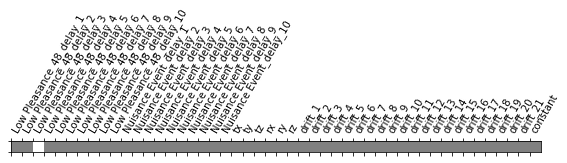

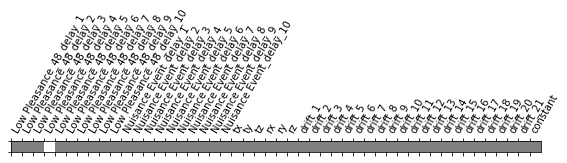

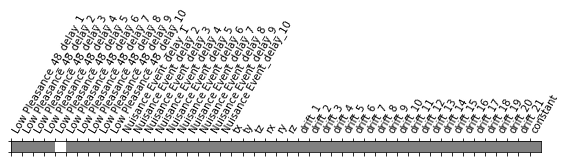

...

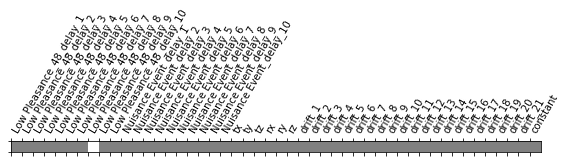

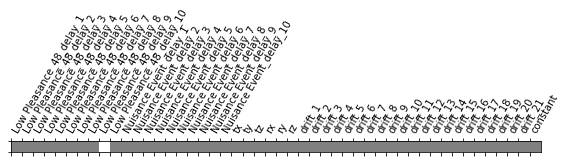

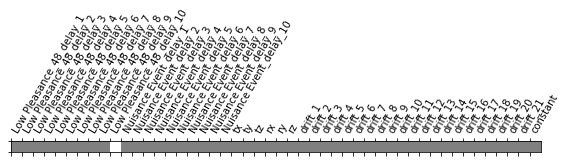

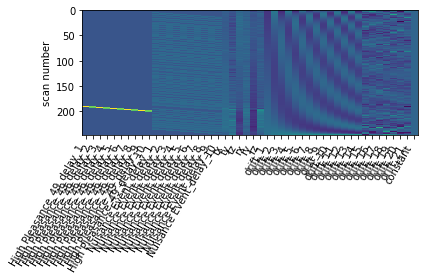

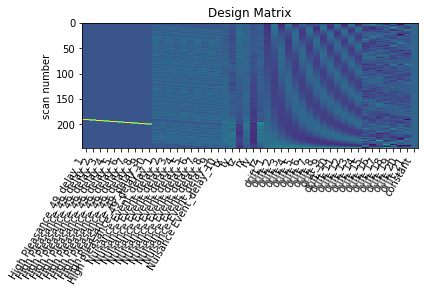

ACTIVITY MATRIX HighPleasance_49
GLM RUN LowPleasance_50


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.4s, 0.0min



Computation of 1 runs done in 17 seconds



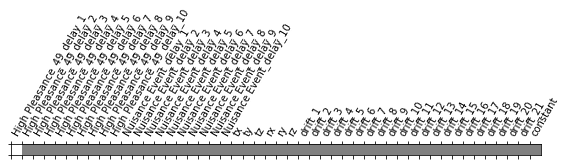

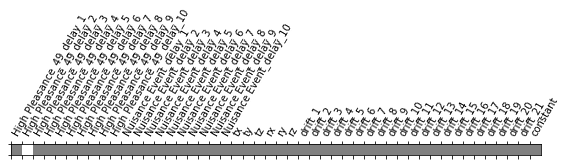

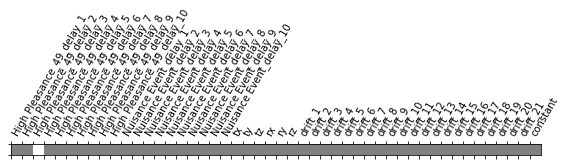

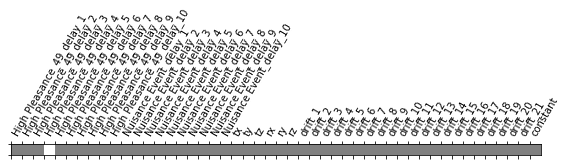

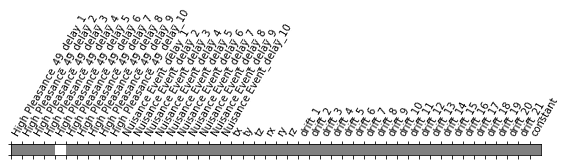

...

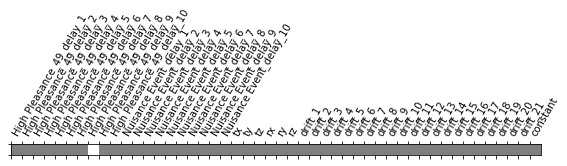

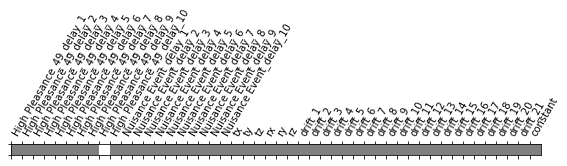

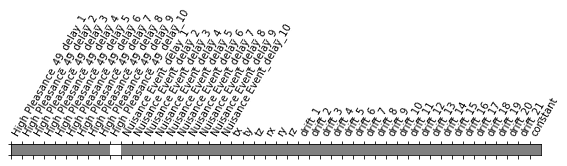

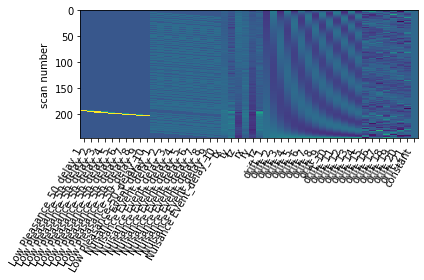

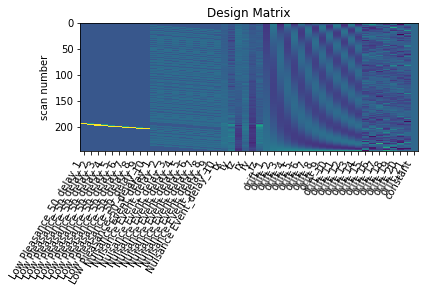

ACTIVITY MATRIX LowPleasance_50
GLM RUN LowPleasance_51


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 18 seconds



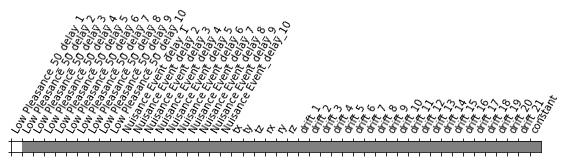

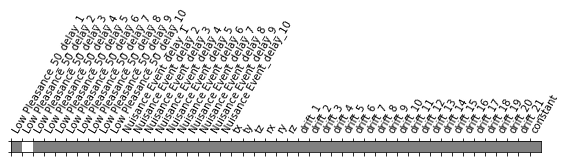

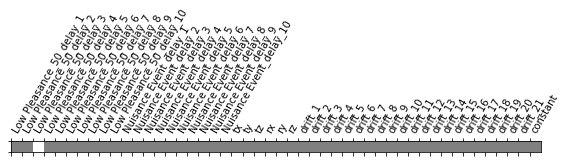

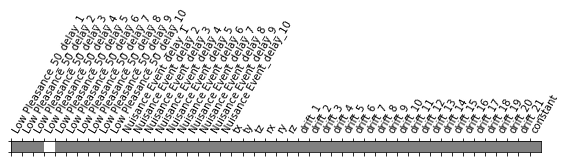

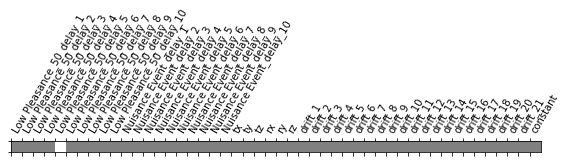

...

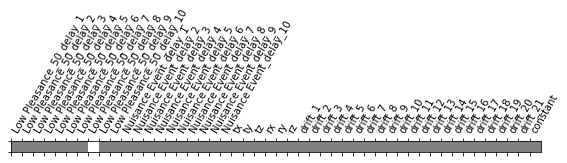

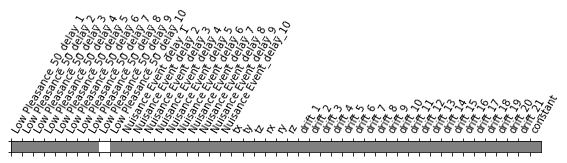

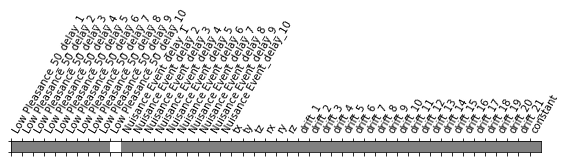

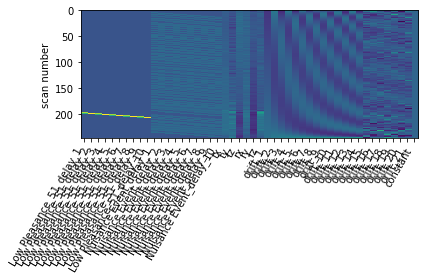

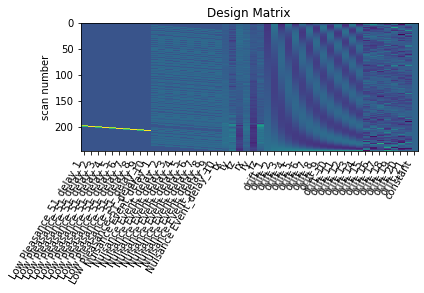

ACTIVITY MATRIX LowPleasance_51
GLM RUN HighPleasance_52


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.4s, 0.0min



Computation of 1 runs done in 17 seconds



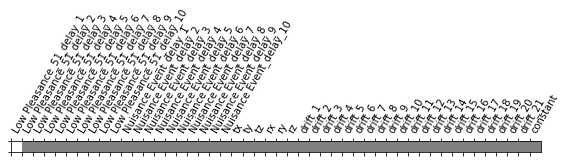

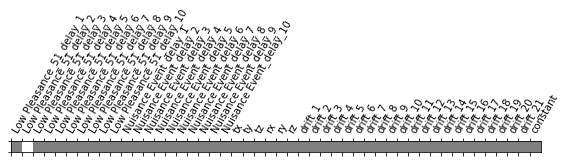

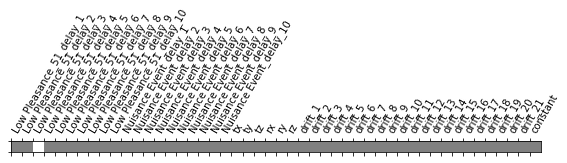

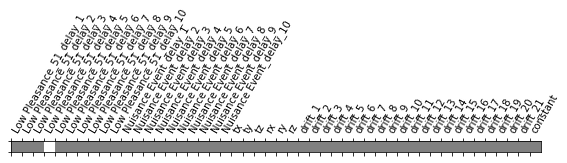

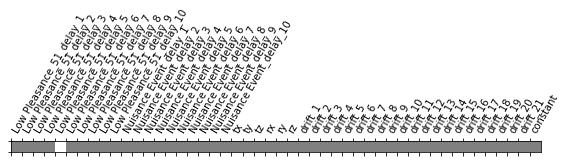

...

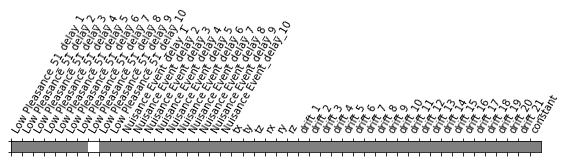

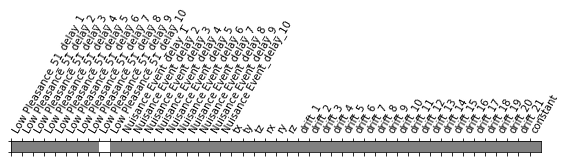

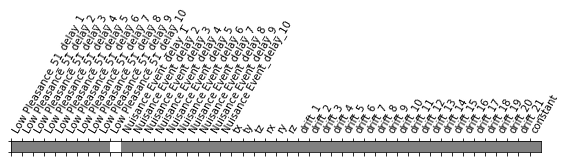

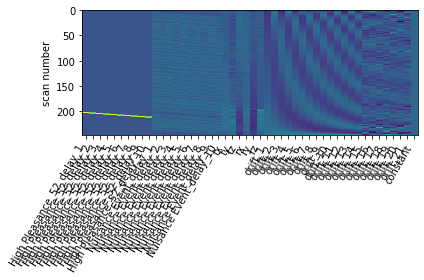

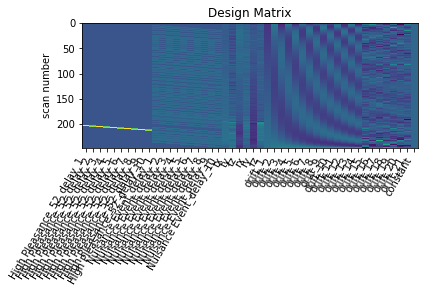

ACTIVITY MATRIX HighPleasance_52
GLM RUN HighPleasance_53


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



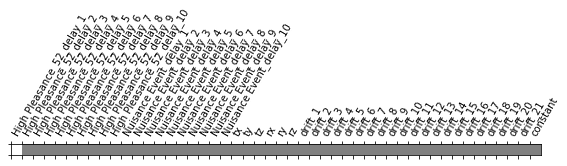

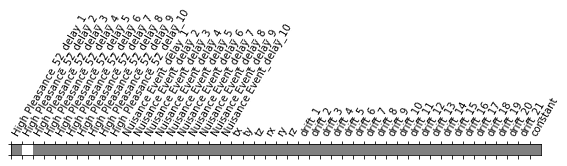

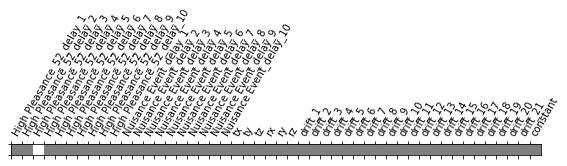

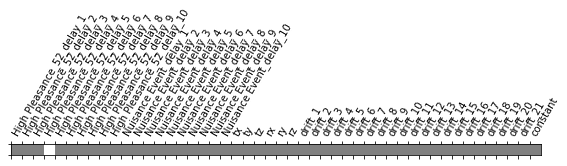

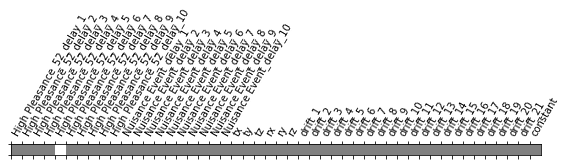

...

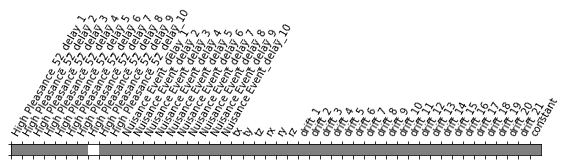

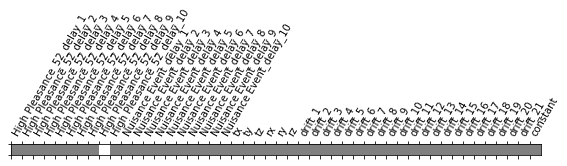

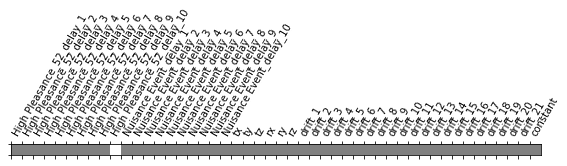

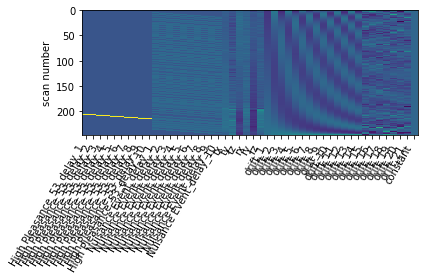

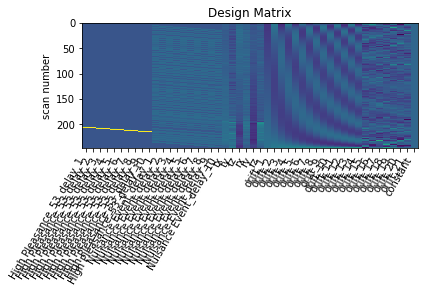

ACTIVITY MATRIX HighPleasance_53
GLM RUN LowPleasance_54


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



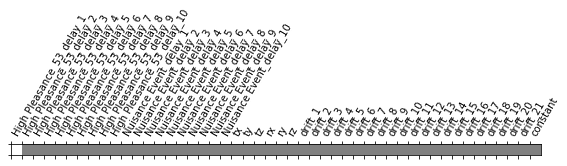

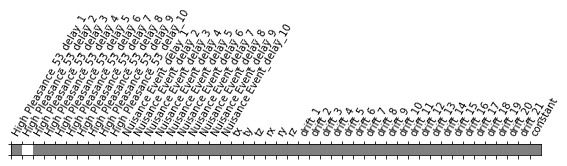

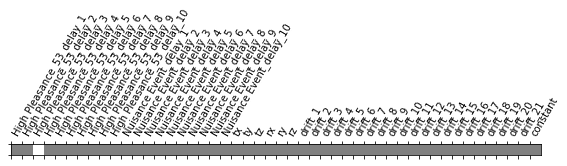

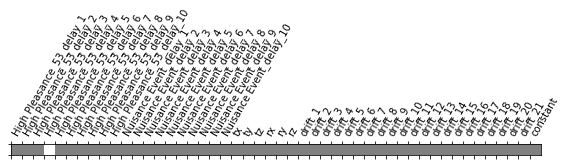

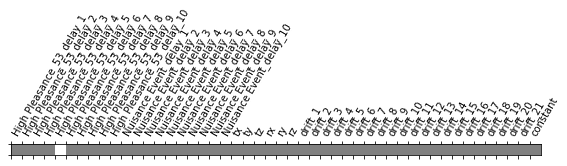

...

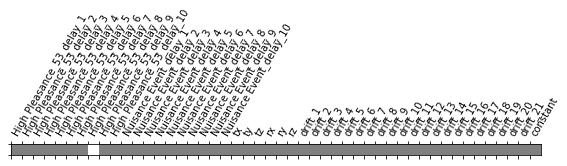

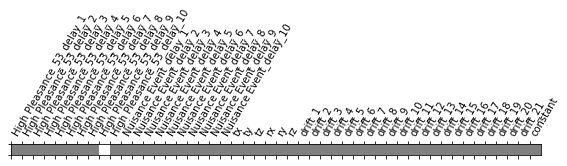

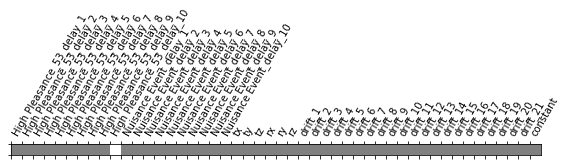

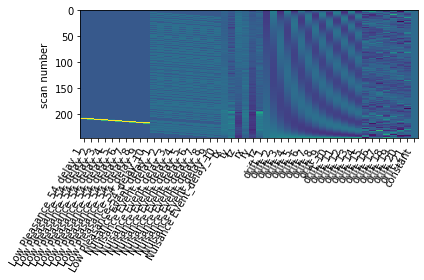

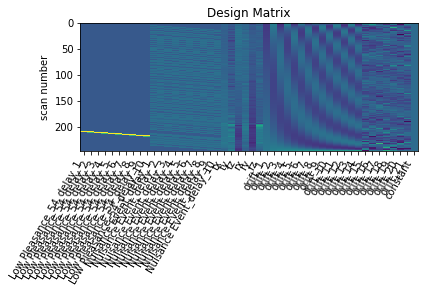

ACTIVITY MATRIX LowPleasance_54
GLM RUN HighPleasance_55


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 17 seconds



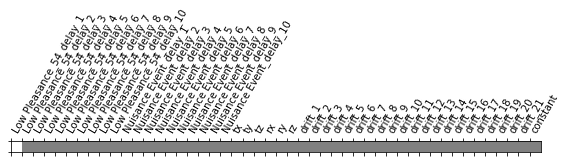

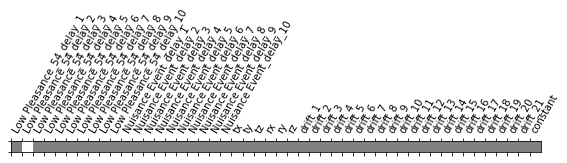

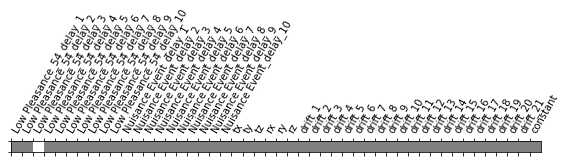

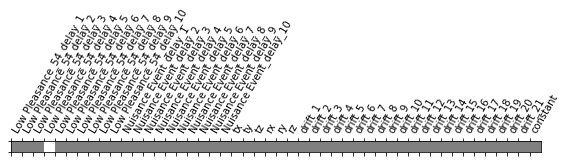

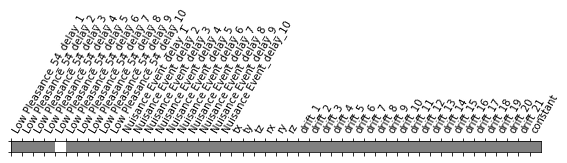

...

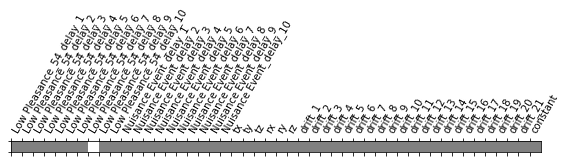

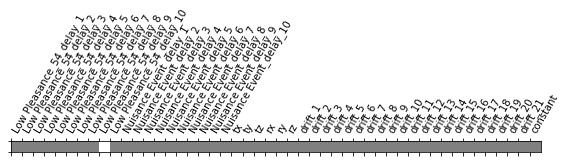

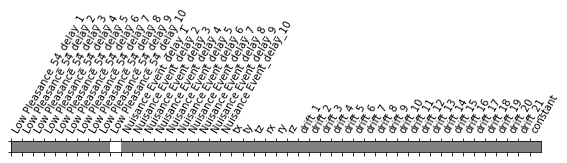

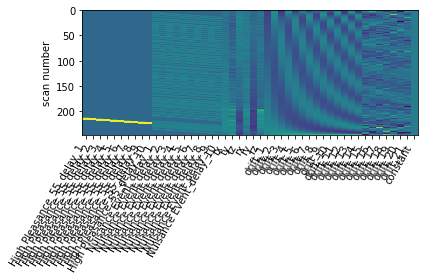

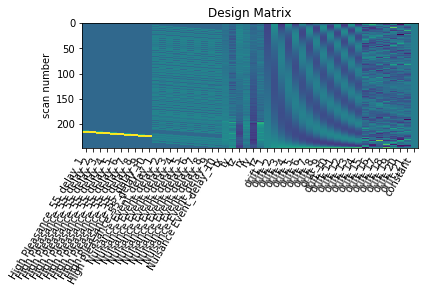

ACTIVITY MATRIX HighPleasance_55
GLM RUN LowPleasance_56


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 19 seconds



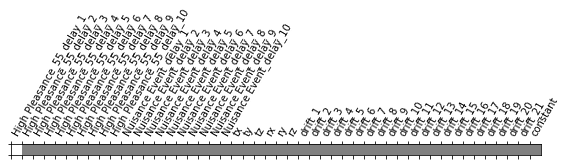

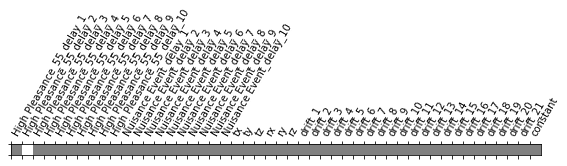

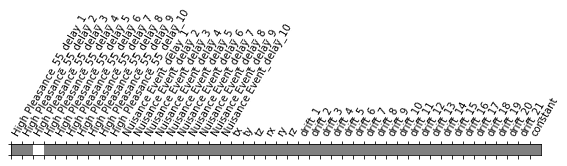

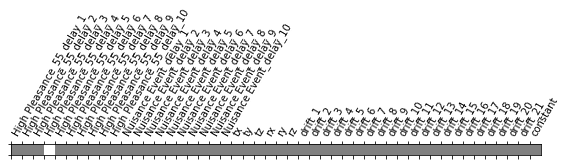

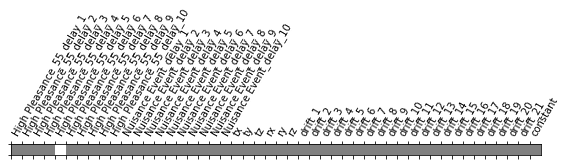

...

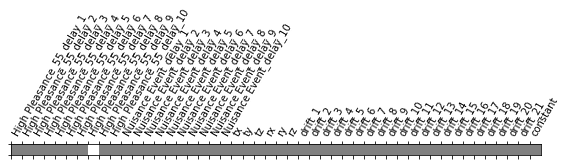

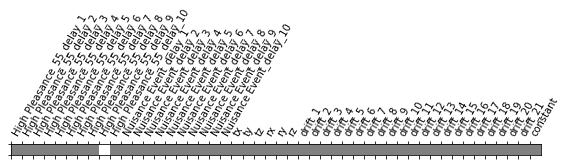

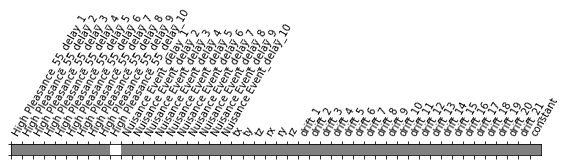

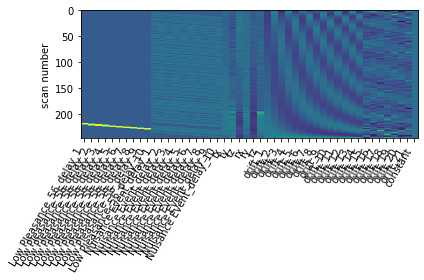

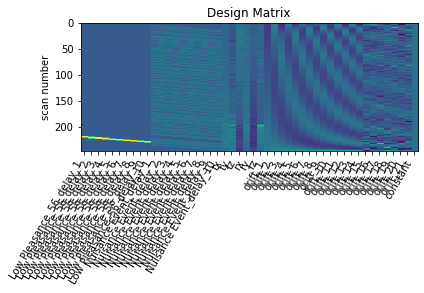

ACTIVITY MATRIX LowPleasance_56
GLM RUN HighPleasance_57


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.4s, 0.0min



Computation of 1 runs done in 16 seconds



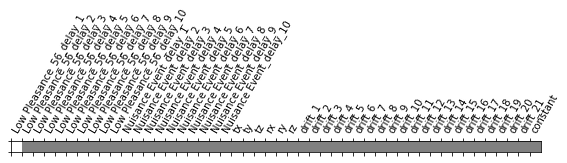

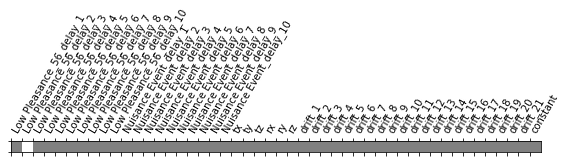

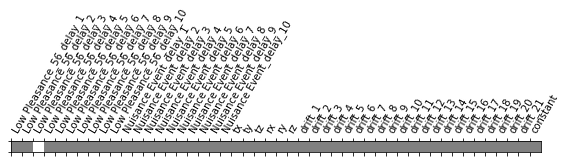

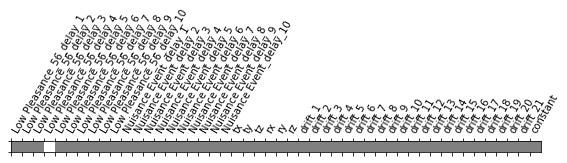

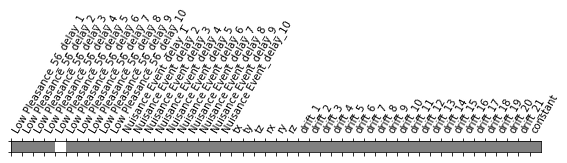

...

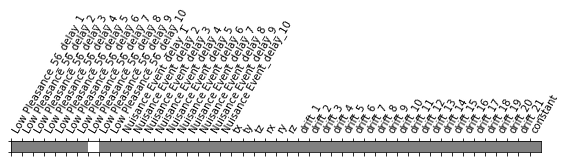

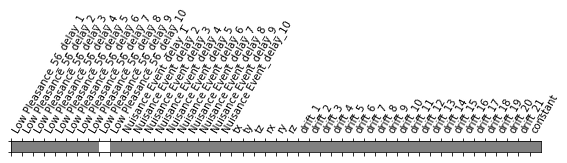

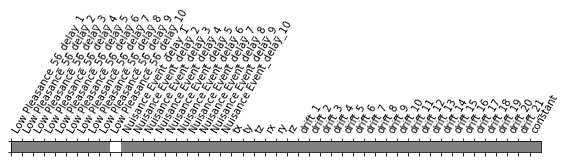

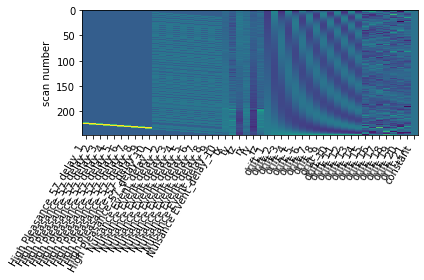

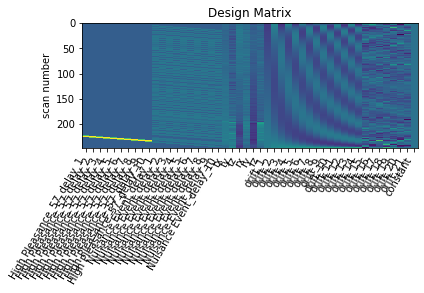

ACTIVITY MATRIX HighPleasance_57
GLM RUN HighPleasance_58


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.1s, 0.0min



Computation of 1 runs done in 18 seconds



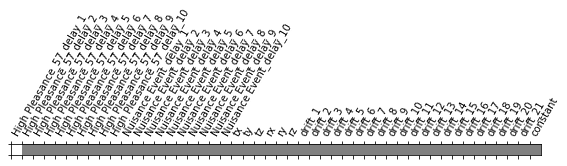

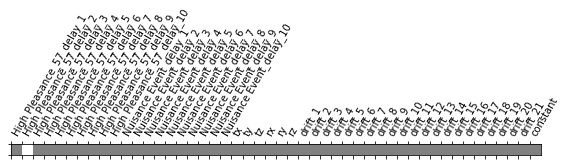

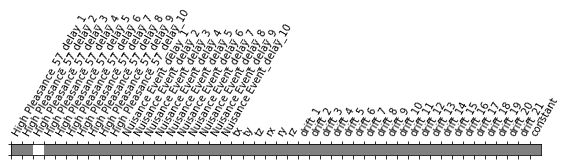

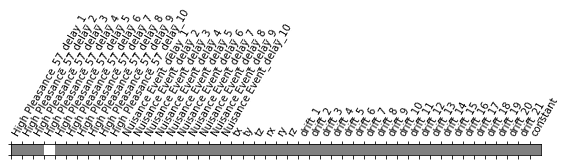

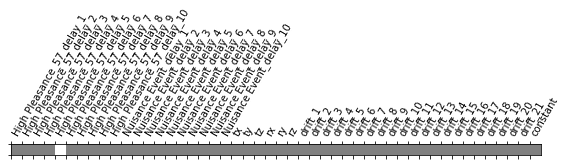

...

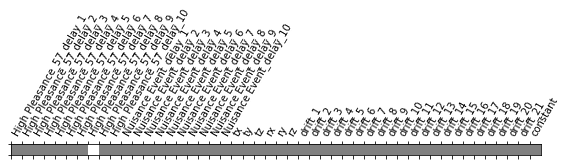

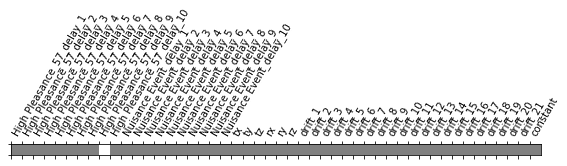

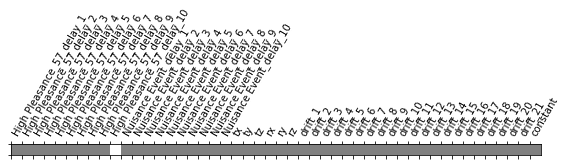

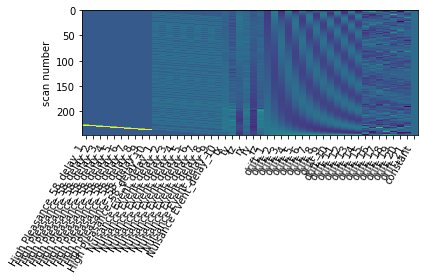

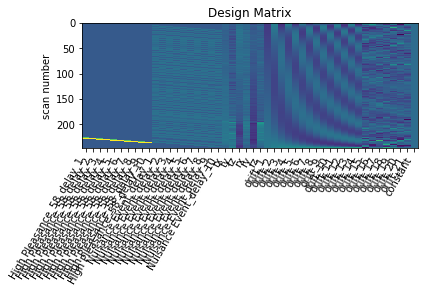

ACTIVITY MATRIX HighPleasance_58
GLM RUN LowPleasance_59


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 16 seconds



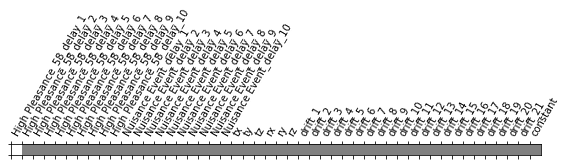

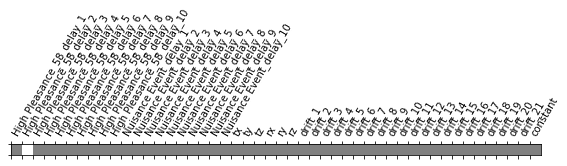

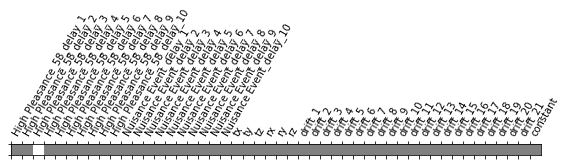

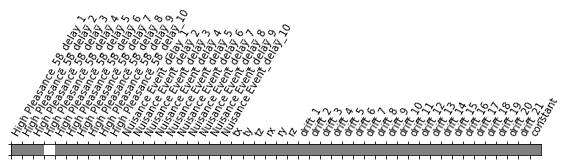

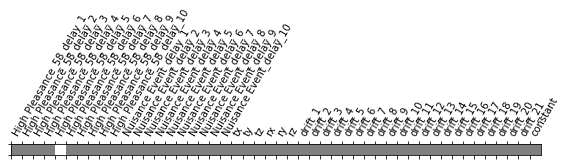

...

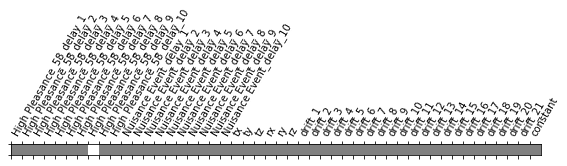

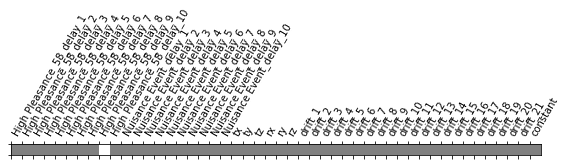

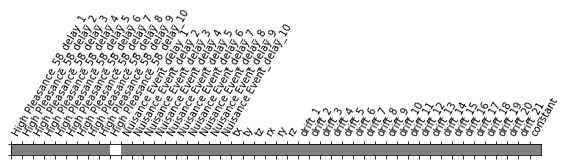

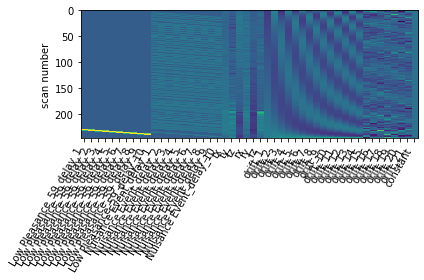

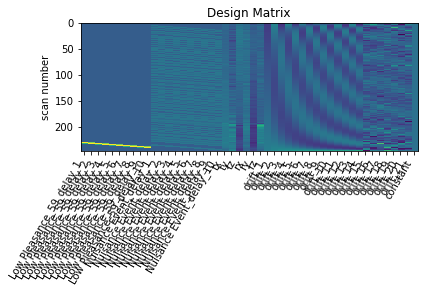

ACTIVITY MATRIX LowPleasance_59
GLM RUN LowPleasance_60


Computing run 1 out of 1 runs (go take a coffee, a big one)


________________________________________________________________________________
[Memory] Calling nistats.first_level_model.run_glm...
run_glm(array([[ -95.317894, ...,  -99.388336],
       ...,
       [ -97.43523 , ..., -101.26904 ]], dtype=float32), 
array([[0., ..., 1.],
       ...,
       [0., ..., 1.]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 1.0s, 0.0min



Computation of 1 runs done in 17 seconds



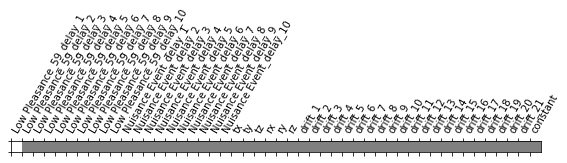

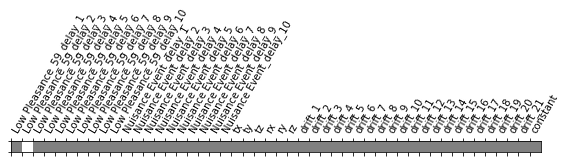

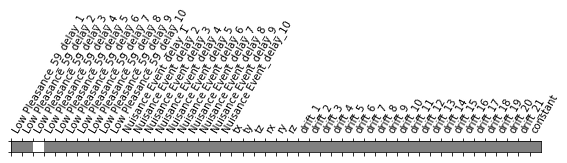

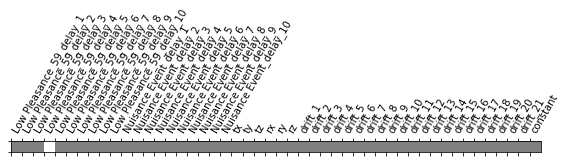

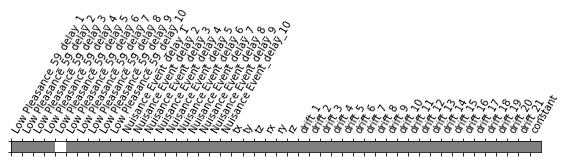

...

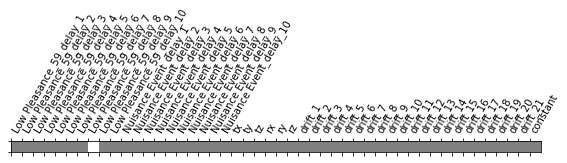

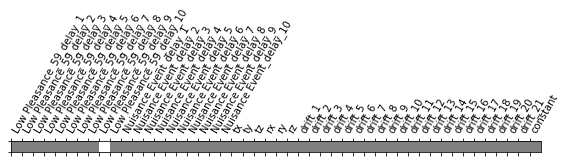

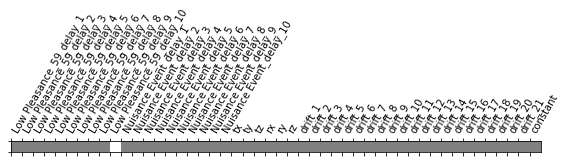

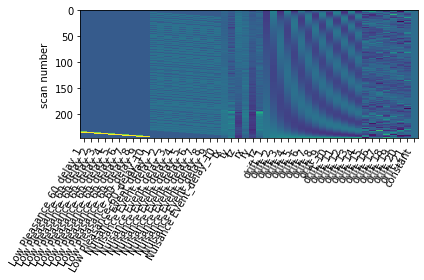

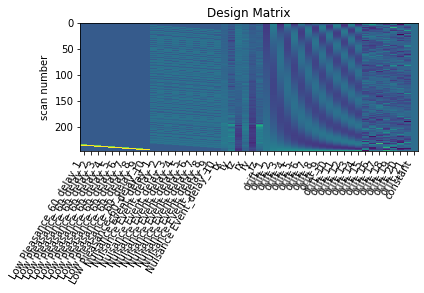

ACTIVITY MATRIX LowPleasance_60


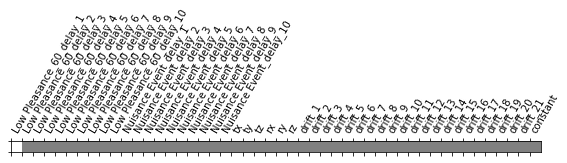

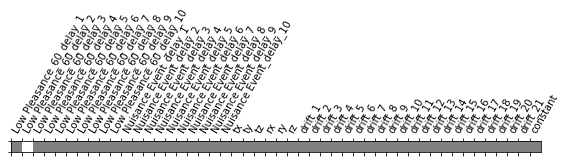

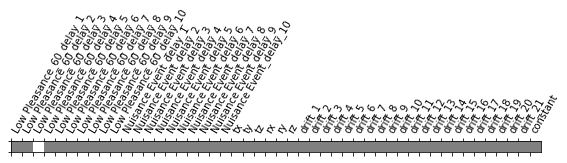

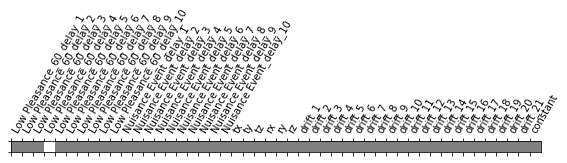

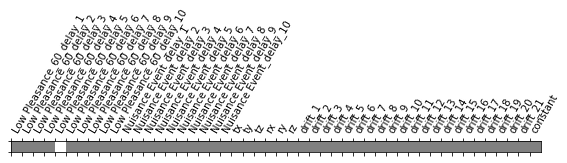

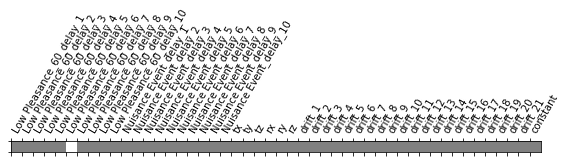

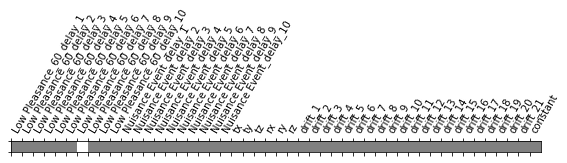

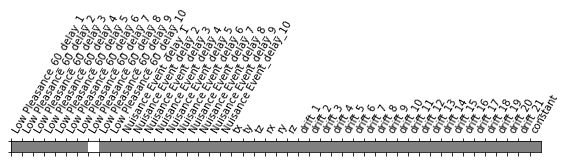

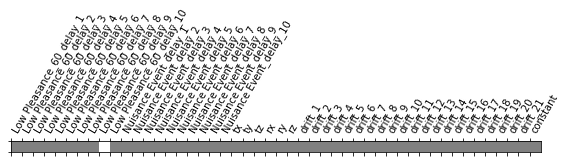

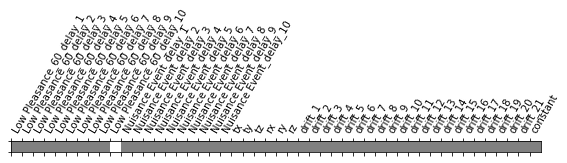

In [62]:
t1 = time.time()
y, X =fbr_separate_method_comp(task=task,
                          data_path=data_path,
                          events_path=events_path,
                          motion_param_path=motion_param_path,
                          cache_mem_path=cache_mem_path,
                          activity_mat_saving_path=None,
                          analysis_type='High_Low_Pleasance',
                          param_modulation=False,
                          t_r=t_r,
                          drift_model=drift_model,
                          drift_order=21,
                          fbr_expected_tr_delay=10,
                          pre_whitening_spec=pre_whitening_spec,
                          apply_trans_mask=True,
                          roi_img=mask_img,  
                          hpf_cut=hpf_cut,
                          smoothing_fwhm=hpf_cut,
                          standardize=True,
                          detrend=True,minimize_memory=False)
t2 = time.time()

In [64]:
"Calculation Time : {} mins !".format((t2-t1)/60)

'Calculation Time : 23.90687410036723 mins !'

In [65]:
X.shape

(60, 76870)

#### Search Space of 76870 dimensions for a data sample of 60  (label, ROI activity) pair

### Feature Selection

#### Filter

In [67]:
transformer = GenericUnivariateSelect(mutual_info_classif, mode='k_best', param=59)

In [68]:
X_trans = transformer.fit_transform(X, y)

In [75]:
X_trans.shape

(60, 59)

#### Data Preparation

In [70]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

#### Non Linear SVM ( most powerful SVM model)

In [71]:
clf = svm.NuSVC(gamma='auto')

In [72]:
clf.fit(X_train,y_train)

NuSVC(cache_size=200, class_weight=None, coef0=0.0,
      decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
      max_iter=-1, nu=0.5, probability=False, random_state=None, shrinking=True,
      tol=0.001, verbose=False)

In [73]:
clf.score(X_test,y_test)

0.16666666666666666

The model performs worst than randomness ( 0.5 score)

Let'try with a Random Forest model

In [76]:
rf = RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [77]:
rf.score(X_test,y_test)

0.3333333333333333

2 times better than the SVM but not quite there.

One obvious explaination is that there is not enough training examples to let the models converge in their weight adjustments. This effect is impacted by the tremendous number of features

Data augmentation seems the direct path to better results

We will double the training examples by inclunding the other run data for each task in the subject wise MVPA
This will double the dataset
Then a group wise MVPA by including all the (label,ROI activity) pairs for a given task will generate a lot of training examples. Unfortunetely, this will rise issues namely due to intersubject variability not structurally as it will be controlled by Spatial Normalization but functionnally, thus impeding the classification model to generalize